# Imports

In [1]:
import os
os.environ["GWPY_RCPARAMS"] = "False"
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from functions import (
    value_maker, data_loader, load_data, plot_2d, value_maker,
    generate_random_x_coordinates_below_curve, calculate_probability, 
    compute_probabilities, print_probs, plot_comparison,
    compare_multiple_runs, plot_bias_differences_by_parameter, plot_heatmap,
    plot_nd_heatmap, compute_nd_probabilities, plot_nd_comparison,
    compute_costs, print_costs, plot_costs, generate_filename,
    plot_cost_and_probability_comparison,
    bayes_factor, print_bayes_factor, bf_plotter
)

# Initialise the Data

In [2]:
mass_ratio_list = ['q_1', 'q_15', 'q_1_n1000', 'q_2', 'q_25', 'q_3', 'q_35', 'q_4', 'q_45', 'q_5']
label_list, parent_dir = ['unbiased', 'biased'], 'mass_ratio'
mass_ratio_data = load_data(mass_ratio_list, label_list, parent_dir)

2025-05-26  09:48:13 PESummary WARNING : Could not find f_final in input file and one was not passed from the command line. Using 1024.0Hz as default
2025-05-26  09:48:13 PESummary WARNING : Could not find delta_f in input file and one was not passed from the command line. Using 0.00390625Hz as default
2025-05-26  09:48:13 PESummary WARNING : Could not find minimum frequency in input file and one was not passed from the command line. Using 20.0Hz as default
2025-05-26  09:48:13 PESummary INFO    : Averaging the final spin from the following fits: function bbh_final_spin_precessing_projected_UIB2016 at 0x7f2f35472170, function bbh_final_spin_precessing_projected_Healyetal at 0x7f2f35471fc0, function bbh_final_spin_precessing_HBR2016 at 0x7f2f35472320
2025-05-26  09:48:13 PESummary INFO    : Averaging the peak luminosity from the following fits: function bbh_peak_luminosity_non_precessing_UIB2016 at 0x7f2f354723b0, function bbh_peak_luminosity_non_precessing_Healyetal at 0x7f2f35472440
2

In [3]:
q_1, q_1_injection_values = mass_ratio_data['q_1']
q_1_n1000, q_1_n1000_injection_values = mass_ratio_data['q_1_n1000']
q_15, q_15_injection_values = mass_ratio_data['q_15']
q_2, q_2_injection_values = mass_ratio_data['q_2']
q_25, q_25_injection_values = mass_ratio_data['q_25']
q_3, q_3_injection_values = mass_ratio_data['q_3']
q_35, q_35_injection_values = mass_ratio_data['q_35']
q_4, q_4_injection_values = mass_ratio_data['q_4']
q_45, q_45_injection_values = mass_ratio_data['q_45']
q_5, q_5_injection_values = mass_ratio_data['q_5']

In [4]:
mass_ratio_tilt_0_list = ['q_1_tilt_0', 'q_2_tilt_0', 'q_3_tilt_0', 'q_4_tilt_0', 'q_5_tilt_0']
label_list, parent_dir = ['unbiased', 'biased'], 'mass_ratio'
mass_ratio_tilt_0_data = load_data(mass_ratio_tilt_0_list, label_list, parent_dir)

2025-05-26  09:48:35 PESummary WARNING : Could not find f_final in input file and one was not passed from the command line. Using 1024.0Hz as default
2025-05-26  09:48:35 PESummary WARNING : Could not find delta_f in input file and one was not passed from the command line. Using 0.00390625Hz as default
2025-05-26  09:48:35 PESummary WARNING : Could not find minimum frequency in input file and one was not passed from the command line. Using 20.0Hz as default
2025-05-26  09:48:35 PESummary INFO    : chi_p = 0 for all samples. Treating this as a non-precessing system
2025-05-26  09:48:35 PESummary INFO    : Averaging the final spin from the following fits: function bbh_final_spin_precessing_projected_UIB2016 at 0x7f2f35472170, function bbh_final_spin_precessing_projected_Healyetal at 0x7f2f35471fc0, function bbh_final_spin_precessing_HBR2016 at 0x7f2f35472320
2025-05-26  09:48:35 PESummary INFO    : Averaging the peak luminosity from the following fits: function bbh_peak_luminosity_non_pr

In [5]:
q_1_tilt_0, q_1_tilt_0_injection_values = mass_ratio_tilt_0_data['q_1_tilt_0']
q_2_tilt_0, q_2_tilt_0_injection_values = mass_ratio_tilt_0_data['q_2_tilt_0']
q_3_tilt_0, q_3_tilt_0_injection_values = mass_ratio_tilt_0_data['q_3_tilt_0']
q_4_tilt_0, q_4_tilt_0_injection_values = mass_ratio_tilt_0_data['q_4_tilt_0']
q_5_tilt_0, q_5_tilt_0_injection_values = mass_ratio_tilt_0_data['q_5_tilt_0']

In [6]:
total_mass_list = ['M_200', 'M_250', 'M_300', 'M_350', 'M_400', 'M_450']
label_list, parent_dir = ['unbiased', 'biased'], 'total_mass'
total_mass_data = load_data(total_mass_list, label_list, parent_dir)

2025-05-26  09:48:44 PESummary WARNING : Could not find f_final in input file and one was not passed from the command line. Using 1024.0Hz as default
2025-05-26  09:48:44 PESummary WARNING : Could not find delta_f in input file and one was not passed from the command line. Using 0.00390625Hz as default
2025-05-26  09:48:44 PESummary WARNING : Could not find minimum frequency in input file and one was not passed from the command line. Using 20.0Hz as default
2025-05-26  09:48:44 PESummary INFO    : Averaging the final spin from the following fits: function bbh_final_spin_precessing_projected_UIB2016 at 0x7f2f35472170, function bbh_final_spin_precessing_projected_Healyetal at 0x7f2f35471fc0, function bbh_final_spin_precessing_HBR2016 at 0x7f2f35472320
2025-05-26  09:48:44 PESummary INFO    : Averaging the peak luminosity from the following fits: function bbh_peak_luminosity_non_precessing_UIB2016 at 0x7f2f354723b0, function bbh_peak_luminosity_non_precessing_Healyetal at 0x7f2f35472440
2

In [7]:
M_200, M_200_injection_values = total_mass_data['M_200']
M_250, M_250_injection_values = total_mass_data['M_250']
M_300, M_300_injection_values = total_mass_data['M_300']
M_350, M_350_injection_values = total_mass_data['M_350']
M_400, M_400_injection_values = total_mass_data['M_400']
M_450, M_450_injection_values = total_mass_data['M_450']

In [8]:
# loc_M_350_freq_start = {"6Hz": "M_changing_freq_start/final_result/biased_M_350_freq_6_data0_1126259642-413_analysis_H1L1V1_merge_result.json",
#                         "10Hz": "M_changing_freq_start/final_result/biased_M_350_freq_10_data0_1126259642-413_analysis_H1L1V1_merge_result.json",
#                         "13Hz": "M_changing_freq_start/final_result/biased_M_350_freq_13_n1000_data0_1126259642-413_analysis_H1L1V1_merge_result.json",
#                         "18Hz": "M_changing_freq_start/final_result/biased_M_350_freq_18_n1000_data0_1126259642-413_analysis_H1L1V1_merge_result.json",}
# M_350_freq_start_data = data_loader(loc_M_350_freq_start, '13Hz', get_viewing_angle=False)
# M_350_freq_start, M_350_freq_start_injection_values = M_350_freq_start_data[0], M_350_freq_start_data[1]

# loc_M_400_freq_start = {"13Hz": "M_changing_freq_start/final_result/biased_M_400_freq_13_data0_1126259642-413_analysis_H1L1V1_merge_result.json",
#                         "18Hz": "M_changing_freq_start/final_result/biased_M_400_freq_18_data0_1126259642-413_analysis_H1L1V1_merge_result.json",}
# M_400_freq_start_data = data_loader(loc_M_400_freq_start, '13Hz', get_viewing_angle=False)
# M_400_freq_start, M_400_freq_start_injection_values = M_400_freq_start_data[0], M_400_freq_start_data[1]

In [9]:
SNR_list = ['SNR_30', 'SNR_35', 'SNR_40', 'SNR_45', 'SNR_50', 'SNR_55', 'SNR_60']
label_list, parent_dir = ['unbiased', 'biased'], 'SNR'
SNR_data = load_data(SNR_list, label_list, parent_dir)

2025-05-26  09:48:56 PESummary WARNING : Could not find f_final in input file and one was not passed from the command line. Using 1024.0Hz as default
2025-05-26  09:48:56 PESummary WARNING : Could not find delta_f in input file and one was not passed from the command line. Using 0.00390625Hz as default
2025-05-26  09:48:56 PESummary WARNING : Could not find minimum frequency in input file and one was not passed from the command line. Using 20.0Hz as default
2025-05-26  09:48:56 PESummary INFO    : Averaging the final spin from the following fits: function bbh_final_spin_precessing_projected_UIB2016 at 0x7f2f35472170, function bbh_final_spin_precessing_projected_Healyetal at 0x7f2f35471fc0, function bbh_final_spin_precessing_HBR2016 at 0x7f2f35472320
2025-05-26  09:48:56 PESummary INFO    : Averaging the peak luminosity from the following fits: function bbh_peak_luminosity_non_precessing_UIB2016 at 0x7f2f354723b0, function bbh_peak_luminosity_non_precessing_Healyetal at 0x7f2f35472440
2

In [10]:
SNR_30, SNR_30_injection_values = SNR_data['SNR_30']
SNR_35, SNR_35_injection_values = SNR_data['SNR_35']
SNR_40, SNR_40_injection_values = SNR_data['SNR_40']
SNR_45, SNR_45_injection_values = SNR_data['SNR_45']
SNR_50, SNR_50_injection_values = SNR_data['SNR_50']
SNR_55, SNR_55_injection_values = SNR_data['SNR_55']
SNR_60, SNR_60_injection_values = SNR_data['SNR_60']

In [11]:
injection_labels = ['chirp_mass', 'mass_ratio', 'a_1', 'a_2', 'tilt_1', 'tilt_2', 'phi_12', 'phi_jl',
                    'cos_theta_jn', 'psi', 'phase', 'geocent_time', 'luminosity_distance', 
                    'total_mass', 'mass_1', 'mass_2', 'theta_jn', 'ra', 'dec', 'symmetric_mass_ratio',
                    'iota', 'spin_1x', 'spin_1y', 'spin_1z', 'spin_2x', 'spin_2y', 'spin_2z',
                    'phi_1', 'phi_2', 'chi_eff', 'chi_p', 'cos_tilt_1', 'cos_tilt_2', 'redshift',
                    'comoving_distance', 'mass_1_source', 'mass_2_source', 'chirp_mass_source', 'total_mass_source']
keys = q_1['unbiased'].keys()
print(keys)

['chirp_mass', 'mass_ratio', 'a_1', 'a_2', 'tilt_1', 'tilt_2', 'phi_12', 'phi_jl', 'cos_theta_jn', 'psi', 'phase', 'azimuth', 'zenith', 'geocent_time', 'luminosity_distance', 'log_likelihood', 'log_prior', 'reference_frequency', 'minimum_frequency', 'total_mass', 'mass_1', 'mass_2', 'theta_jn', 'H1_log_likelihood', 'L1_log_likelihood', 'V1_log_likelihood', 'ra', 'dec', 'H1_matched_filter_snr', 'H1_optimal_snr', 'L1_matched_filter_snr', 'L1_optimal_snr', 'V1_matched_filter_snr', 'V1_optimal_snr', 'symmetric_mass_ratio', 'iota', 'spin_1x', 'spin_1y', 'spin_1z', 'spin_2x', 'spin_2y', 'spin_2z', 'phi_1', 'phi_2', 'chi_eff', 'chi_1_in_plane', 'chi_2_in_plane', 'chi_p', 'cos_tilt_1', 'cos_tilt_2', 'redshift', 'comoving_distance', 'mass_1_source', 'mass_2_source', 'chirp_mass_source', 'total_mass_source', 'H1_matched_filter_abs_snr', 'H1_matched_filter_snr_angle', 'L1_matched_filter_abs_snr', 'L1_matched_filter_snr_angle', 'V1_matched_filter_abs_snr', 'V1_matched_filter_snr_angle', 'viewing_a

# Quantifying the Bias

## Probability of being n Standard Deviation from the Injected Value (1D Case)

### Computation of Probabilities

In [13]:
num = 10000

In [14]:
results_q_1 = compute_probabilities(q_1, q_1_injection_values, num_loops=num, sigma_multiplier=1.6)
results_q_1_n1000 = compute_probabilities(q_1_n1000, q_1_n1000_injection_values, num_loops=num, sigma_multiplier=1.6)
results_q_15 = compute_probabilities(q_15, q_15_injection_values, num_loops=num, sigma_multiplier=1.6)
results_q_2 = compute_probabilities(q_2, q_2_injection_values, num_loops=num, sigma_multiplier=1.6)
results_q_25 = compute_probabilities(q_25, q_25_injection_values, num_loops=num, sigma_multiplier=1.6)
results_q_3 = compute_probabilities(q_3, q_3_injection_values, num_loops=num, sigma_multiplier=1.6)
results_q_35 = compute_probabilities(q_35, q_35_injection_values, num_loops=num, sigma_multiplier=1.6)
results_q_4 = compute_probabilities(q_4, q_4_injection_values, num_loops=num, sigma_multiplier=1.6)
results_q_45 = compute_probabilities(q_45, q_45_injection_values, num_loops=num, sigma_multiplier=1.6)
results_q_5 = compute_probabilities(q_5, q_5_injection_values, num_loops=num, sigma_multiplier=1.6)

In [38]:
results_q_1_tilt_0 = compute_probabilities(q_1_tilt_0, q_1_tilt_0_injection_values, num_loops=num, sigma_multiplier=1.6)
results_q_2_tilt_0 = compute_probabilities(q_2_tilt_0, q_2_tilt_0_injection_values, num_loops=num, sigma_multiplier=1.6)
results_q_3_tilt_0 = compute_probabilities(q_3_tilt_0, q_3_tilt_0_injection_values, num_loops=num, sigma_multiplier=1.6)
results_q_4_tilt_0 = compute_probabilities(q_4_tilt_0, q_4_tilt_0_injection_values, num_loops=num, sigma_multiplier=1.6)
results_q_5_tilt_0 = compute_probabilities(q_5_tilt_0, q_5_tilt_0_injection_values, num_loops=num, sigma_multiplier=1.6)

In [16]:
results_M_200 = compute_probabilities(M_200, M_200_injection_values, num_loops=num, sigma_multiplier=1.6)
results_M_250 = compute_probabilities(M_250, M_250_injection_values, num_loops=num, sigma_multiplier=1.6)
results_M_300 = compute_probabilities(M_300, M_300_injection_values, num_loops=num, sigma_multiplier=1.6)
results_M_350 = compute_probabilities(M_350, M_350_injection_values, num_loops=num, sigma_multiplier=1.6)
results_M_400 = compute_probabilities(M_400, M_400_injection_values, num_loops=num, sigma_multiplier=1.6)
results_M_450 = compute_probabilities(M_450, M_450_injection_values, num_loops=num, sigma_multiplier=1.6)

In [17]:
results_SNR_30 = compute_probabilities(SNR_30, SNR_30_injection_values, num_loops=num, sigma_multiplier=1.6)
results_SNR_35 = compute_probabilities(SNR_35, SNR_35_injection_values, num_loops=num, sigma_multiplier=1.6)
results_SNR_40 = compute_probabilities(SNR_40, SNR_40_injection_values, num_loops=num, sigma_multiplier=1.6)
results_SNR_45 = compute_probabilities(SNR_45, SNR_45_injection_values, num_loops=num, sigma_multiplier=1.6)
results_SNR_50 = compute_probabilities(SNR_50, SNR_50_injection_values, num_loops=num, sigma_multiplier=1.6)
results_SNR_55 = compute_probabilities(SNR_55, SNR_55_injection_values, num_loops=num, sigma_multiplier=1.6)
results_SNR_60 = compute_probabilities(SNR_60, SNR_60_injection_values, num_loops=num, sigma_multiplier=1.6)

In [18]:
print_probs(results_q_1, 'q_1')
print_probs(results_q_15, 'q_15')
print_probs(results_q_2, 'q_2')
print_probs(results_q_25, 'q_25')
print_probs(results_q_3, 'q_3')
print_probs(results_q_35, 'q_35')
print_probs(results_q_4, 'q_4')
print_probs(results_q_45, 'q_45')
print_probs(results_q_5, 'q_5')

q_1:
mass_1_probability_unbiased for 1.6 sigma: 0.70125
mass_1_probability_biased for 1.6 sigma: 0.8796516231195566
mass_2_probability_unbiased for 1.6 sigma: 0.7686945500633714
mass_2_probability_biased for 1.6 sigma: 0.00030759766225776686

a_1_probability_unbiased for 1.6 sigma: 0.871412429378531
a_1_probability_biased for 1.6 sigma: 0.10009910802775025
a_2_probability_unbiased for 1.6 sigma: 0.8821701720841301
a_2_probability_biased for 1.6 sigma: 0.7829742511823437

tilt_1_probability_unbiased for 1.6 sigma: 0.7678255745433117
tilt_1_probability_biased for 1.6 sigma: 0.0005350454788657035
tilt_2_probability_unbiased for 1.6 sigma: 0.8248884221580467
tilt_2_probability_biased for 1.6 sigma: 0.3608608608608609

phi_12_probability_unbiased for 1.6 sigma: 0.4279505946935041
phi_12_probability_biased for 1.6 sigma: 0.0
phi_jl_probability_unbiased for 1.6 sigma: 0.9121794871794872
phi_jl_probability_biased for 1.6 sigma: 0.05272060896532281

theta_jn_probability_unbiased for 1.6 sigma: 

In [19]:
print_probs(results_q_1_tilt_0, 'q_1_tilt_0')
print_probs(results_q_2_tilt_0, 'q_2_tilt_0')
print_probs(results_q_3_tilt_0, 'q_3_tilt_0')
print_probs(results_q_4_tilt_0, 'q_4_tilt_0')
print_probs(results_q_5_tilt_0, 'q_5_tilt_0')

q_1_tilt_0:
mass_1_probability_unbiased for 1.6 sigma: 0.8128950695322377
mass_1_probability_biased for 1.6 sigma: 0.20272108843537415
mass_2_probability_unbiased for 1.6 sigma: 0.6797810468696545
mass_2_probability_biased for 1.6 sigma: 0.002061855670103093

a_1_probability_unbiased for 1.6 sigma: 0.8772667542706964
a_1_probability_biased for 1.6 sigma: 0.7924929178470255
a_2_probability_unbiased for 1.6 sigma: 0.8388671875
a_2_probability_biased for 1.6 sigma: 0.8743027888446215

tilt_1_probability_unbiased for 1.6 sigma: 0.4867231638418079
tilt_1_probability_biased for 1.6 sigma: 0.0848411741053478
tilt_2_probability_unbiased for 1.6 sigma: 0.4840411500923239
tilt_2_probability_biased for 1.6 sigma: 0.008305647840531562

phi_12_probability_unbiased for 1.6 sigma: 0.426913512019895
phi_12_probability_biased for 1.6 sigma: 0.012137203166226913
phi_jl_probability_unbiased for 1.6 sigma: 0.7365678346810423
phi_jl_probability_biased for 1.6 sigma: 0.7561787072243346

theta_jn_probability

In [20]:
print_probs(results_M_200, 'M_200')
print_probs(results_M_250, 'M_250')
print_probs(results_M_300, 'M_300')
print_probs(results_M_350, 'M_350')
print_probs(results_M_400, 'M_400')
print_probs(results_M_450, 'M_450')

M_200:
mass_1_probability_unbiased for 1.6 sigma: 0.8813945910720105
mass_1_probability_biased for 1.6 sigma: 0.8847619047619047
mass_2_probability_unbiased for 1.6 sigma: 0.8813559322033898
mass_2_probability_biased for 1.6 sigma: 0.8709481975159042

a_1_probability_unbiased for 1.6 sigma: 0.8651343118249792
a_1_probability_biased for 1.6 sigma: 0.8896818316978888
a_2_probability_unbiased for 1.6 sigma: 0.8530332389327768
a_2_probability_biased for 1.6 sigma: 0.7418133947671548

tilt_1_probability_unbiased for 1.6 sigma: 0.8827331486611265
tilt_1_probability_biased for 1.6 sigma: 0.8835705045278137
tilt_2_probability_unbiased for 1.6 sigma: 0.9110803324099723
tilt_2_probability_biased for 1.6 sigma: 0.8622740791580874

phi_12_probability_unbiased for 1.6 sigma: 0.5271527152715272
phi_12_probability_biased for 1.6 sigma: 0.4746993419559791
phi_jl_probability_unbiased for 1.6 sigma: 0.8212063835542331
phi_jl_probability_biased for 1.6 sigma: 0.7895953757225433

theta_jn_probability_unbi

In [21]:
print_probs(results_SNR_30, 'SNR_30')
print_probs(results_SNR_35, 'SNR_35')
print_probs(results_SNR_40, 'SNR_40')
print_probs(results_SNR_45, 'SNR_45')
print_probs(results_SNR_50, 'SNR_50')
print_probs(results_SNR_55, 'SNR_55')
print_probs(results_SNR_60, 'SNR_60')

SNR_30:
mass_1_probability_unbiased for 1.6 sigma: 0.8143414980475683
mass_1_probability_biased for 1.6 sigma: 0.8758893280632412
mass_2_probability_unbiased for 1.6 sigma: 0.8863025962399284
mass_2_probability_biased for 1.6 sigma: 0.6773897058823529

a_1_probability_unbiased for 1.6 sigma: 0.7889789303079416
a_1_probability_biased for 1.6 sigma: 0.8769716088328076
a_2_probability_unbiased for 1.6 sigma: 0.7682926829268293
a_2_probability_biased for 1.6 sigma: 0.7777777777777778

tilt_1_probability_unbiased for 1.6 sigma: 0.8353769893034176
tilt_1_probability_biased for 1.6 sigma: 0.7466241099926344
tilt_2_probability_unbiased for 1.6 sigma: 0.767471181556196
tilt_2_probability_biased for 1.6 sigma: 0.7641882183908046

phi_12_probability_unbiased for 1.6 sigma: 0.532871012482663
phi_12_probability_biased for 1.6 sigma: 0.49875311720698257
phi_jl_probability_unbiased for 1.6 sigma: 0.9241543340380549
phi_jl_probability_biased for 1.6 sigma: 0.9096818337324667

theta_jn_probability_unbi

### Bar Graph Displaying Probabilities

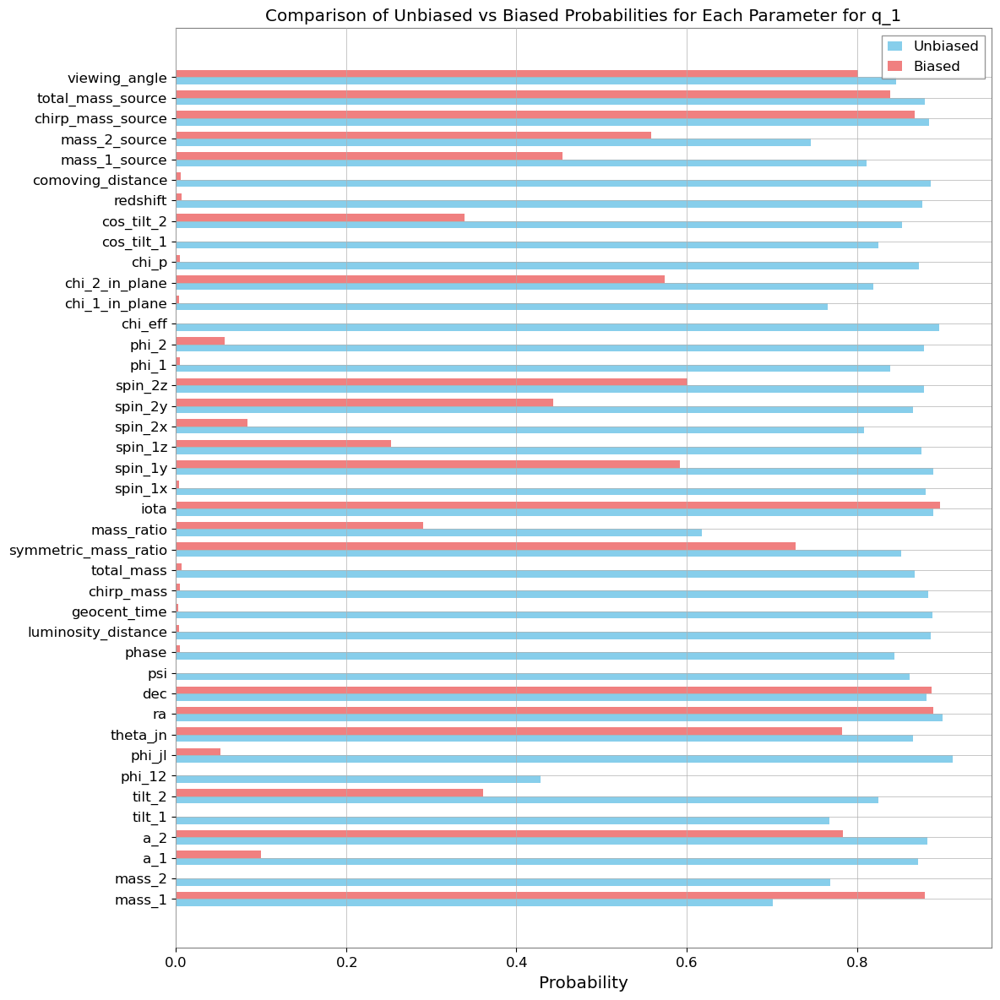

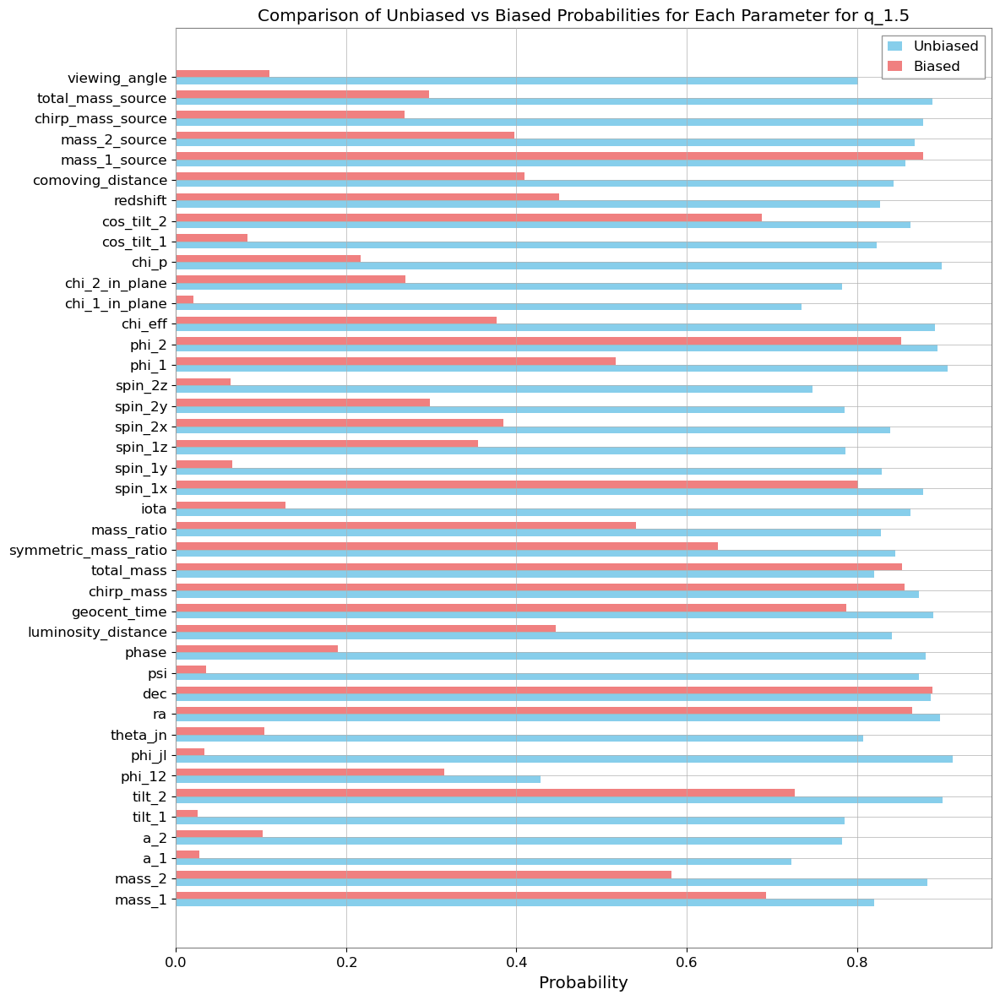

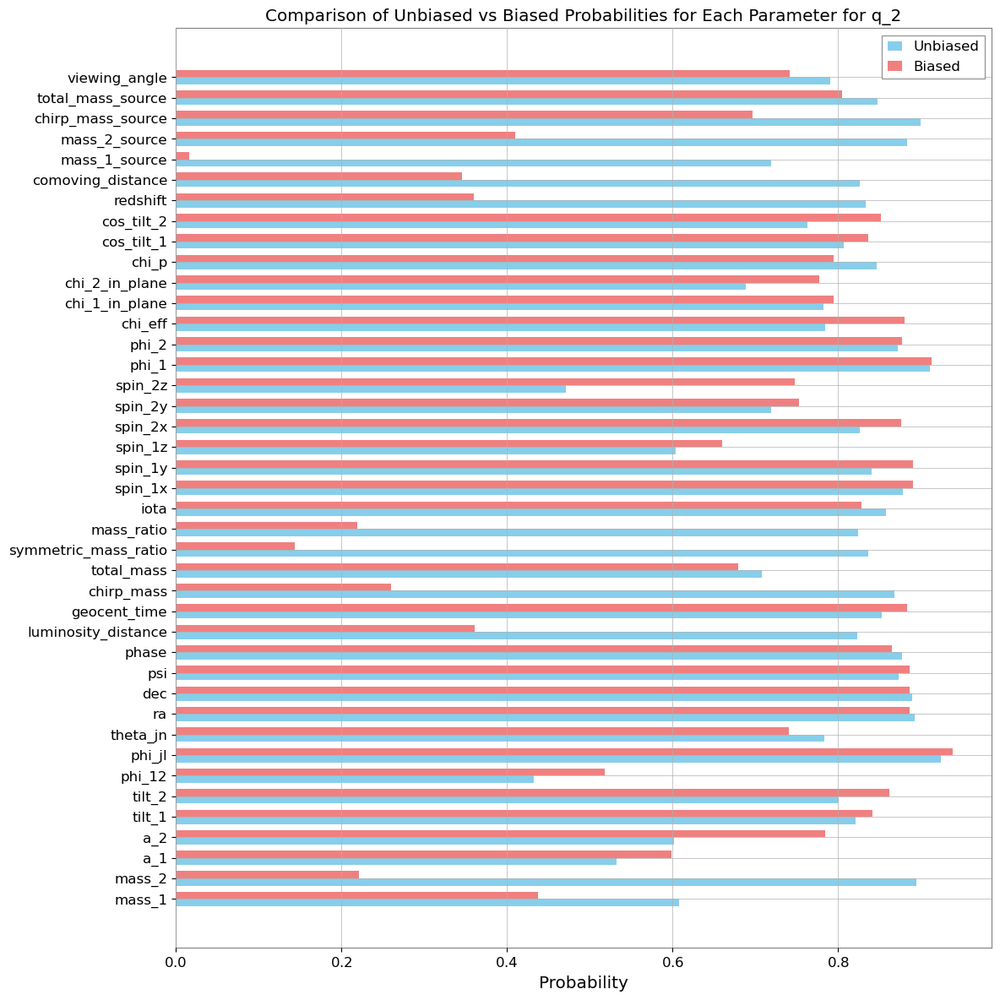

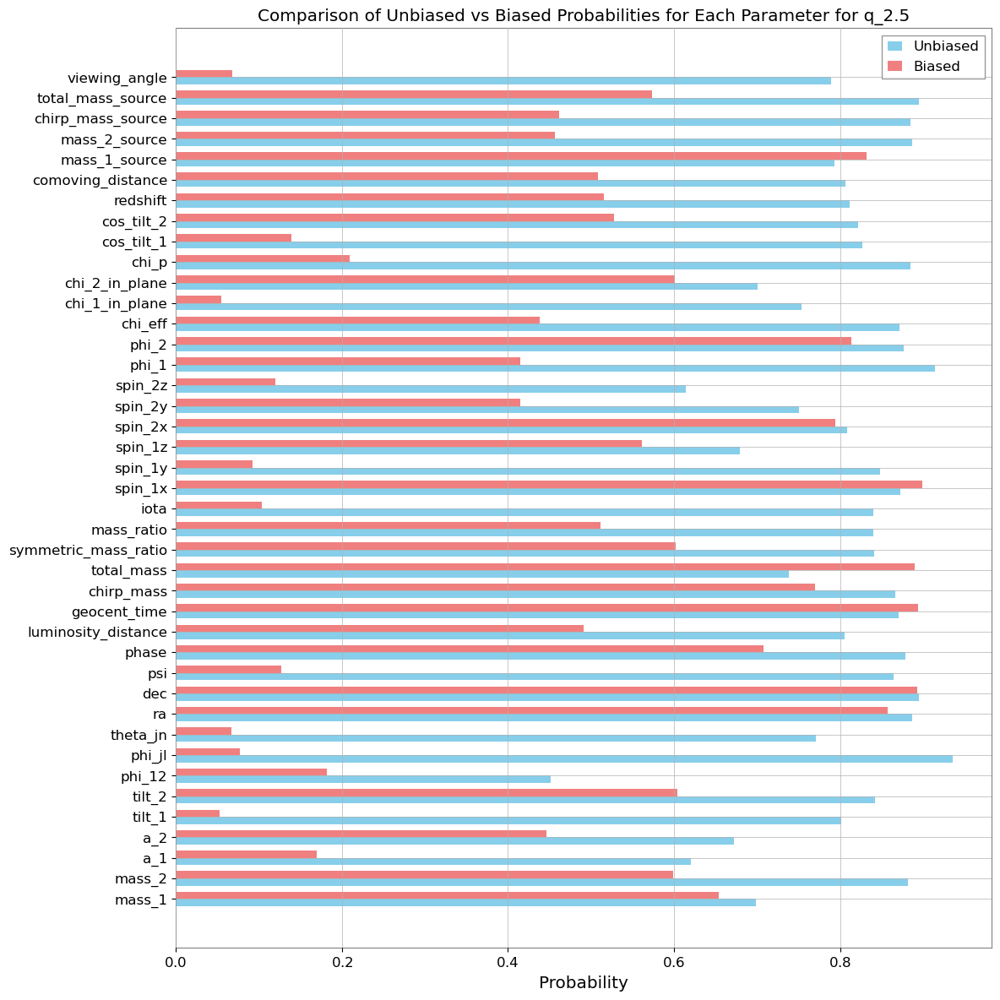

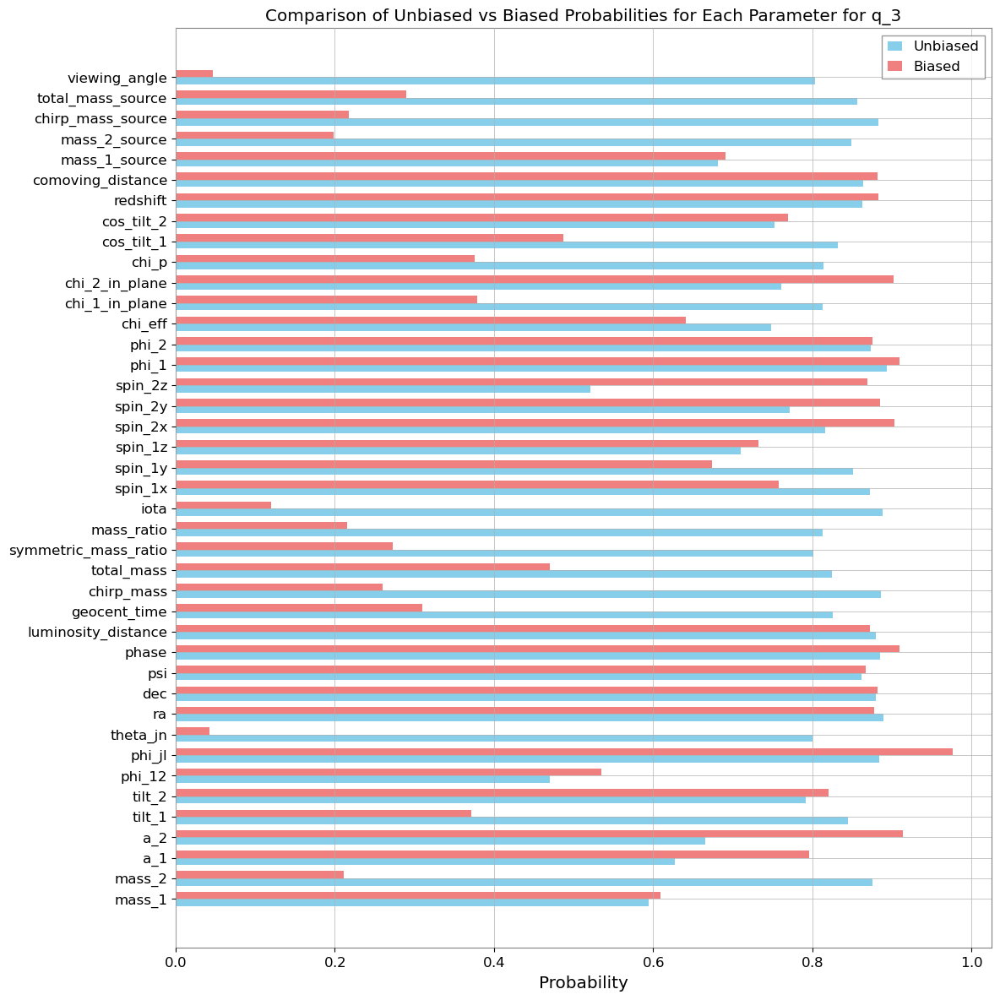

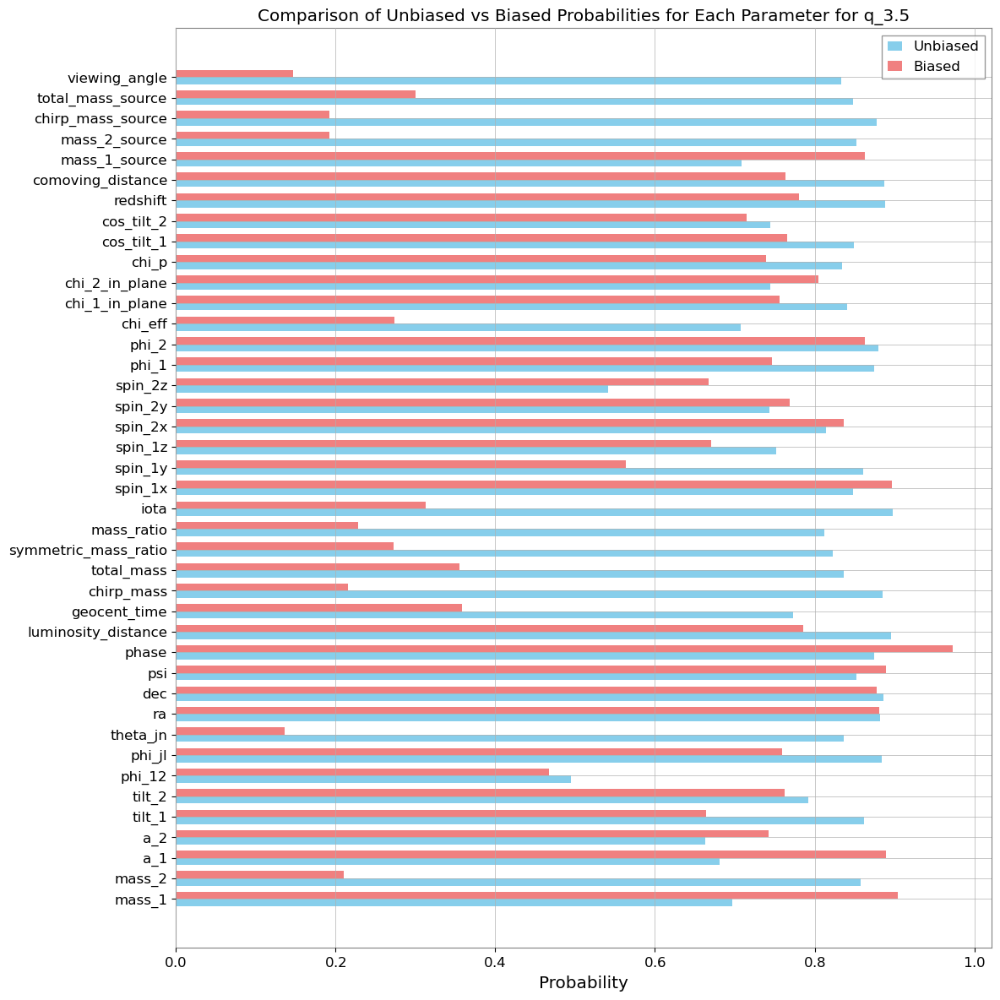

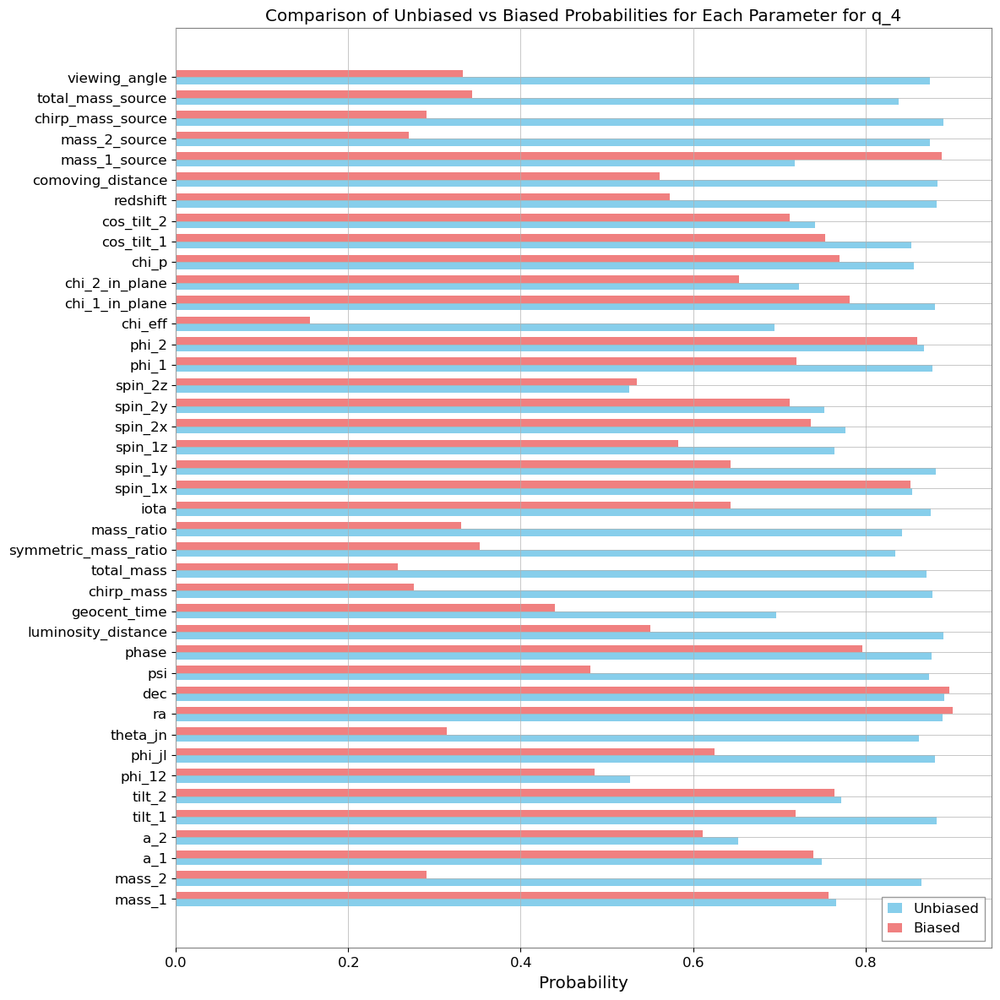

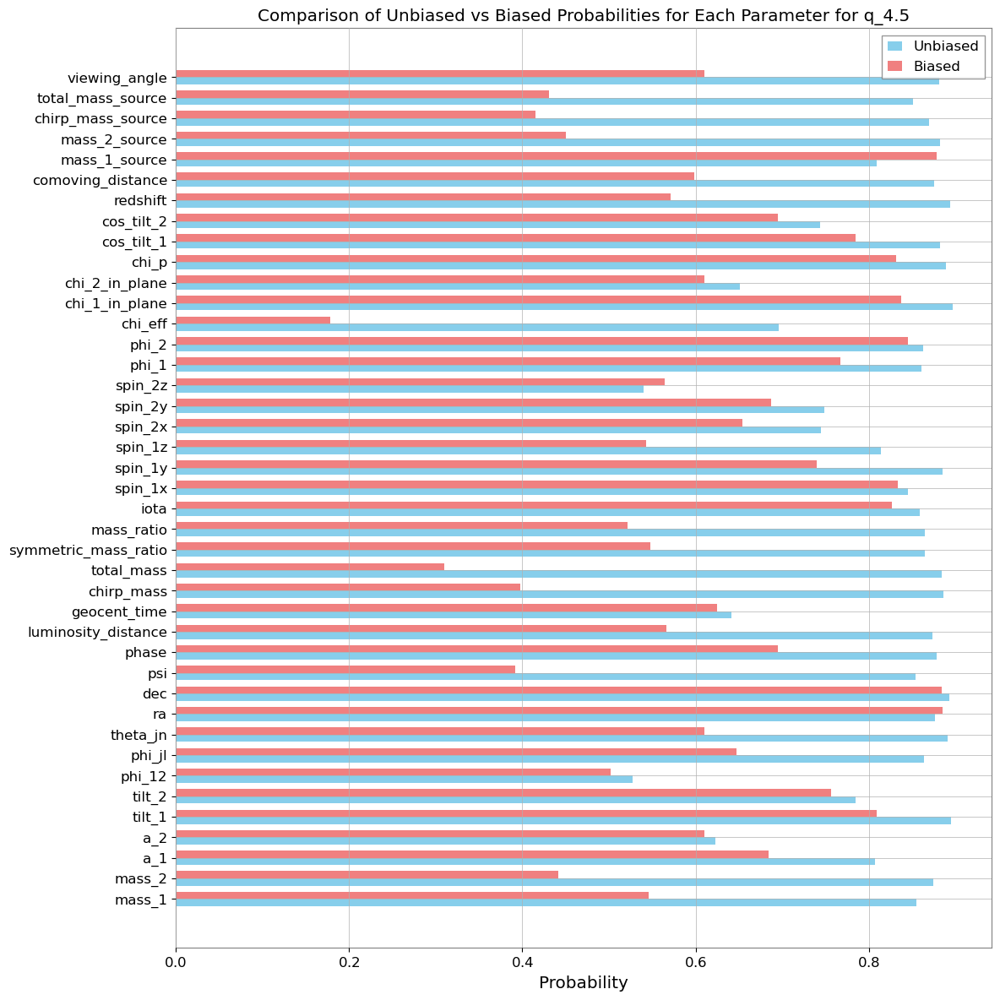

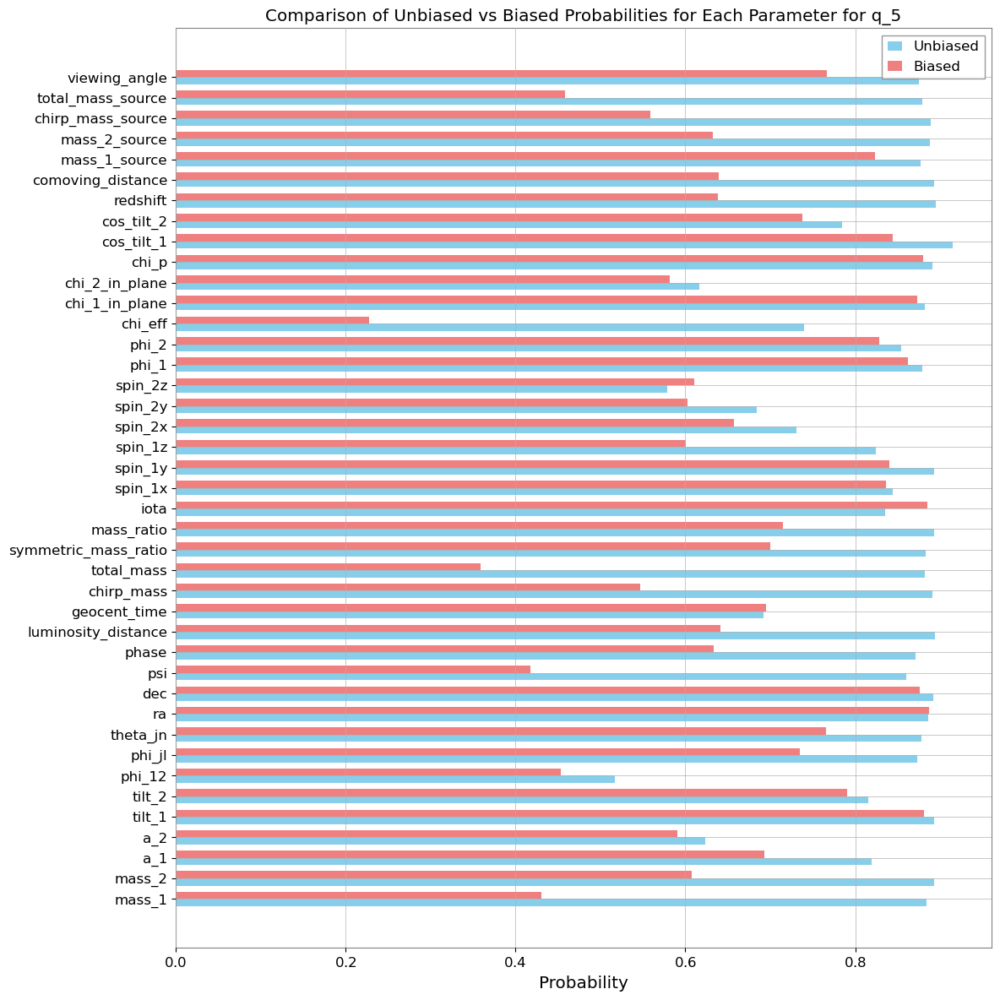

In [22]:
plot_comparison(results_q_1, 'q_1')
plot_comparison(results_q_15, 'q_1.5')
plot_comparison(results_q_2, 'q_2')
plot_comparison(results_q_25, 'q_2.5')
plot_comparison(results_q_3, 'q_3')
plot_comparison(results_q_35, 'q_3.5')
plot_comparison(results_q_4, 'q_4')
plot_comparison(results_q_45, 'q_4.5')
plot_comparison(results_q_5, 'q_5')

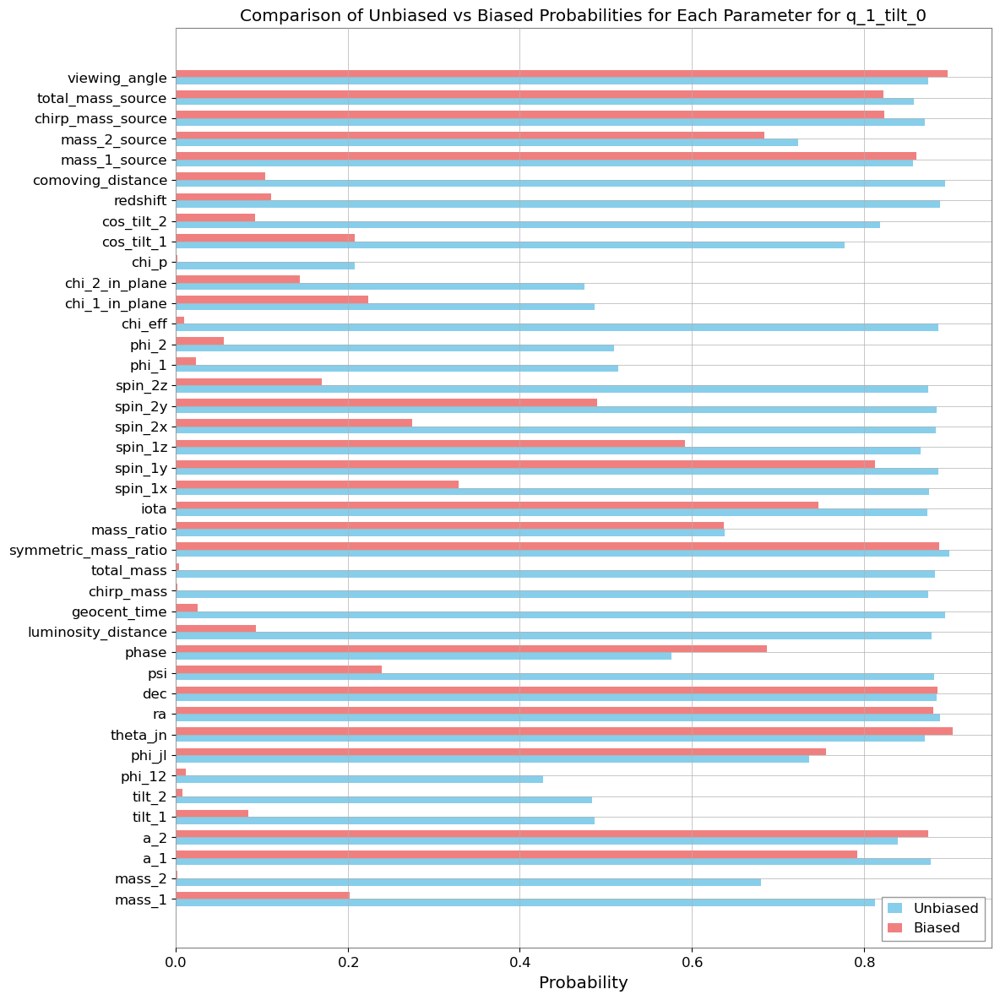

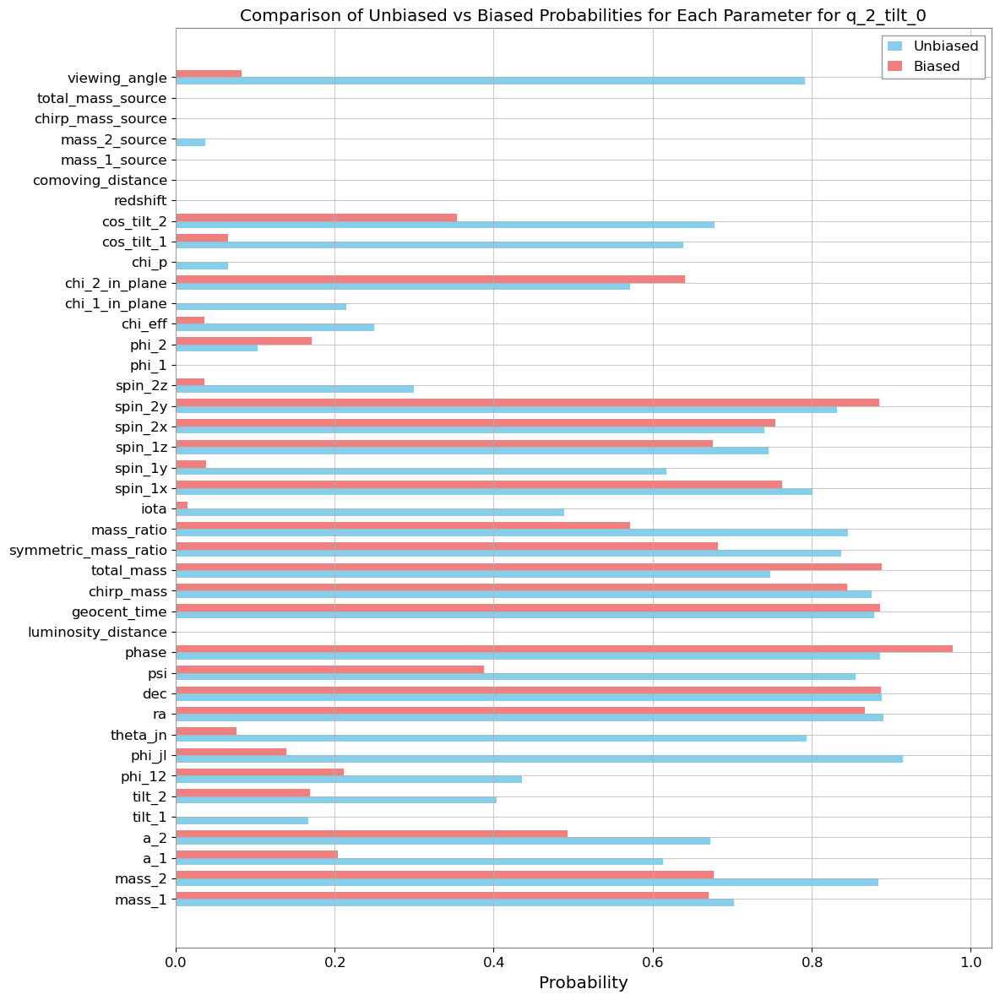

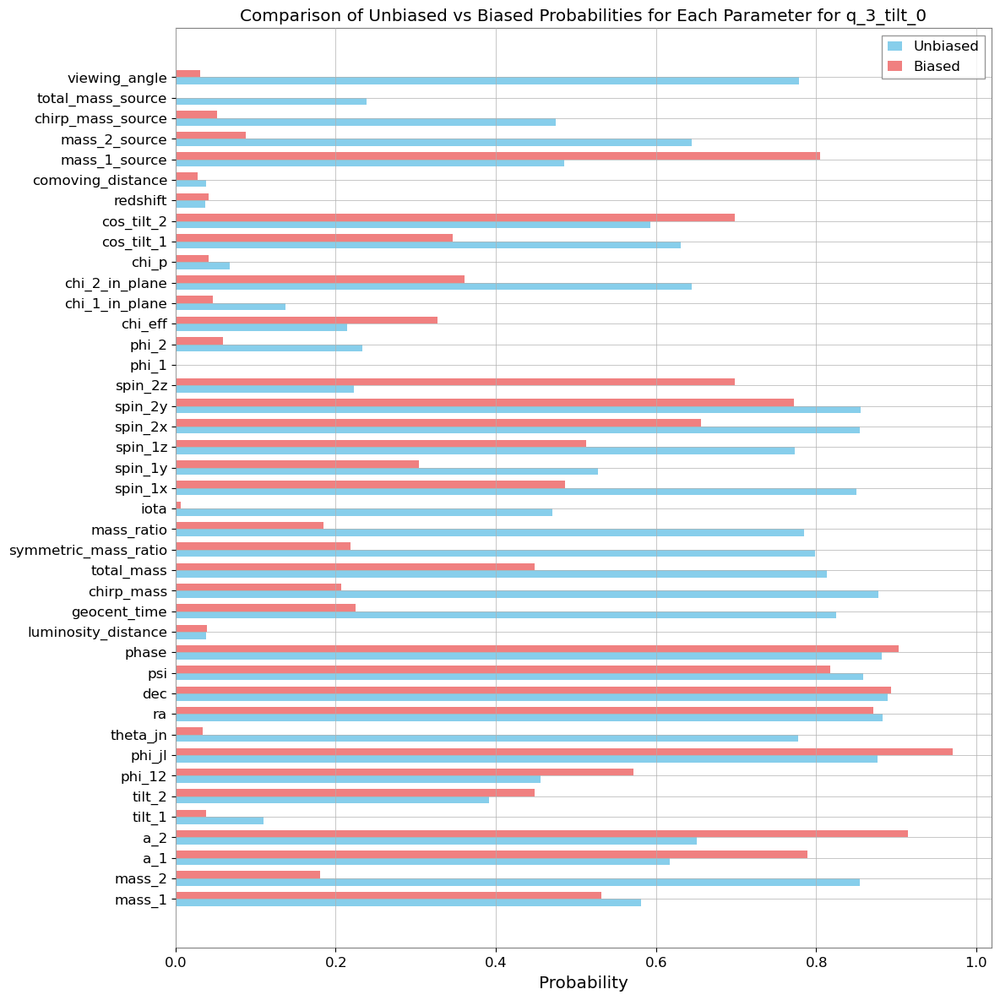

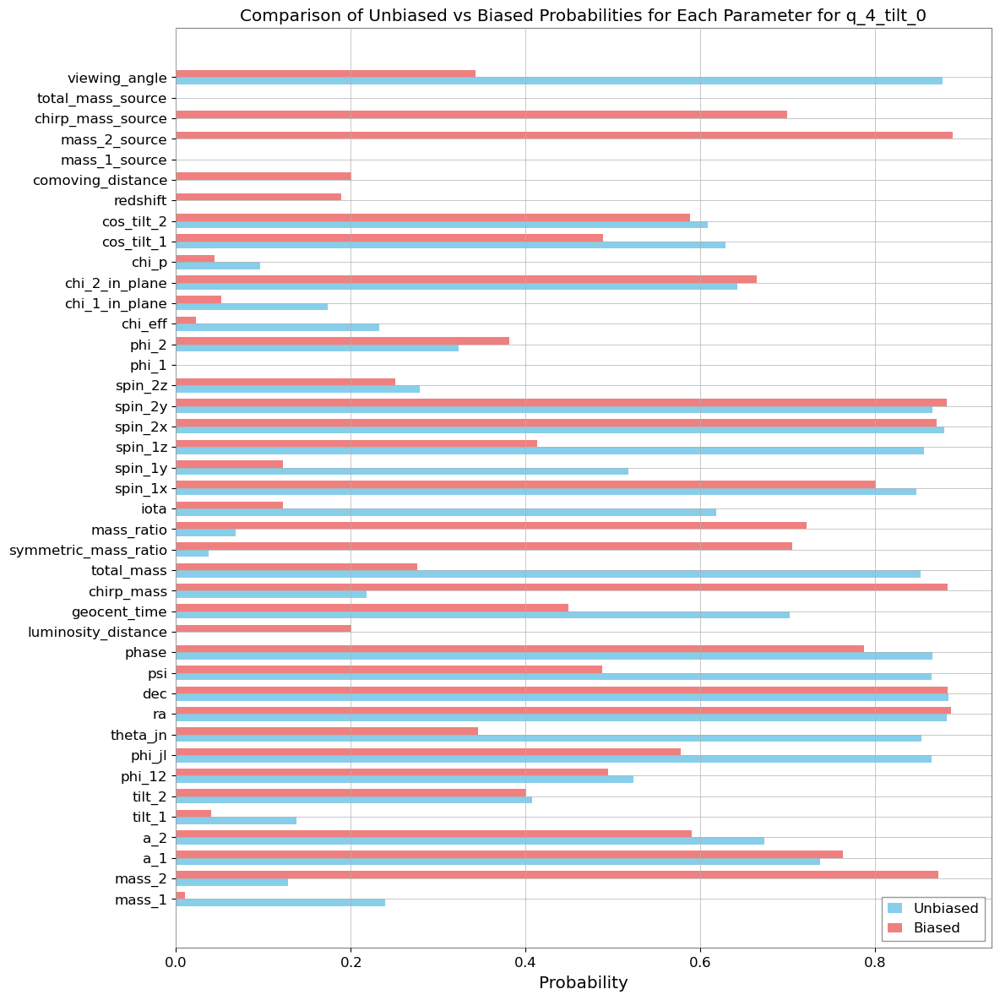

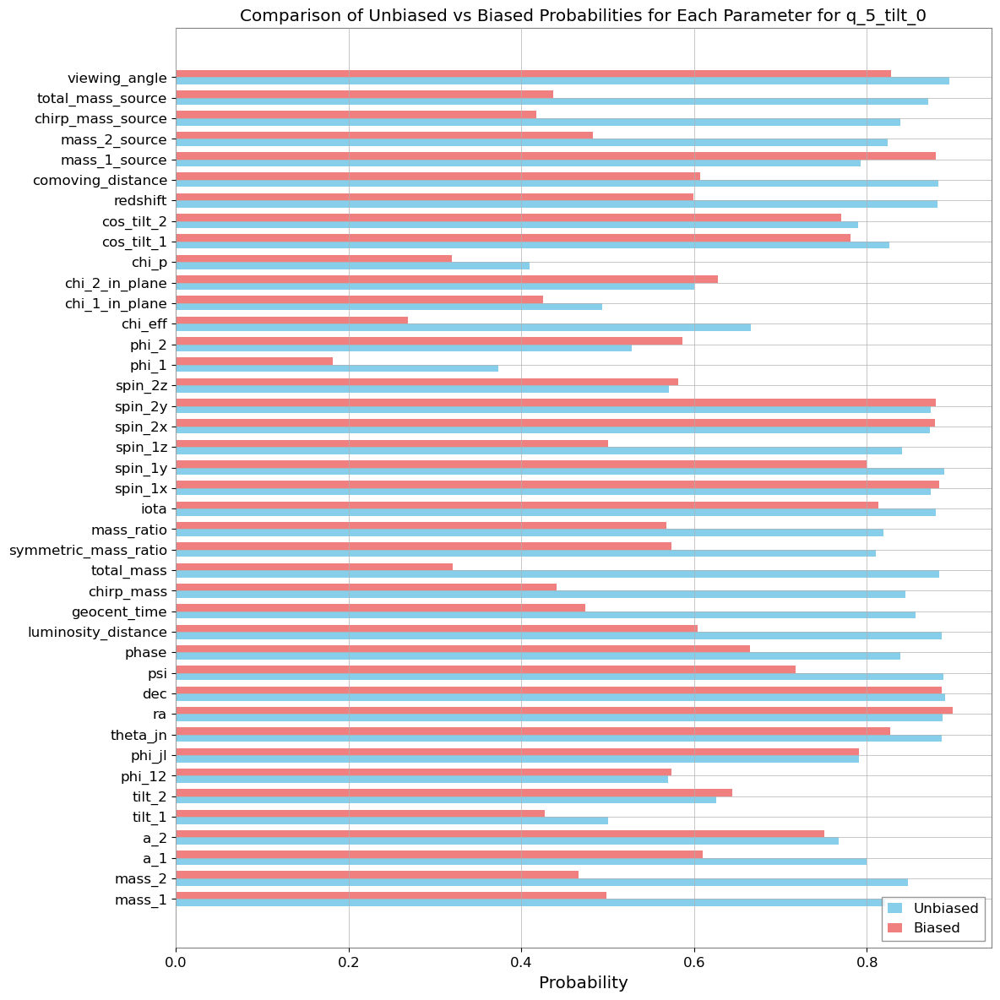

In [23]:
plot_comparison(results_q_1_tilt_0, 'q_1_tilt_0')
plot_comparison(results_q_2_tilt_0, 'q_2_tilt_0')
plot_comparison(results_q_3_tilt_0, 'q_3_tilt_0')
plot_comparison(results_q_4_tilt_0, 'q_4_tilt_0')
plot_comparison(results_q_5_tilt_0, 'q_5_tilt_0')

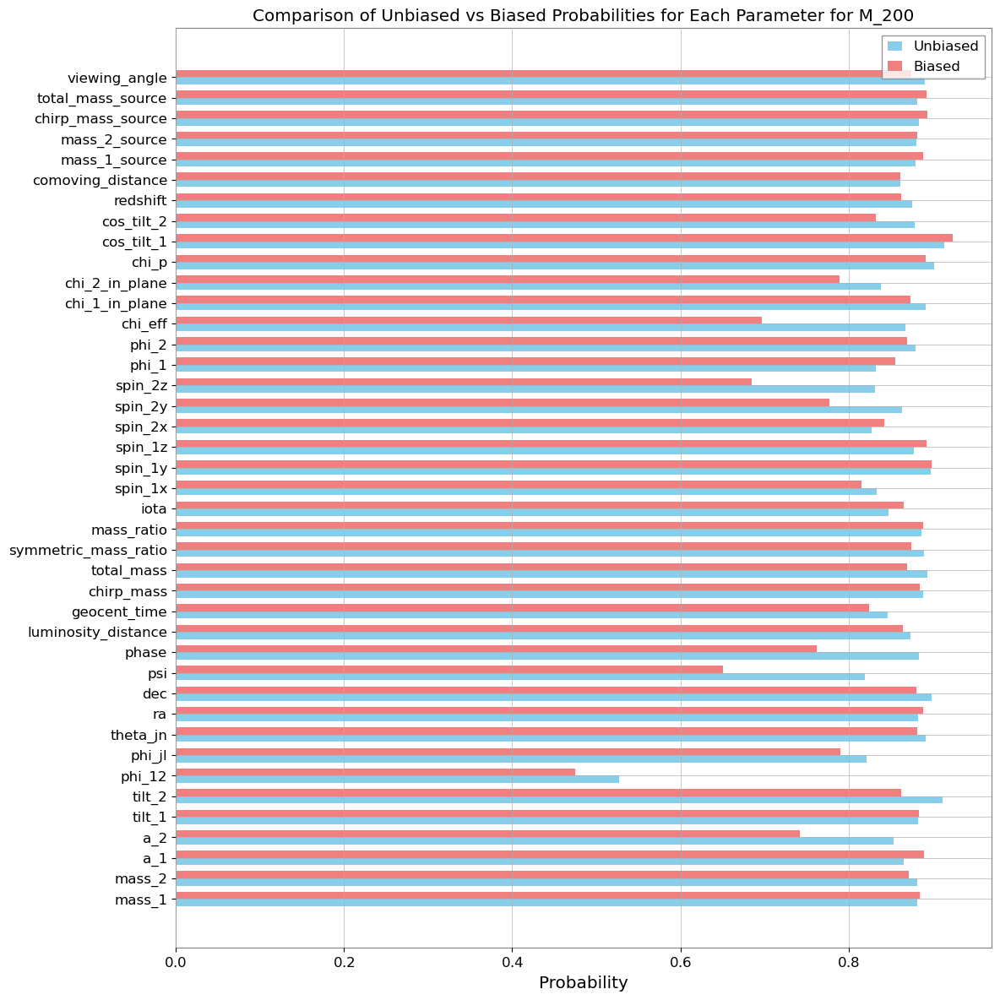

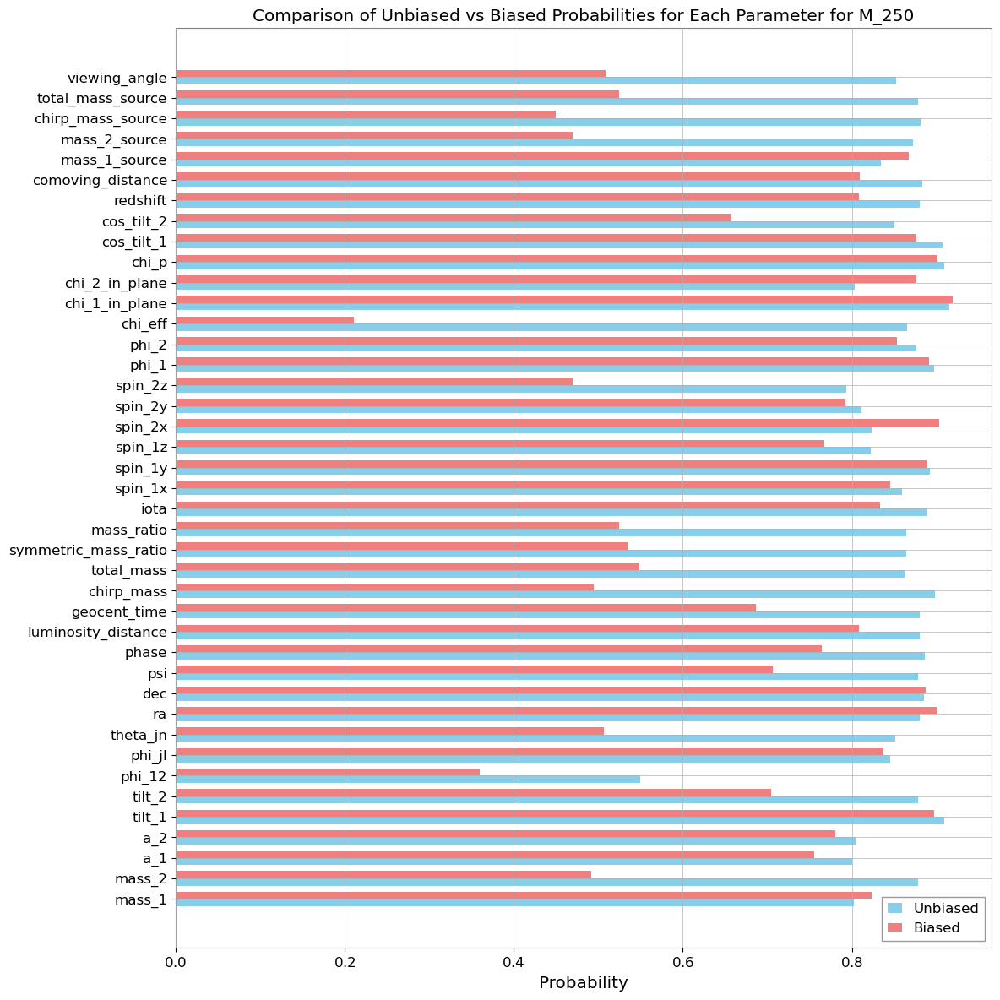

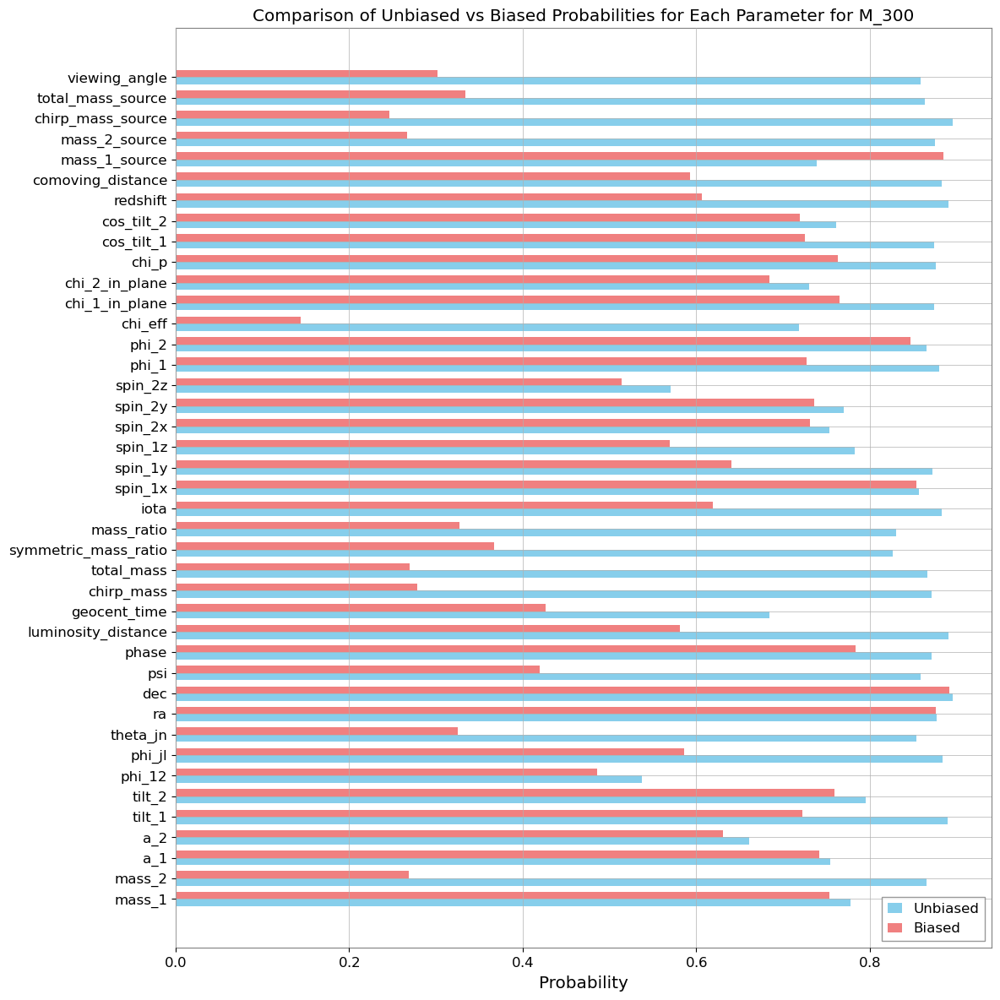

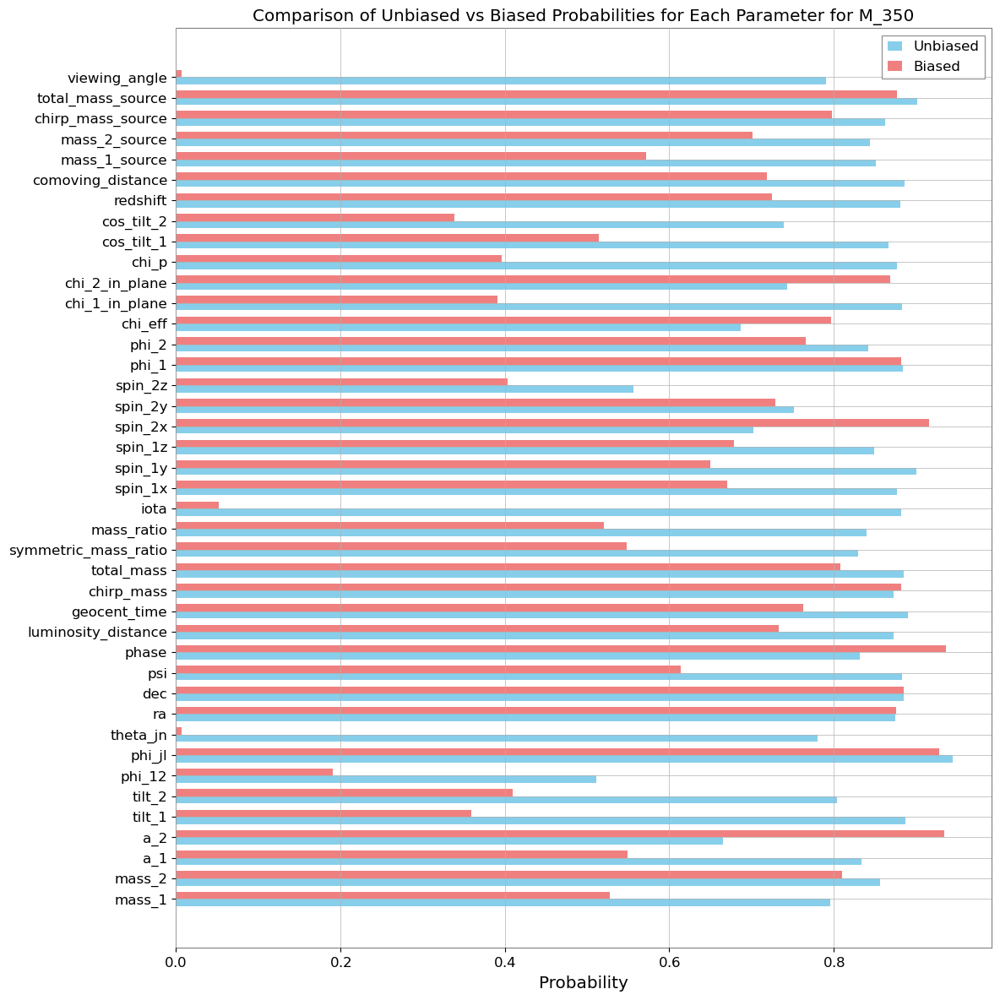

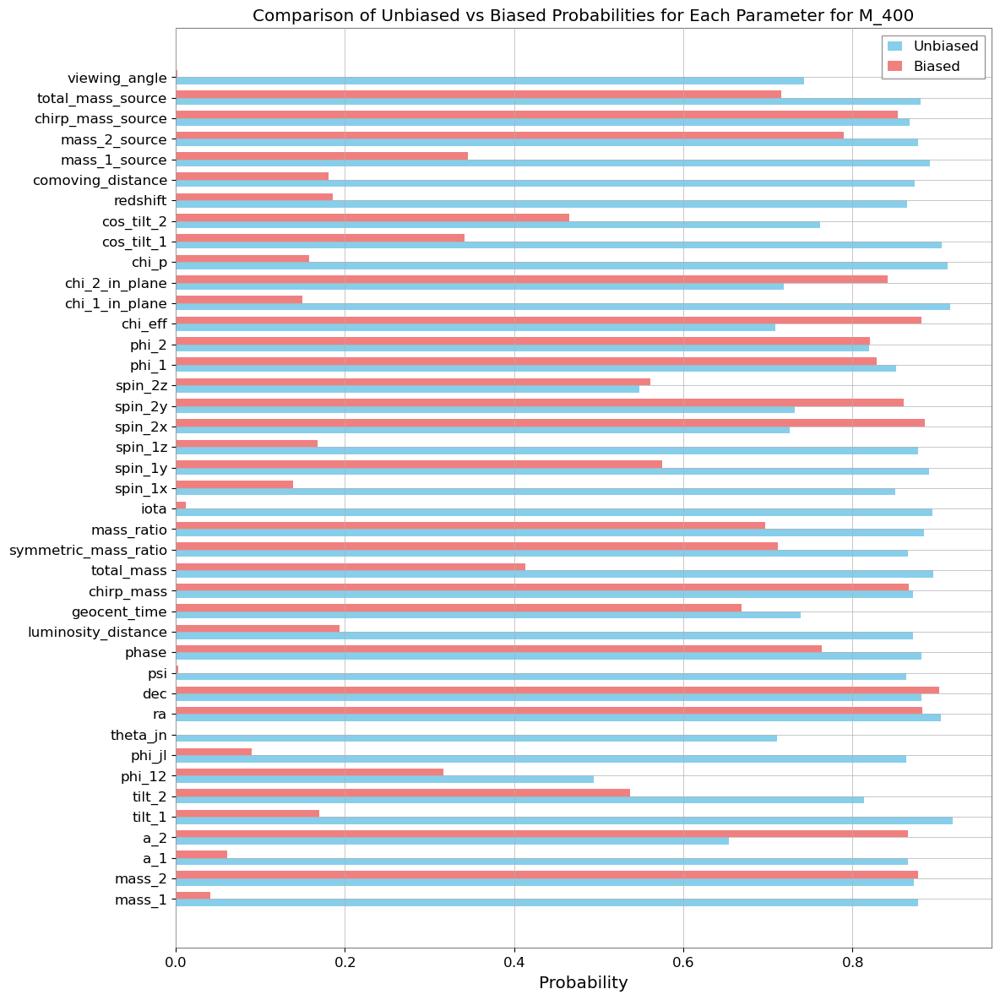

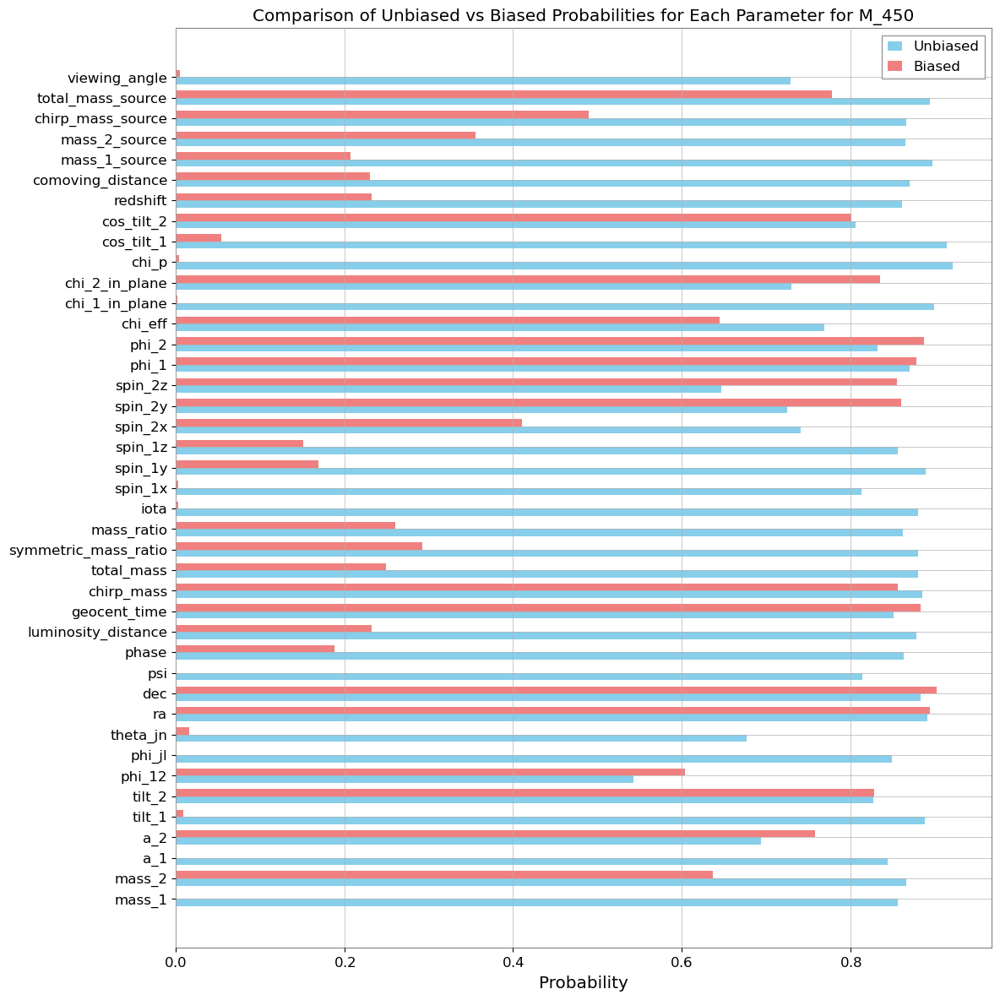

In [24]:
plot_comparison(results_M_200, 'M_200')
plot_comparison(results_M_250, 'M_250')
plot_comparison(results_M_300, 'M_300')
plot_comparison(results_M_350, 'M_350')
plot_comparison(results_M_400, 'M_400')
plot_comparison(results_M_450, 'M_450')

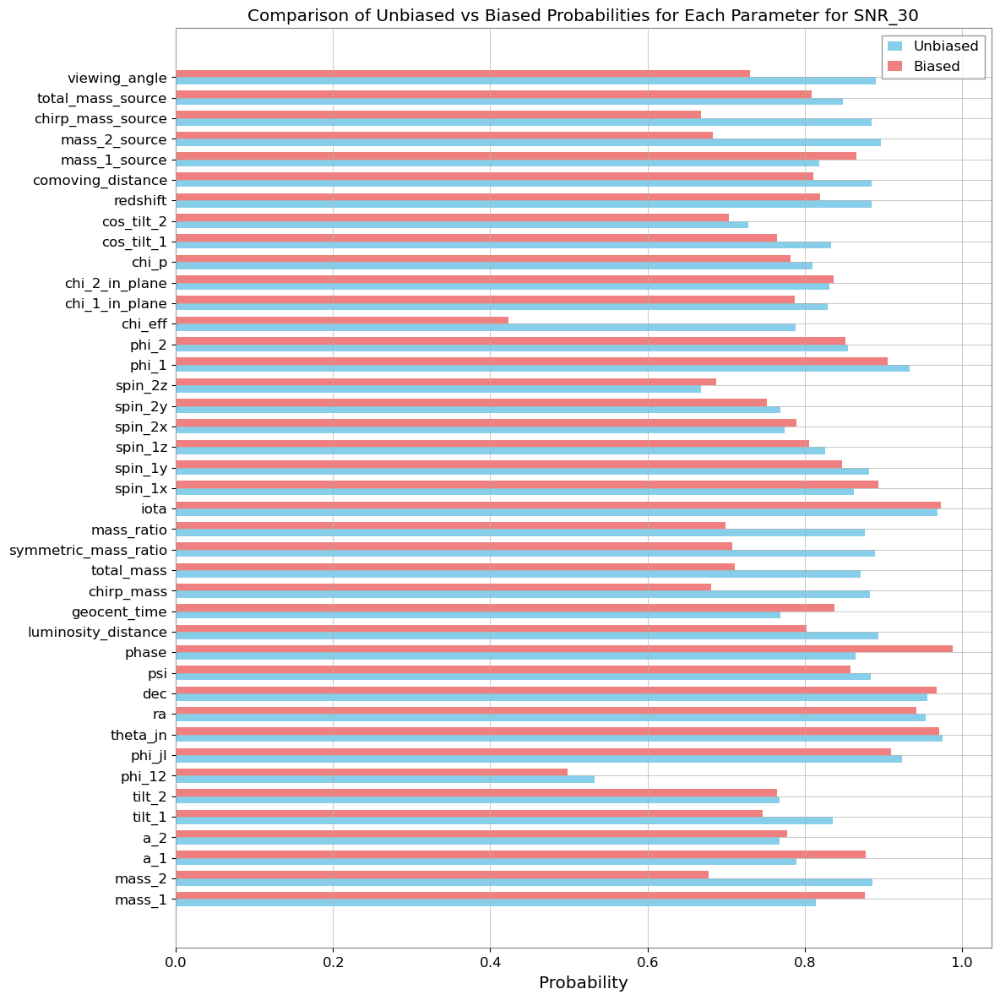

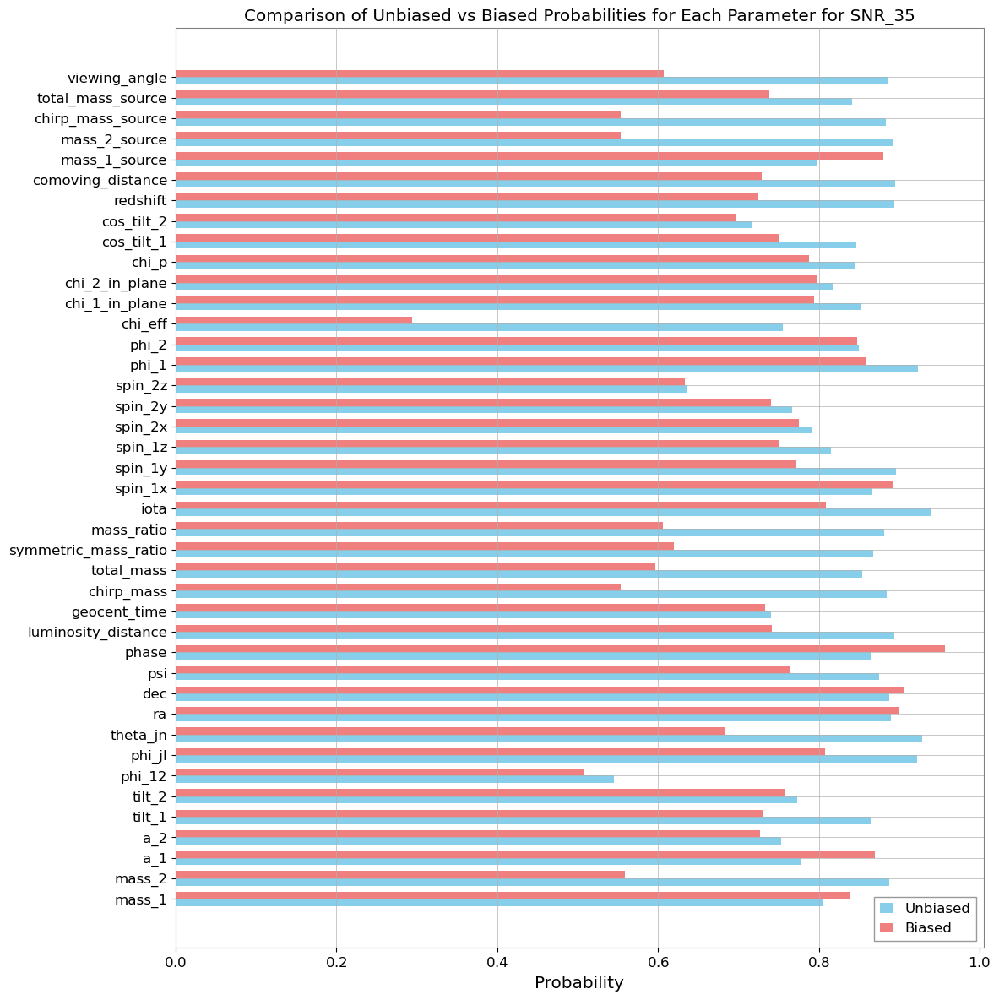

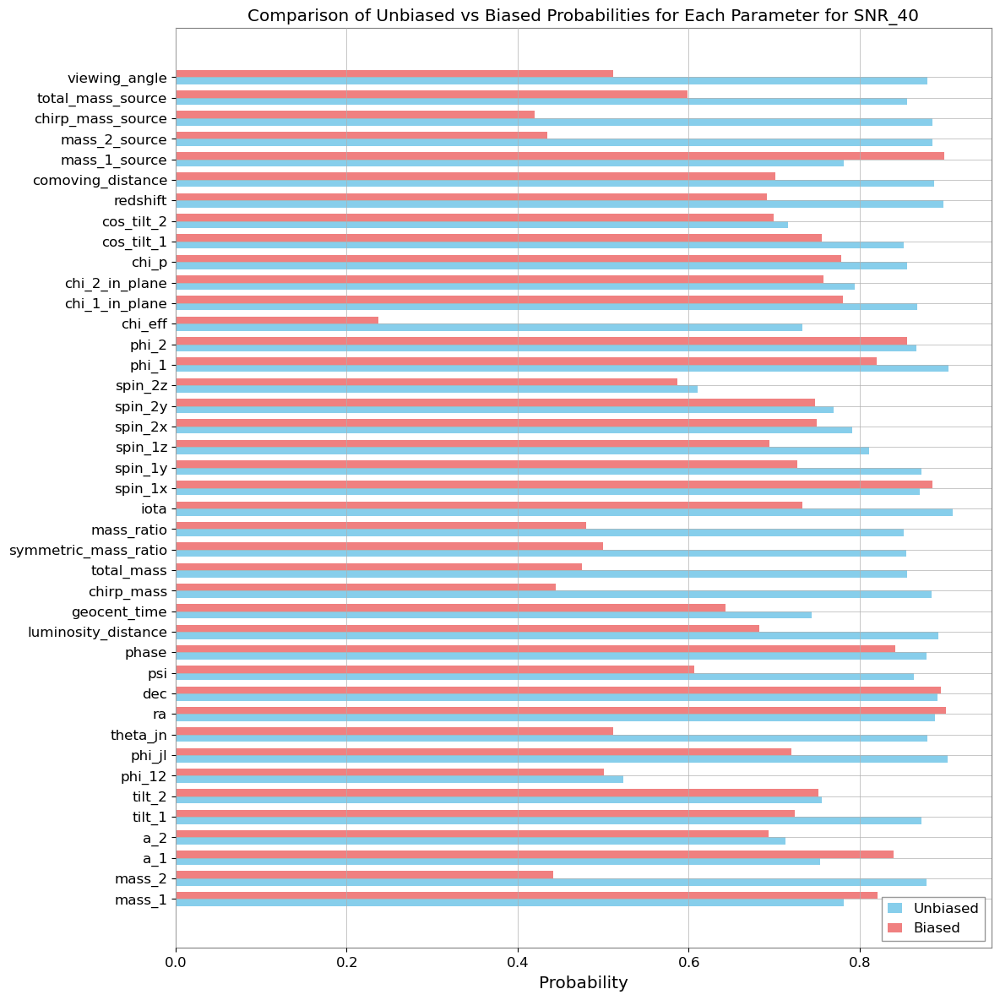

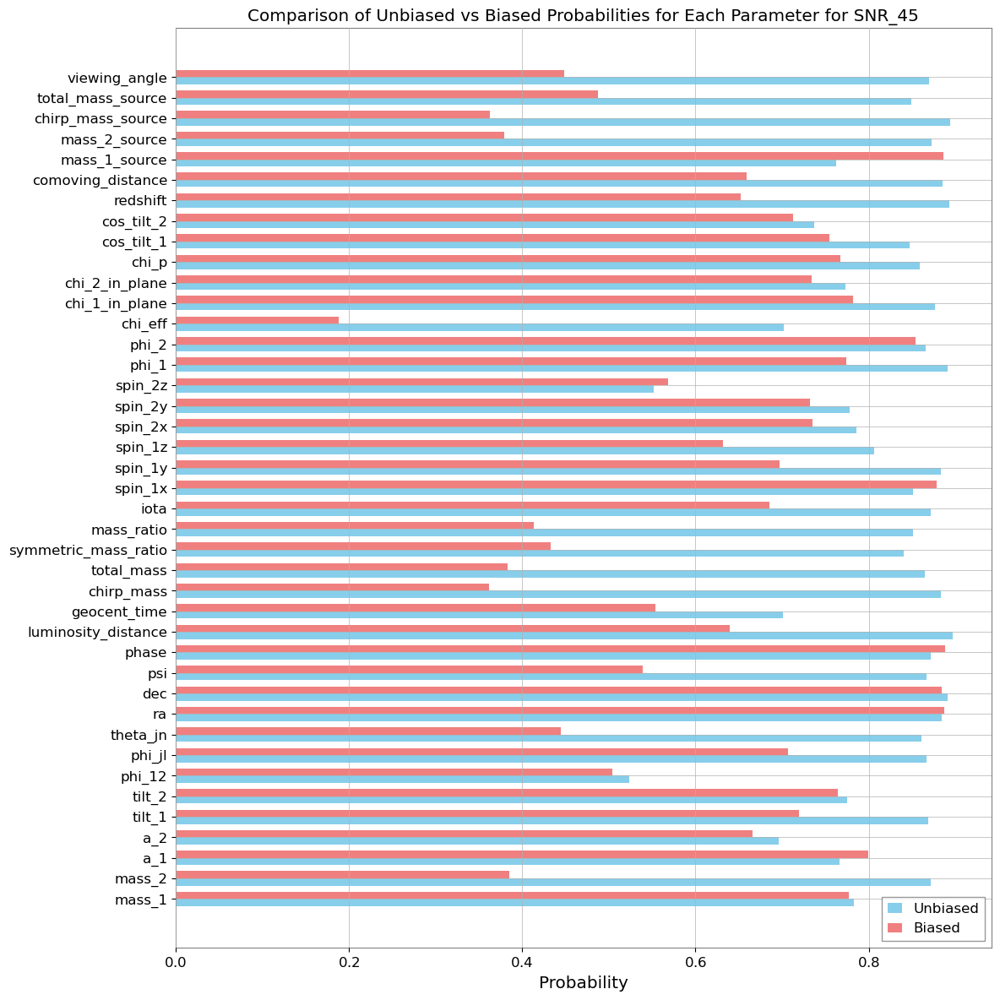

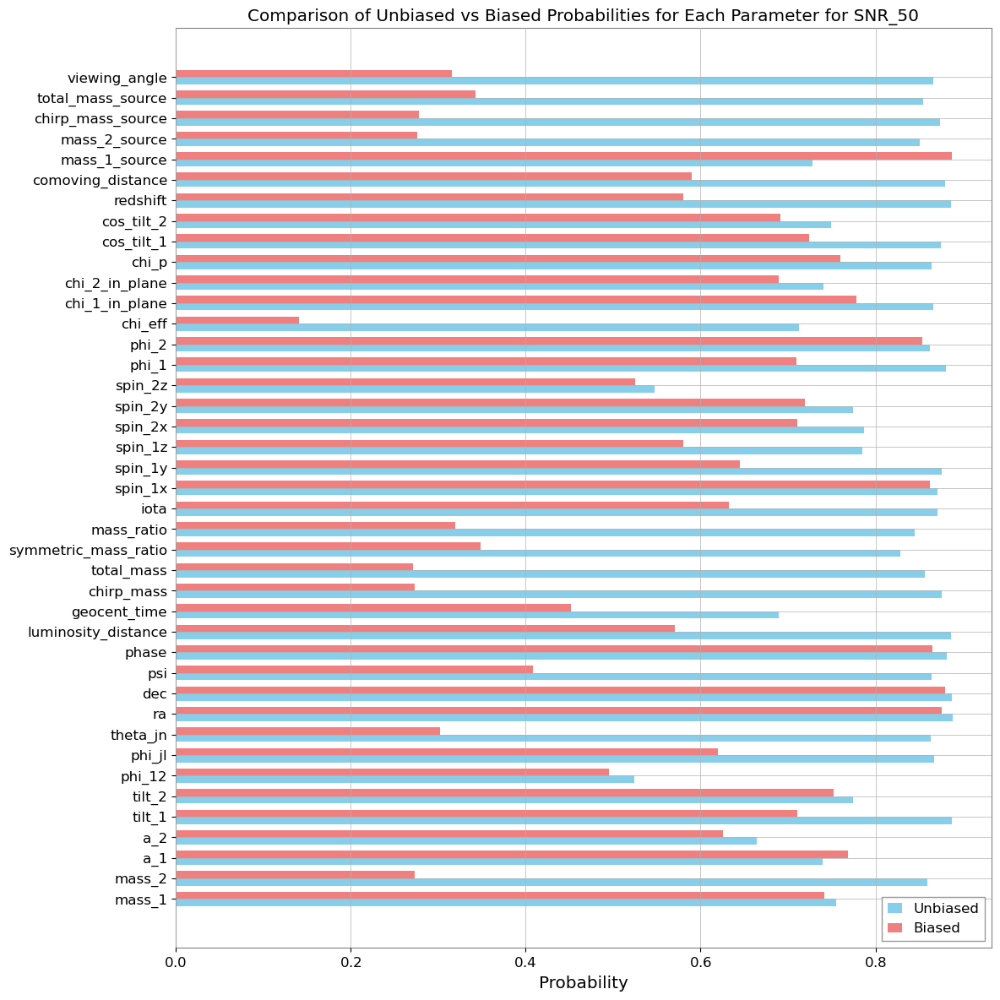

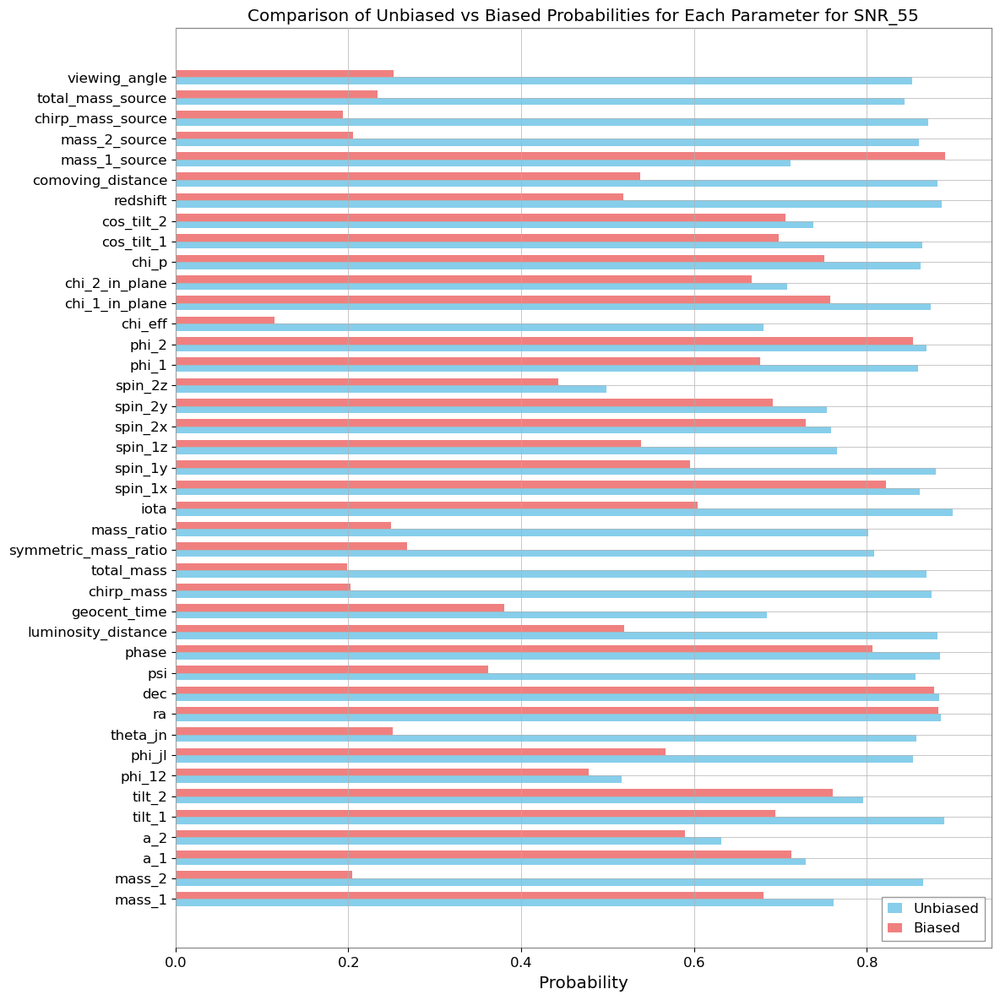

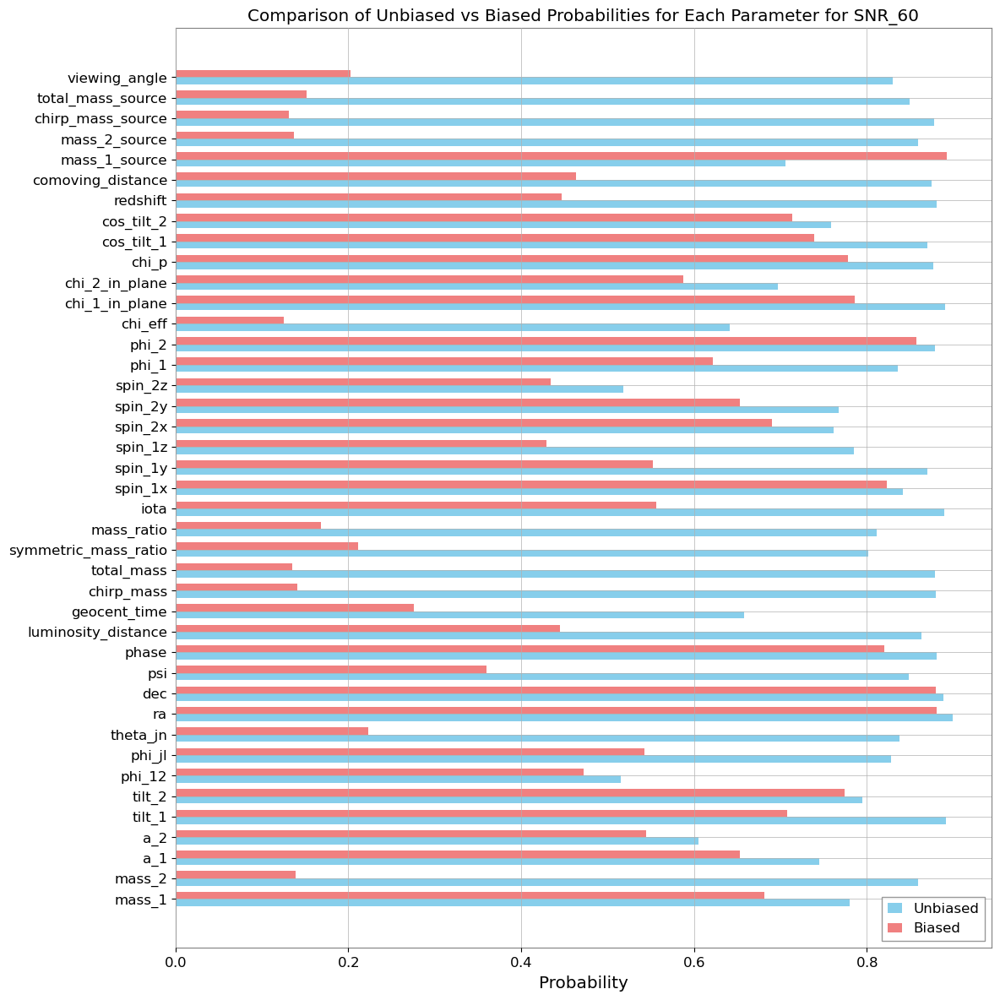

In [25]:
plot_comparison(results_SNR_30, 'SNR_30')
plot_comparison(results_SNR_35, 'SNR_35')
plot_comparison(results_SNR_40, 'SNR_40')
plot_comparison(results_SNR_45, 'SNR_45')
plot_comparison(results_SNR_50, 'SNR_50')
plot_comparison(results_SNR_55, 'SNR_55')
plot_comparison(results_SNR_60, 'SNR_60')

### Unbiased vs Biased Probability Comparison (1D)

#### Get Diffs

In [ ]:
all_q_runs = {
    "q_1": results_q_1,
    "q_15": results_q_15,
    "q_2": results_q_2,
    "q_25": results_q_25,
    "q_3": results_q_3,
    "q_35": results_q_35,
    "q_4": results_q_4,
    "q_45": results_q_45,
    "q_5": results_q_5
}

all_q_tilt_0_runs = {
    "q_1_tilt_0": results_q_1_tilt_0,
    "q_2_tilt_0": results_q_2_tilt_0,
    "q_3_tilt_0": results_q_3_tilt_0,
    "q_4_tilt_0": results_q_4_tilt_0,
    "q_5_tilt_0": results_q_5_tilt_0
}

all_M_runs = {
    "M_200": results_M_200,
    "M_250": results_M_250,
    "M_300": results_M_300,
    "M_350": results_M_350,
    "M_400": results_M_400,
    "M_450": results_M_450
}

all_SNR_runs = {
    "SNR_30": results_SNR_30,
    "SNR_35": results_SNR_35,
    "SNR_40": results_SNR_40,
    "SNR_45": results_SNR_45,
    "SNR_50": results_SNR_50,
    "SNR_55": results_SNR_55,
    "SNR_60": results_SNR_60
}

In [ ]:
q_diffs = compare_multiple_runs(all_q_runs)
q_tilt_diffs = compare_multiple_runs(all_q_tilt_0_runs)
M_diffs = compare_multiple_runs(all_M_runs)
SNR_diffs = compare_multiple_runs(all_SNR_runs)

#### Bar Graphs

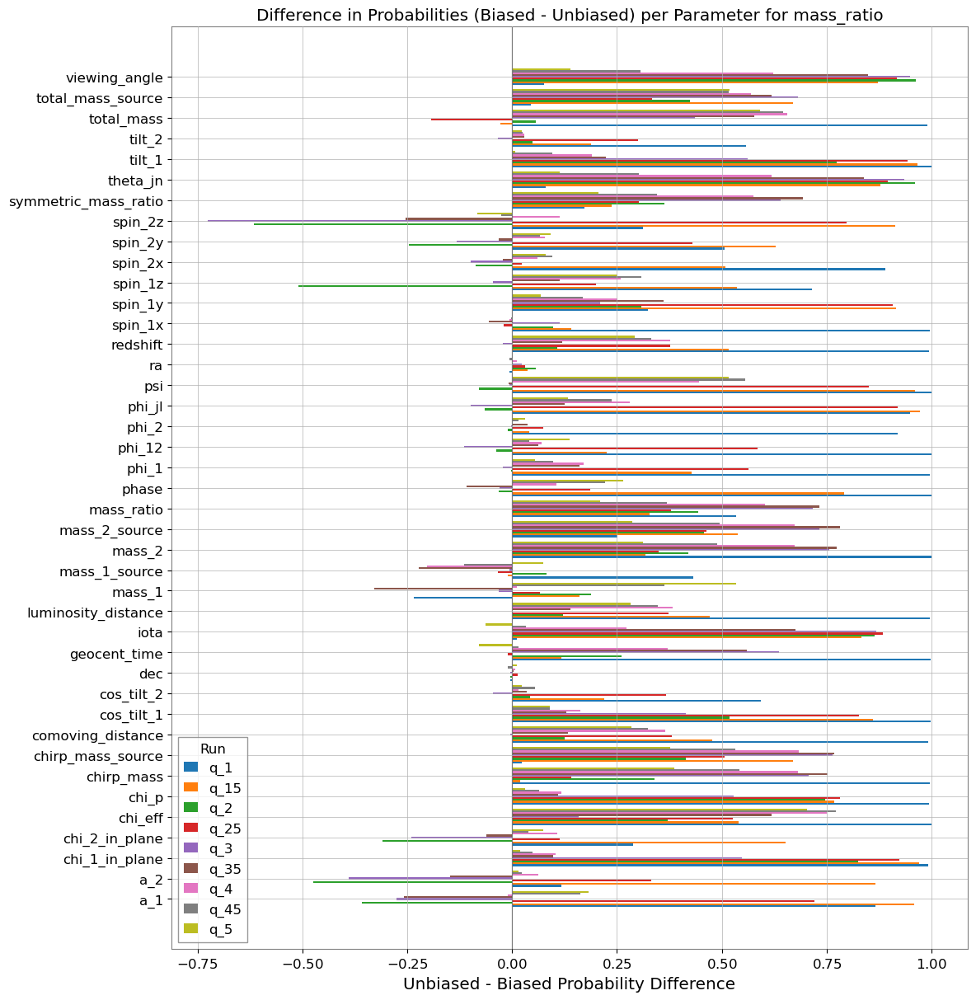

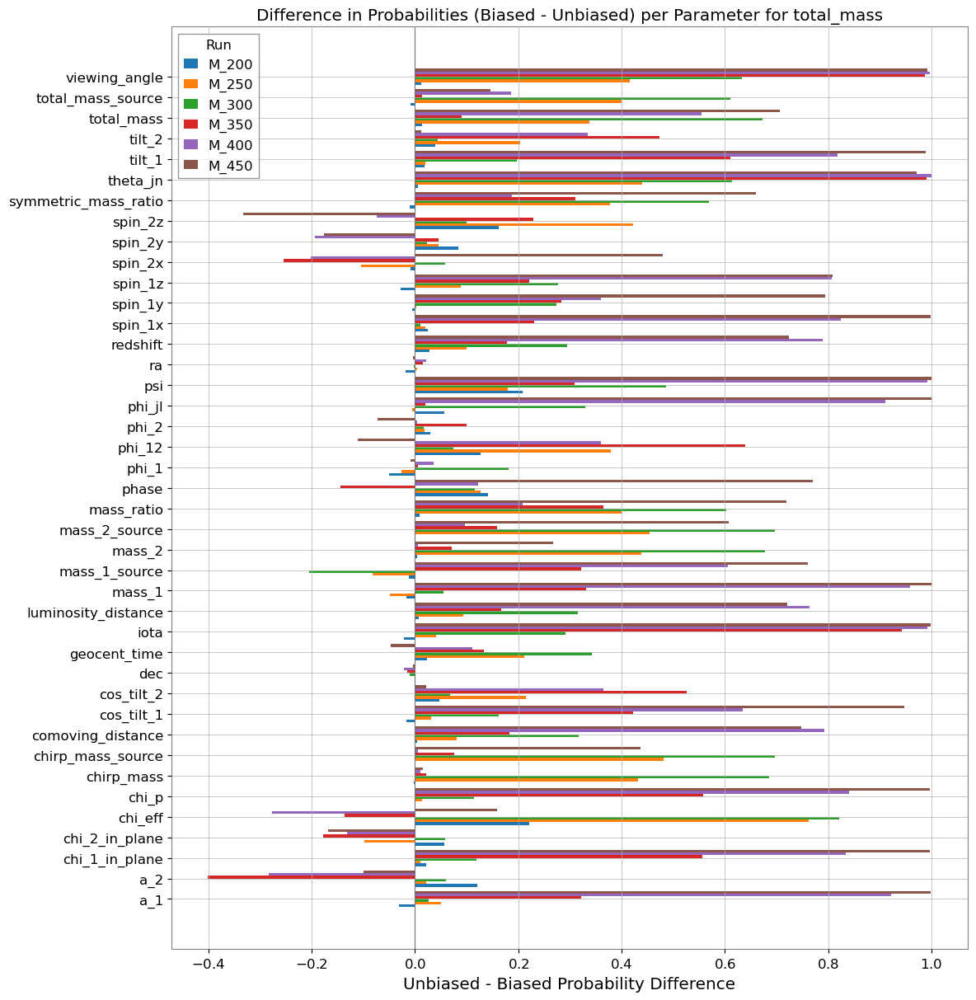

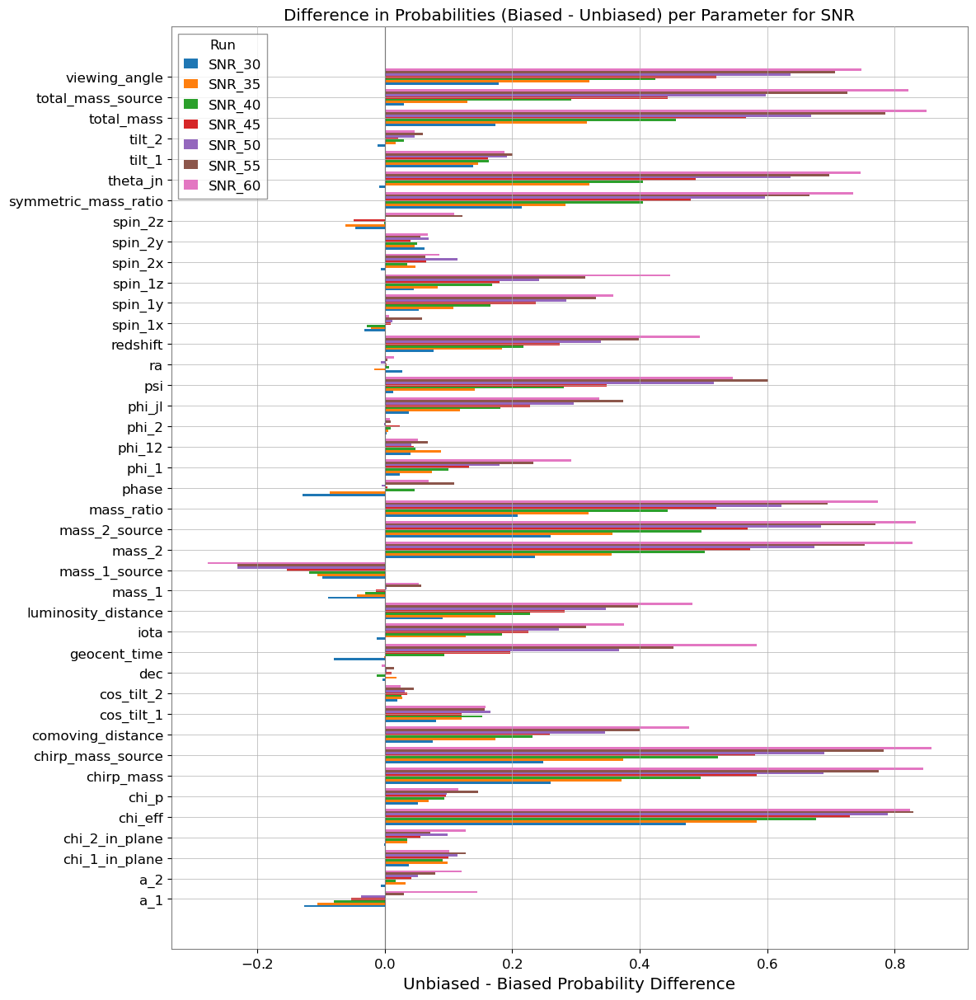

In [ ]:
plot_bias_differences_by_parameter(q_diffs, 'mass_ratio')
plot_bias_differences_by_parameter(q_tilt_diffs, 'tilt_0_mass_ratio')
plot_bias_differences_by_parameter(M_diffs, 'total_mass')
plot_bias_differences_by_parameter(SNR_diffs, 'SNR')

#### Heat Maps

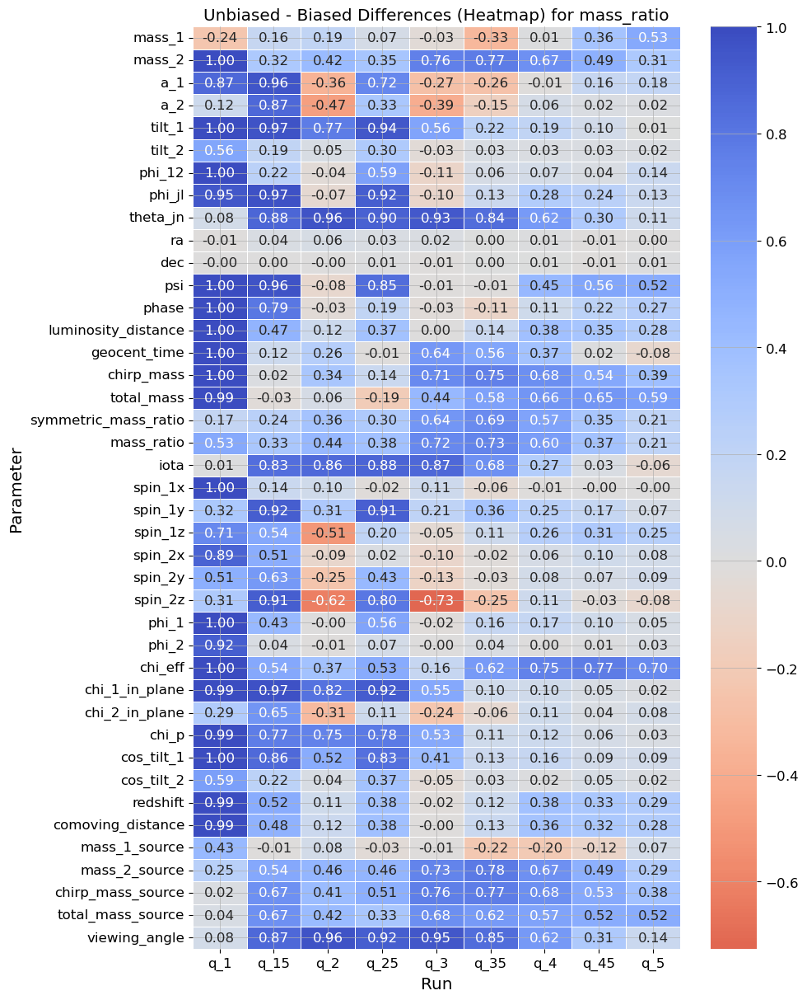

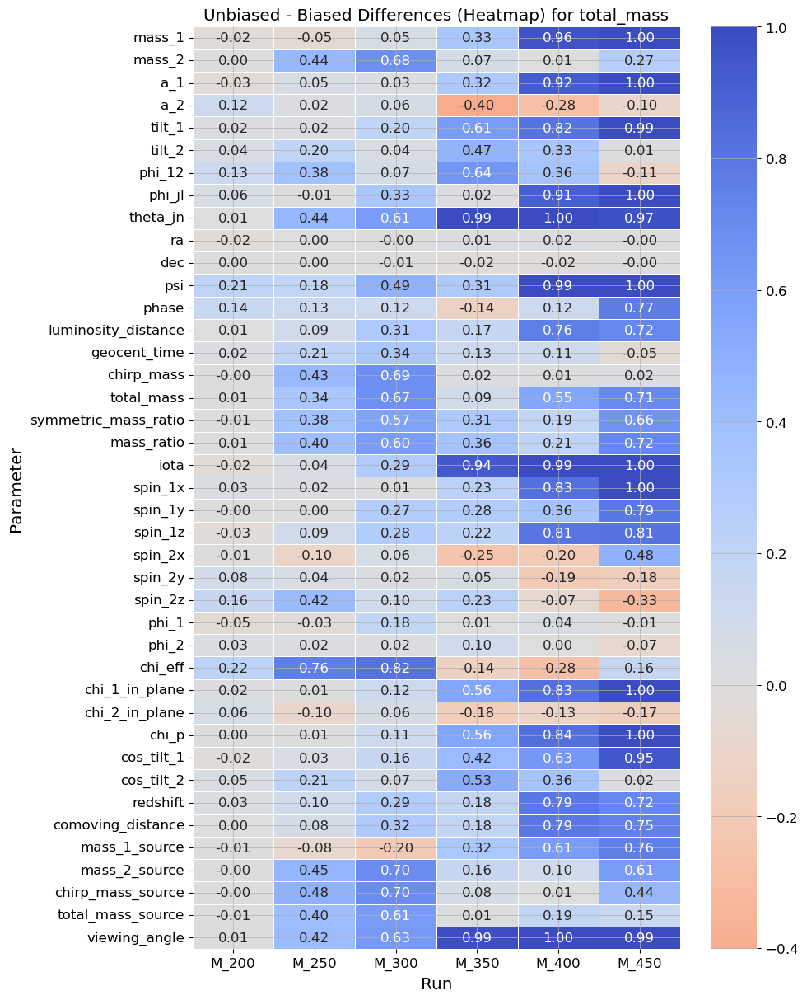

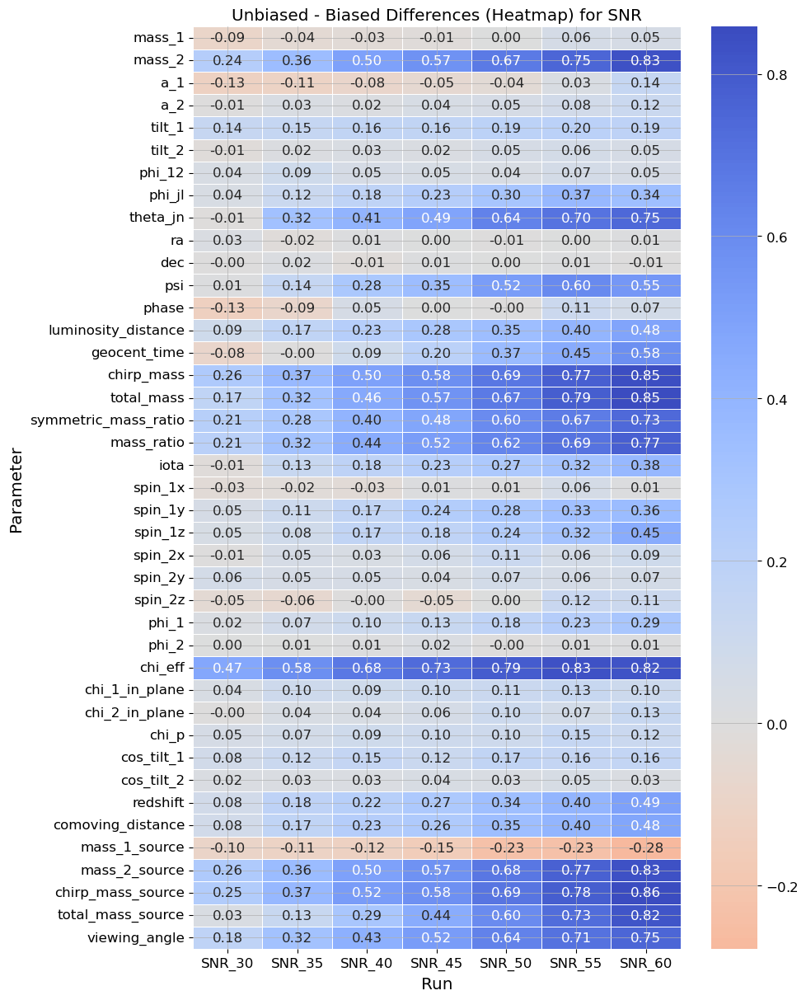

In [ ]:
plot_heatmap(q_diffs, 'mass_ratio')
plot_heatmap(q_tilt_diffs, 'tilt_0_mass_ratio')
plot_heatmap(M_diffs, 'total_mass')
plot_heatmap(SNR_diffs, 'SNR')

## Probability of being n Standard Deviation from the Injected Value (N-Dimensional Case)

### Computation of Probabilities

In [47]:
param_pairs = [('a_1', 'a_2'), ('total_mass', 'mass_ratio'), ('chi_eff', 'mass_ratio'), ('luminosity_distance', 'theta_jn'), ('luminosity_distance', 'viewing_angle')]
# 
#('mass_1', 'mass_2'), ('total_mass', 'mass_ratio'), , ('tilt_1', 'tilt_2'), ('a_1', 'tilt_1'), ('a_2', 'tilt_2'), ('mass_ratio', 'chi_p'), ('theta_jn', 'chi_p'), ('viewing_angle', 'chi_p')
num = 10000

In [48]:
results_nd_q_1 = compute_nd_probabilities(q_1, q_1_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
# results_nd_q_1_n1000 = compute_nd_probabilities(q_1_n1000, q_1_n1000_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_q_15 = compute_nd_probabilities(q_15, q_15_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_q_2 = compute_nd_probabilities(q_2, q_2_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_q_25 = compute_nd_probabilities(q_25, q_25_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_q_3 = compute_nd_probabilities(q_3, q_3_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_q_35 = compute_nd_probabilities(q_35, q_35_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_q_4 = compute_nd_probabilities(q_4, q_4_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_q_45 = compute_nd_probabilities(q_45, q_45_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_q_5 = compute_nd_probabilities(q_5, q_5_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)

In [49]:
results_nd_q_1_tilt_0 = compute_nd_probabilities(q_1_tilt_0, q_1_tilt_0_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_q_2_tilt_0 = compute_nd_probabilities(q_2_tilt_0, q_2_tilt_0_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_q_3_tilt_0 = compute_nd_probabilities(q_3_tilt_0, q_3_tilt_0_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_q_4_tilt_0 = compute_nd_probabilities(q_4_tilt_0, q_4_tilt_0_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_q_5_tilt_0 = compute_nd_probabilities(q_5_tilt_0, q_5_tilt_0_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)

In [50]:
results_nd_M_200 = compute_nd_probabilities(M_200, M_200_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_M_250 = compute_nd_probabilities(M_250, M_250_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_M_300 = compute_nd_probabilities(M_300, M_300_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_M_350 = compute_nd_probabilities(M_350, M_350_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_M_400 = compute_nd_probabilities(M_400, M_400_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_M_450 = compute_nd_probabilities(M_450, M_450_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)

In [51]:
results_nd_SNR_30 = compute_nd_probabilities(SNR_30, SNR_30_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_SNR_35 = compute_nd_probabilities(SNR_35, SNR_35_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_SNR_40 = compute_nd_probabilities(SNR_40, SNR_40_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_SNR_45 = compute_nd_probabilities(SNR_45, SNR_45_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_SNR_50 = compute_nd_probabilities(SNR_50, SNR_50_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_SNR_55 = compute_nd_probabilities(SNR_55, SNR_55_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)
results_nd_SNR_60 = compute_nd_probabilities(SNR_60, SNR_60_injection_values, param_pairs, num_loops=num, sigma_multiplier=1.6)

In [ ]:
print_probs(results_nd_q_1, 'q_1')
print_probs(results_nd_q_15, 'q_1.5')
print_probs(results_nd_q_2, 'q_2')
print_probs(results_nd_q_25, 'q_2.5')
print_probs(results_nd_q_3, 'q_3')
print_probs(results_nd_q_35, 'q_3.5')
print_probs(results_nd_q_4, 'q_4')
print_probs(results_nd_q_45, 'q_4.5')
print_probs(results_nd_q_5, 'q_5')

q_1:
a_1_a_2_probability_unbiased for 1.6 sigma: 0.7033
a_1_a_2_probability_biased for 1.6 sigma: 0.0643

total_mass_mass_ratio_probability_unbiased for 1.6 sigma: 0.4665
total_mass_mass_ratio_probability_biased for 1.6 sigma: 0.0002

chi_eff_mass_ratio_probability_unbiased for 1.6 sigma: 0.4917
chi_eff_mass_ratio_probability_biased for 1.6 sigma: 0.0001

luminosity_distance_theta_jn_probability_unbiased for 1.6 sigma: 0.681
luminosity_distance_theta_jn_probability_biased for 1.6 sigma: 0.0
luminosity_distance_viewing_angle_probability_unbiased for 1.6 sigma: 0.6837
luminosity_distance_viewing_angle_probability_biased for 1.6 sigma: 0.0



NameError: name 'results_nd_q_1_n1000' is not defined

In [ ]:
print_probs(results_nd_q_1_tilt_0, 'q_1_tilt_0')
print_probs(results_nd_q_2_tilt_0, 'q_2_tilt_0')
print_probs(results_nd_q_3_tilt_0, 'q_3_tilt_0')
print_probs(results_nd_q_4_tilt_0, 'q_4_tilt_0')
print_probs(results_nd_q_5_tilt_0, 'q_5_tilt_0')

In [ ]:
print_probs(results_nd_M_200, 'M_200')
print_probs(results_nd_M_250, 'M_250')
print_probs(results_nd_M_300, 'M_300')
print_probs(results_nd_M_350, 'M_350')
print_probs(results_nd_M_400, 'M_400')
print_probs(results_nd_M_450, 'M_450')

In [ ]:
print_probs(results_nd_SNR_30, 'SNR_30')
print_probs(results_nd_SNR_35, 'SNR_35')
print_probs(results_nd_SNR_40, 'SNR_40')
print_probs(results_nd_SNR_45, 'SNR_45')
print_probs(results_nd_SNR_50, 'SNR_50')
print_probs(results_nd_SNR_55, 'SNR_55')
print_probs(results_nd_SNR_60, 'SNR_60')

### Bar Graph Displaying Probabilities

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import re
def plot_nd_comparison(results_dict, title_name, save_path=None):
    param_labels, unbiased_probs, biased_probs = [], [], []

    for key, value in results_dict.items():
        match = re.match(r"(.+?)_probability_(unbiased|biased)", key)
        if not match:
            continue

        param_key, bias_type = match.groups()
        parts = param_key.split("_")
        
        param_names = ["_".join(parts[i:i+2]) for i in range(0, len(parts), 2)]
        formatted_name = " vs ".join(param_names)

        if bias_type == "unbiased":
            param_labels.append(formatted_name)
            unbiased_probs.append(value)
        elif bias_type == "biased":
            biased_probs.append(value)

    x = np.arange(len(param_labels))
    width = 0.35

    fig, ax = plt.subplots(figsize=(12, max(6, len(param_labels) * 0.4)))
    ax.barh(x - width / 2, unbiased_probs, width, label='Unbiased', color='skyblue')
    ax.barh(x + width / 2, biased_probs, width, label='Biased', color='lightcoral')

    ax.set_xlabel('Probability')
    ax.set_title(f'Comparison of Unbiased vs Biased Probabilities for {title_name}')
    ax.set_yticks(x)
    ax.set_yticklabels(param_labels)
    ax.legend()

    if save_path:
        fig.savefig(save_path, format="pdf", transparent=True)

    plt.tight_layout()
    plt.show()

In [ ]:
plot_nd_comparison(results_nd_q_1, 'q_1', save_path='mass_ratio/nd_comparison_q_1.pdf')
# plot_nd_comparison(results_nd_q_1_n1000, 'q_1_n1000')
# plot_nd_comparison(results_nd_q_15, 'q_1.5')
# plot_nd_comparison(results_nd_q_2, 'q_2')
# plot_nd_comparison(results_nd_q_25, 'q_2.5')
plot_nd_comparison(results_nd_q_3, 'q_3', save_path='mass_ratio/nd_comparison_q_3.pdf')
# plot_nd_comparison(results_nd_q_35, 'q_3.5')
# plot_nd_comparison(results_nd_q_4, 'q_4')
# plot_nd_comparison(results_nd_q_45, 'q_4.5')
plot_nd_comparison(results_nd_q_5, 'q_5', save_path='mass_ratio/nd_comparison_q_5.pdf')

In [ ]:
plot_nd_comparison(results_nd_q_1_tilt_0, 'q_1_tilt_0')
plot_nd_comparison(results_nd_q_2_tilt_0, 'q_2_tilt_0')
plot_nd_comparison(results_nd_q_3_tilt_0, 'q_3_tilt_0')
plot_nd_comparison(results_nd_q_4_tilt_0, 'q_4_tilt_0')
plot_nd_comparison(results_nd_q_5_tilt_0, 'q_5_tilt_0')

In [ ]:
plot_nd_comparison(results_nd_M_200, 'M_200', save_path='total_mass/nd_comparison_M_200.pdf')
plot_nd_comparison(results_nd_M_250, 'M_250')
plot_nd_comparison(results_nd_M_300, 'M_300')
plot_nd_comparison(results_nd_M_350, 'M_350')
plot_nd_comparison(results_nd_M_400, 'M_400')
plot_nd_comparison(results_nd_M_450, 'M_450', save_path='total_mass/nd_comparison_M_450.pdf')

In [ ]:
plot_nd_comparison(results_nd_SNR_30, 'SNR_30', save_path='total_mass/nd_comparison_SNR_30.pdf')
plot_nd_comparison(results_nd_SNR_35, 'SNR_35')
plot_nd_comparison(results_nd_SNR_40, 'SNR_40')
plot_nd_comparison(results_nd_SNR_45, 'SNR_45')
plot_nd_comparison(results_nd_SNR_50, 'SNR_50')
plot_nd_comparison(results_nd_SNR_55, 'SNR_55')
plot_nd_comparison(results_nd_SNR_60, 'SNR_60', save_path='total_mass/nd_comparison_SNR_60.pdf')

### Unbiased vs Biased Probability Comparison (2D)

#### Get Diffs

In [53]:
all_q_runs_nd = {
    "q_1": results_nd_q_1,
    "q_15": results_nd_q_15,
    "q_2": results_nd_q_2,
    "q_25": results_nd_q_25,
    "q_3": results_nd_q_3,
    "q_35": results_nd_q_35,
    "q_4": results_nd_q_4,
    "q_45": results_nd_q_45,
    "q_5": results_nd_q_5
}

# all_q_tilt_0_runs_nd = {
#     "q_1_tilt_0": results_nd_q_1_tilt_0,
#     "q_2_tilt_0": results_nd_q_2_tilt_0,
#     "q_3_tilt_0": results_nd_q_3_tilt_0,
#     "q_4_tilt_0": results_nd_q_4_tilt_0,
#     "q_5_tilt_0": results_nd_q_5_tilt_0
# }

all_M_runs_nd = {
    "M_200": results_nd_M_200,
    "M_250": results_nd_M_250,
    "M_300": results_nd_M_300,
    "M_350": results_nd_M_350,
    "M_400": results_nd_M_400,
    "M_450": results_nd_M_450
}

all_SNR_runs_nd = {
    "SNR_30": results_nd_SNR_30,
    "SNR_35": results_nd_SNR_35,
    "SNR_40": results_nd_SNR_40,
    "SNR_45": results_nd_SNR_45,
    "SNR_50": results_nd_SNR_50,
    "SNR_55": results_nd_SNR_55,
    "SNR_60": results_nd_SNR_60
}

In [54]:
q_diffs_nd = compare_multiple_runs(all_q_runs_nd)
# q_tilt_diffs_nd = compare_multiple_runs(all_q_tilt_0_runs_nd)
M_diffs_nd = compare_multiple_runs(all_M_runs_nd)
SNR_diffs_nd = compare_multiple_runs(all_SNR_runs_nd)

#### Bar Graphs

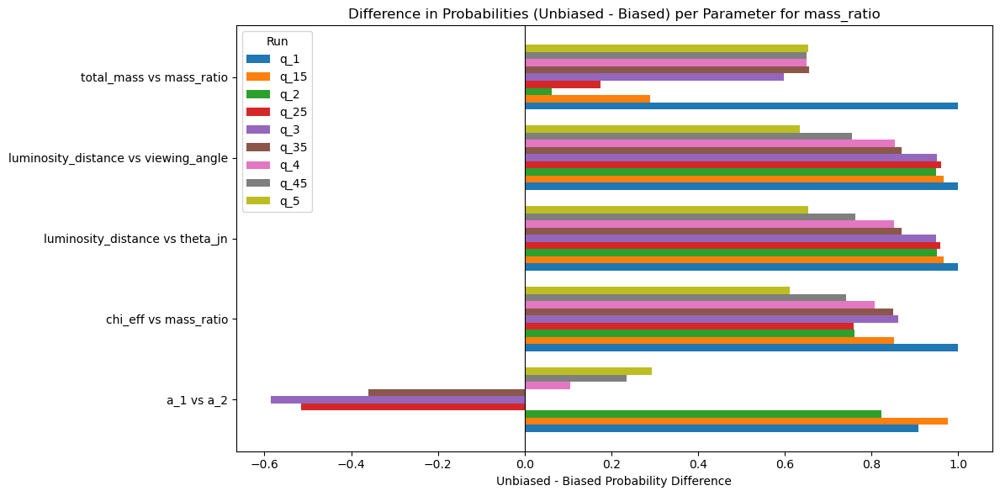

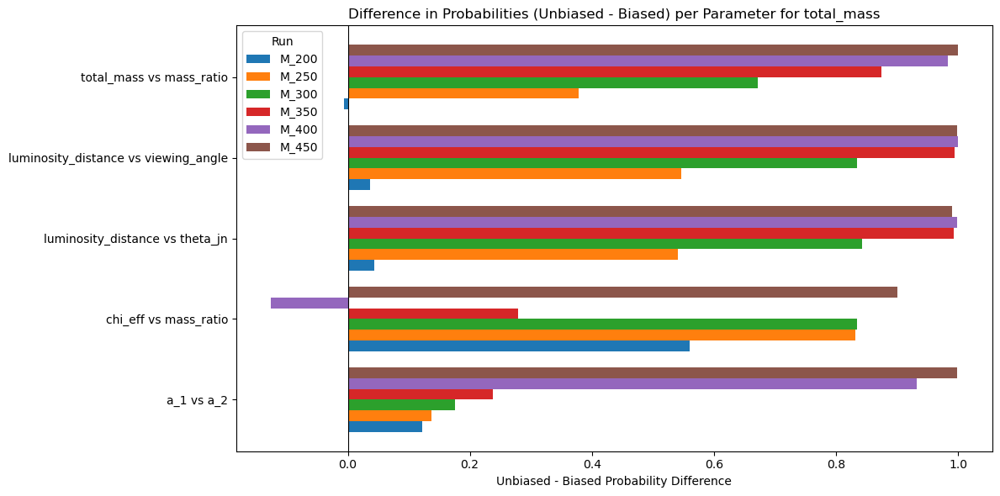

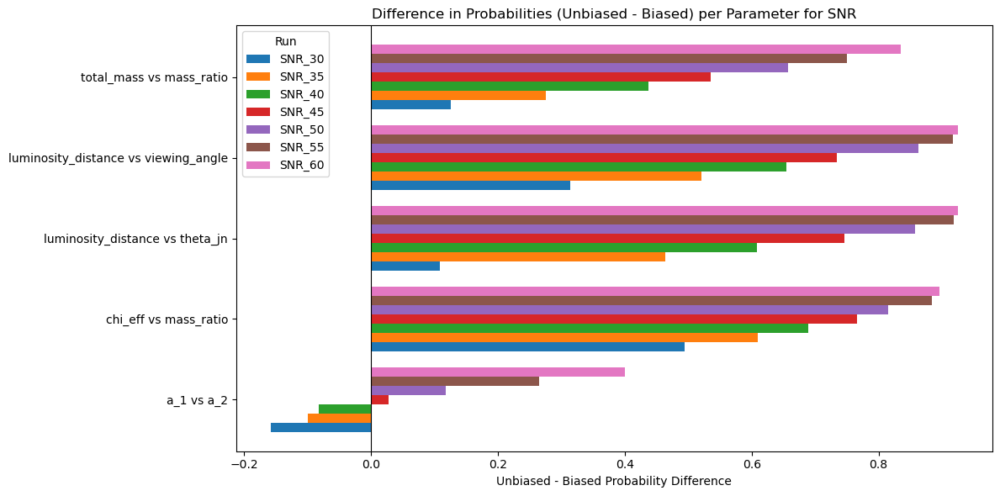

In [55]:
plot_bias_differences_by_parameter(q_diffs_nd, 'mass_ratio')
# plot_bias_differences_by_parameter(q_tilt_diffs_nd, 'tilt_0_mass_ratio')
plot_bias_differences_by_parameter(M_diffs_nd, 'total_mass')
plot_bias_differences_by_parameter(SNR_diffs_nd, 'SNR')

#### Heat Maps

In [58]:
import pandas as pd
import seaborn as sns
def plot_nd_heatmap(diff_dict_by_run, title_name, save_path=None):
    df = pd.DataFrame(diff_dict_by_run).fillna(0)

    def format_param(param):
        param = param.replace("probability ", "").split(" for")[0]
        parts = param.split("_")

        if len(parts) > 2:
            formatted_name = " vs ".join(["_".join(parts[i:i+2]) for i in range(0, len(parts), 2)])
        else:
            formatted_name = "_".join(parts)
        
        return formatted_name

    df.index = [format_param(param) for param in df.index]

    plt.figure(figsize=(10, len(df)))
    sns.heatmap(df, cmap="coolwarm_r", center=0, annot=True, fmt=".2f", linewidths=0.5)
    plt.title(f"Unbiased - Biased Differences (N-Dimensional Heatmap) for {title_name}")
    plt.xlabel("Run")
    plt.ylabel("Parameter Pair")
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, format="pdf")

    plt.show()

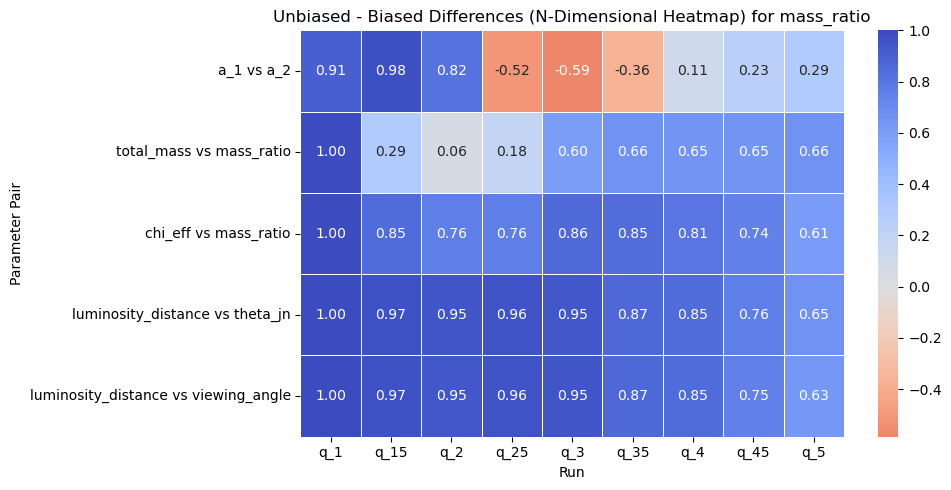

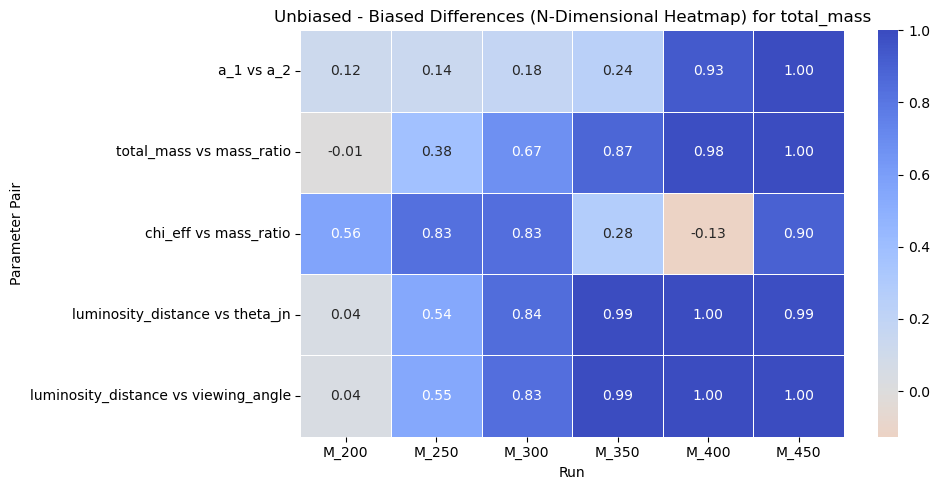

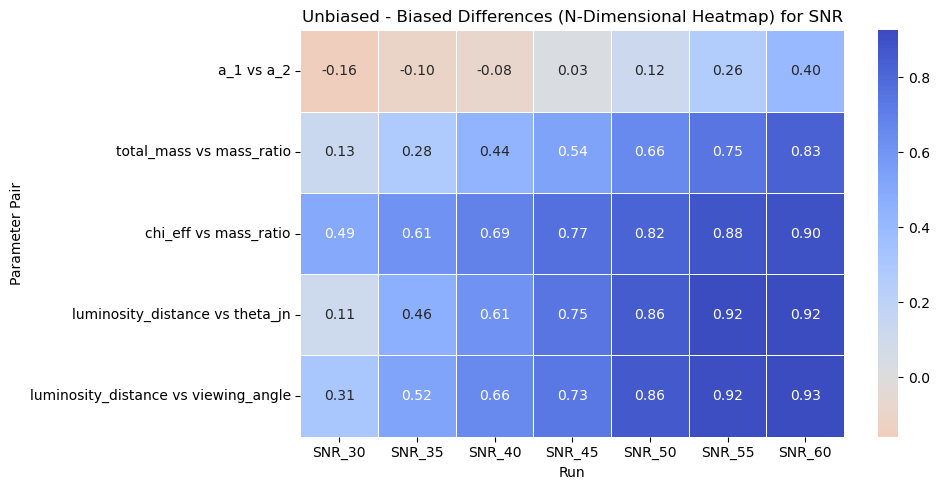

In [61]:
plot_nd_heatmap(q_diffs_nd, 'mass_ratio', save_path='./plots/heat_map_q.pdf')
#plot_nd_heatmap(q_tilt_diffs_nd, 'tilt_0_mass_ratio')
plot_nd_heatmap(M_diffs_nd, 'total_mass', save_path='./plots/heat_map_M.pdf')
plot_nd_heatmap(SNR_diffs_nd, 'SNR', save_path='./plots/heat_map_SNR.pdf')

## Cost Function

### Computation of Costs

In [53]:
q_1_costs = compute_costs(q_1, q_1_injection_values)
q_15_costs = compute_costs(q_15, q_15_injection_values)
q_2_costs = compute_costs(q_2, q_2_injection_values)
q_25_costs = compute_costs(q_25, q_25_injection_values)
q_3_costs = compute_costs(q_3, q_3_injection_values)
q_35_costs = compute_costs(q_35, q_35_injection_values)
q_4_costs = compute_costs(q_4, q_4_injection_values)
q_45_costs = compute_costs(q_45, q_45_injection_values)
q_5_costs = compute_costs(q_5, q_5_injection_values)

In [54]:
# q_1_costs_tilt_0 = compute_costs(q_1_tilt_0, q_1_tilt_0_injection_values)
# q_2_costs_tilt_0 = compute_costs(q_2_tilt_0, q_2_tilt_0_injection_values)
# q_3_costs_tilt_0 = compute_costs(q_3_tilt_0, q_3_tilt_0_injection_values)
# q_4_costs_tilt_0 = compute_costs(q_4_tilt_0, q_4_tilt_0_injection_values)
# q_5_costs_tilt_0 = compute_costs(q_5_tilt_0, q_5_tilt_0_injection_values)

In [55]:
M_200_costs = compute_costs(M_200, M_200_injection_values)
M_250_costs = compute_costs(M_250, M_250_injection_values)
M_300_costs = compute_costs(M_300, M_300_injection_values)
M_350_costs = compute_costs(M_350, M_350_injection_values)
M_400_costs = compute_costs(M_400, M_400_injection_values)

In [56]:
SNR_30_costs = compute_costs(SNR_30, SNR_30_injection_values)
SNR_35_costs = compute_costs(SNR_35, SNR_35_injection_values)
SNR_40_costs = compute_costs(SNR_40, SNR_40_injection_values)
SNR_45_costs = compute_costs(SNR_45, SNR_45_injection_values)
SNR_50_costs = compute_costs(SNR_50, SNR_50_injection_values)
SNR_55_costs = compute_costs(SNR_55, SNR_55_injection_values)
SNR_60_costs = compute_costs(SNR_60, SNR_60_injection_values)

In [57]:
print_costs(q_1_costs, 'q_1')
print_costs(q_15_costs, 'q_15')
print_costs(q_2_costs, 'q_2')
print_costs(q_25_costs, 'q_25')
print_costs(q_3_costs, 'q_3')
print_costs(q_35_costs, 'q_35')
print_costs(q_4_costs, 'q_4')
print_costs(q_45_costs, 'q_45')
print_costs(q_5_costs, 'q_5')

q_1:
mass_1_unbiased_cost: 4.611372992945068
mass_1_unbiased_norm_cost: 0.6317833643418006

mass_1_biased_cost: 4.34589745389213
mass_1_biased_norm_cost: 0.9792023246045021

mass_2_unbiased_cost: 3.486282676368204
mass_2_unbiased_norm_cost: 0.7611900944974177

mass_2_biased_cost: 14.447764006931067
mass_2_biased_norm_cost: 0.2231335944183128

a_1_unbiased_cost: 0.14442048859201334
a_1_unbiased_norm_cost: 0.9749145148249455

a_1_biased_cost: 0.28004392438995207
a_1_biased_norm_cost: 0.34422552807282647

a_2_unbiased_cost: 0.16173432950350325
a_2_unbiased_norm_cost: 0.9882710225331479

a_2_biased_cost: 0.2209285191800793
a_2_biased_norm_cost: 0.8371077375005256

tilt_1_unbiased_cost: 0.31861058761853106
tilt_1_unbiased_norm_cost: 0.7023783924993385

tilt_1_biased_cost: 0.9720104747057808
tilt_1_biased_norm_cost: 0.12846311579312086

tilt_2_unbiased_cost: 0.2881960026158869
tilt_2_unbiased_norm_cost: 0.8769968922094298

tilt_2_biased_cost: 0.43182409759925655
tilt_2_biased_norm_cost: 0.44

In [58]:
print_costs(q_1_costs_tilt_0, 'q_1_tilt_0')
print_costs(q_2_costs_tilt_0, 'q_2_tilt_0')
print_costs(q_3_costs_tilt_0, 'q_3_tilt_0')
print_costs(q_4_costs_tilt_0, 'q_4_tilt_0')
print_costs(q_5_costs_tilt_0, 'q_5_tilt_0')

q_1_tilt_0:
mass_1_unbiased_cost: 3.5821607779740905
mass_1_unbiased_norm_cost: 0.7606023932578749

mass_1_biased_cost: 7.651057392877368
mass_1_biased_norm_cost: 0.39980168332889665

mass_2_unbiased_cost: 3.9877165215504946
mass_2_unbiased_norm_cost: 0.6670087745796505

mass_2_biased_cost: 13.039991831492348
mass_2_biased_norm_cost: 0.21287629278520392

a_1_unbiased_cost: 0.1264282615156628
a_1_unbiased_norm_cost: 0.9869407194351378

a_1_biased_cost: 0.24220999987999478
a_1_biased_norm_cost: 0.8725797909000147

a_2_unbiased_cost: 0.15448297280905846
a_2_unbiased_norm_cost: 0.8850422766968005

a_2_biased_cost: 0.19174496779947456
a_2_biased_norm_cost: 0.9954096528956038

tilt_1_unbiased_cost: 0.36285624652598253
tilt_1_unbiased_norm_cost: 0.4715980357591789

tilt_1_biased_cost: 0.9166405657212009
tilt_1_biased_norm_cost: 0.2723648619103856

tilt_2_unbiased_cost: 0.32810511807659554
tilt_2_unbiased_norm_cost: 0.47924568651645416

tilt_2_biased_cost: 1.0601285766743964
tilt_2_biased_norm

In [59]:
print_costs(M_200_costs, 'M_200')
print_costs(M_250_costs, 'M_250')
print_costs(M_300_costs, 'M_300')
print_costs(M_350_costs, 'M_350')
print_costs(M_400_costs, 'M_400')

M_200:
mass_1_unbiased_cost: 2.433504031326191
mass_1_unbiased_norm_cost: 0.9676656799811528

mass_1_biased_cost: 2.346248004549177
mass_1_biased_norm_cost: 0.9843453802344576

mass_2_unbiased_cost: 1.626751399933145
mass_2_unbiased_norm_cost: 0.9817955488750326

mass_2_biased_cost: 2.152834907562198
mass_2_biased_norm_cost: 0.978364440785826

a_1_unbiased_cost: 0.032032184936498634
a_1_unbiased_norm_cost: 0.8878774693732023

a_1_biased_cost: 0.03281068007851914
a_1_biased_norm_cost: 0.9706862760926958

a_2_unbiased_cost: 0.25947599844764546
a_2_unbiased_norm_cost: 0.9565928093770235

a_2_biased_cost: 0.28941408861285783
a_2_biased_norm_cost: 0.8169197334019124

tilt_1_unbiased_cost: 0.06632105318964275
tilt_1_unbiased_norm_cost: 0.9839706264509247

tilt_1_biased_cost: 0.06435034914403337
tilt_1_biased_norm_cost: 0.9714229708577699

tilt_2_unbiased_cost: 0.5234009995567119
tilt_2_unbiased_norm_cost: 0.9590869954975433

tilt_2_biased_cost: 0.6370768207907778
tilt_2_biased_norm_cost: 0.8

In [60]:
print_costs(SNR_30_costs, 'SNR_30')
print_costs(SNR_35_costs, 'SNR_35')
print_costs(SNR_40_costs, 'SNR_40')
print_costs(SNR_45_costs, 'SNR_45')
print_costs(SNR_50_costs, 'SNR_50')
print_costs(SNR_55_costs, 'SNR_55')
print_costs(SNR_60_costs, 'SNR_60')

SNR_30:
mass_1_unbiased_cost: 6.3255390688231055
mass_1_unbiased_norm_cost: 0.7790196129748994

mass_1_biased_cost: 5.37231039046603
mass_1_biased_norm_cost: 0.9536561658180164

mass_2_unbiased_cost: 5.599445283879375
mass_2_unbiased_norm_cost: 0.9859537932735648

mass_2_biased_cost: 8.524750979239839
mass_2_biased_norm_cost: 0.7040555586438171

a_1_unbiased_cost: 0.07977597199036593
a_1_unbiased_norm_cost: 0.7236567062304085

a_1_biased_cost: 0.05729976261517376
a_1_biased_norm_cost: 0.9809014034518254

a_2_unbiased_cost: 0.30637295896189753
a_2_unbiased_norm_cost: 0.8571977782737639

a_2_biased_cost: 0.3015594554422002
a_2_biased_norm_cost: 0.8702161161611615

tilt_1_unbiased_cost: 0.15131437723560584
tilt_1_unbiased_norm_cost: 0.8295093994356199

tilt_1_biased_cost: 0.177574379819744
tilt_1_biased_norm_cost: 0.7052459802678354

tilt_2_unbiased_cost: 0.8997116543866052
tilt_2_unbiased_norm_cost: 0.7643887876422598

tilt_2_biased_cost: 0.90527926417077
tilt_2_biased_norm_cost: 0.75140

### Bar Graph Displaying Costs

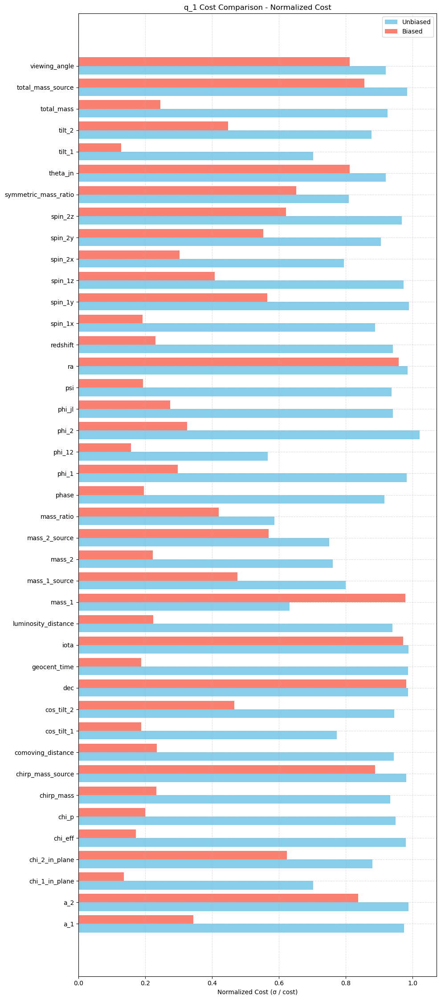

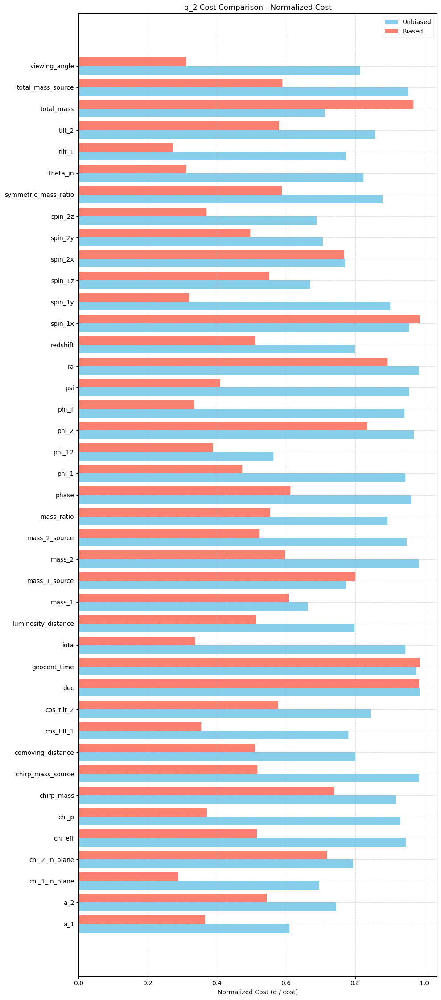

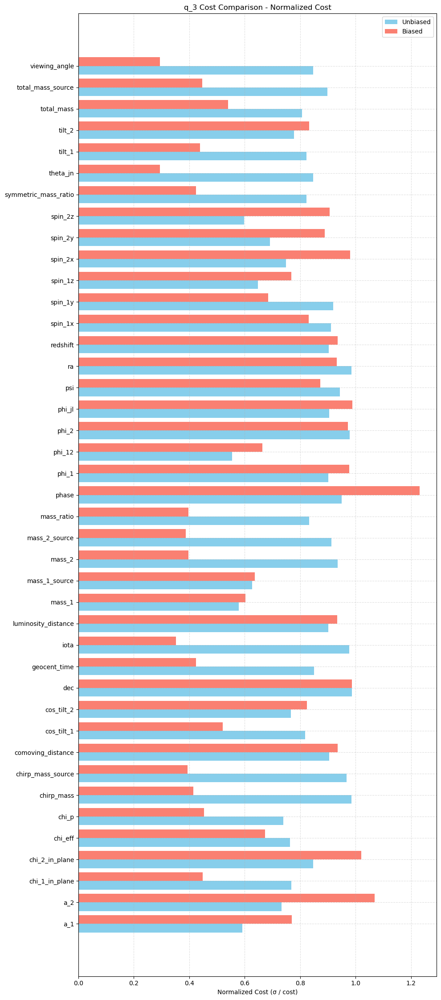

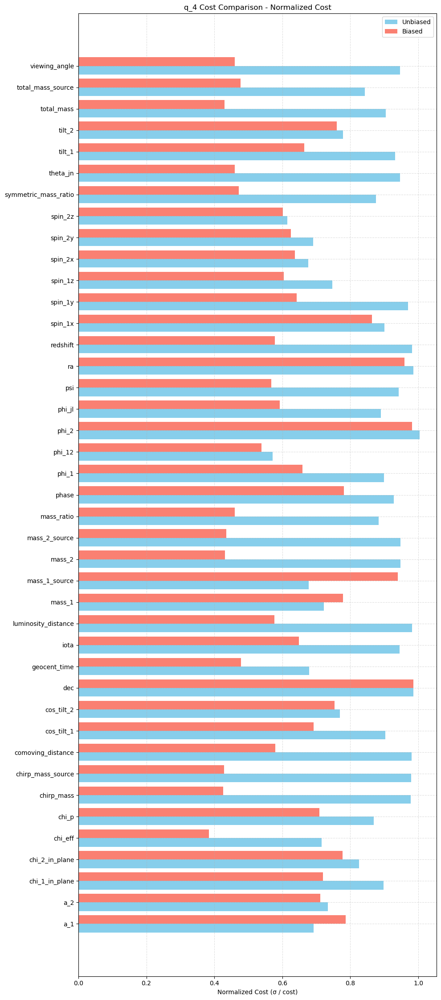

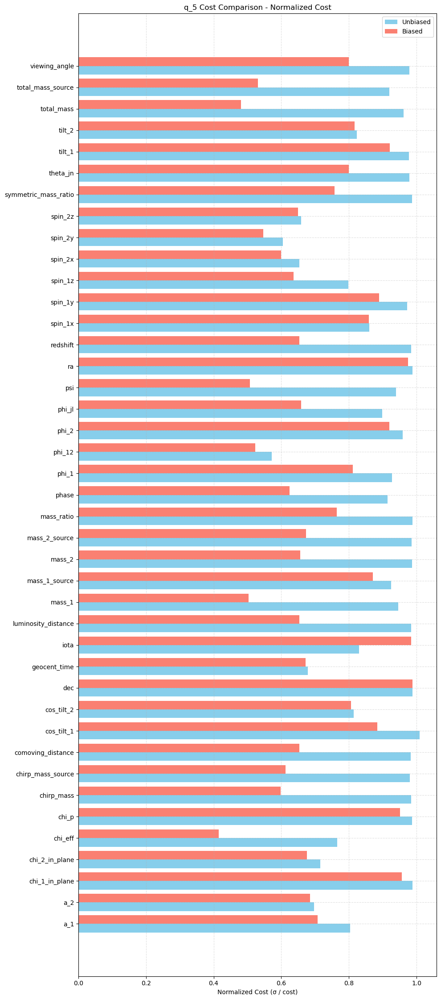

In [37]:
plot_costs(q_1_costs, title="q_1 Cost Comparison", show_cost=False)
# plot_costs(q_15_costs, title="q_15 Cost Comparison", show_cost=False)
plot_costs(q_2_costs, title="q_2 Cost Comparison", show_cost=False)
# plot_costs(q_25_costs, title="q_25 Cost Comparison", show_cost=False)
plot_costs(q_3_costs, title="q_3 Cost Comparison", show_cost=False)
# plot_costs(q_35_costs, title="q_35 Cost Comparison", show_cost=False)
plot_costs(q_4_costs, title="q_4 Cost Comparison", show_cost=False)
# plot_costs(q_45_costs, title="q_45 Cost Comparison", show_cost=False)
plot_costs(q_5_costs, title="q_5 Cost Comparison", show_cost=False)

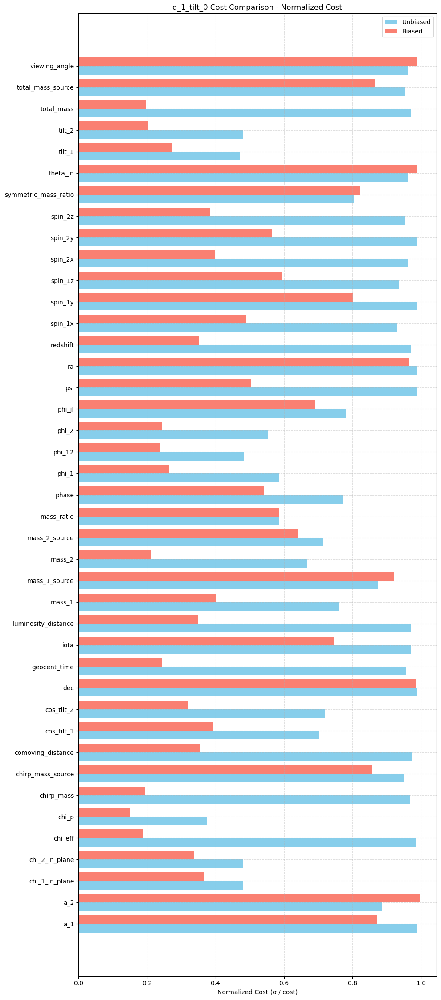

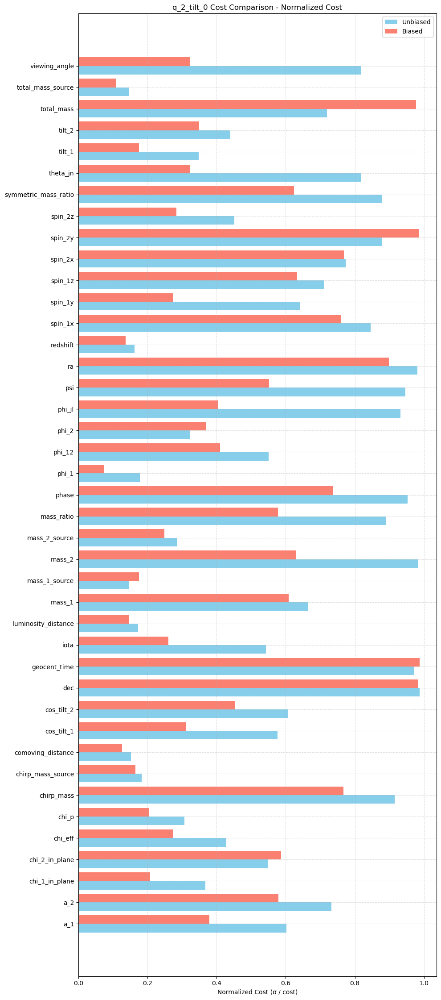

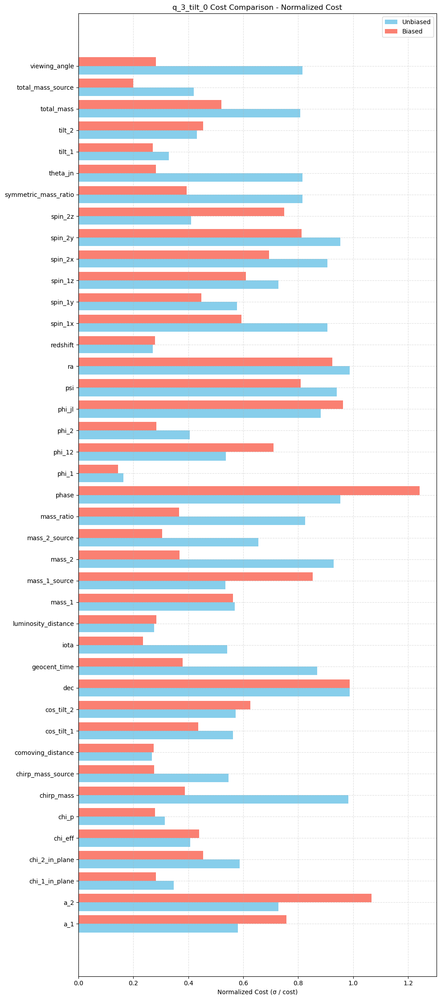

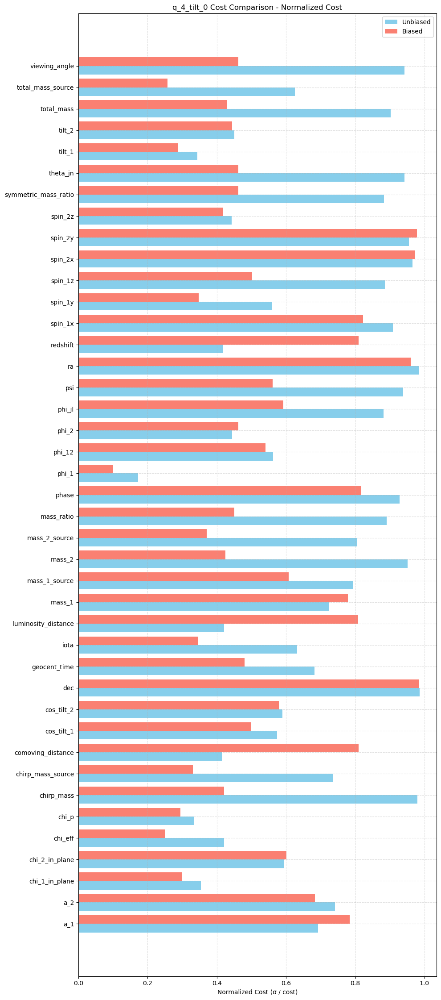

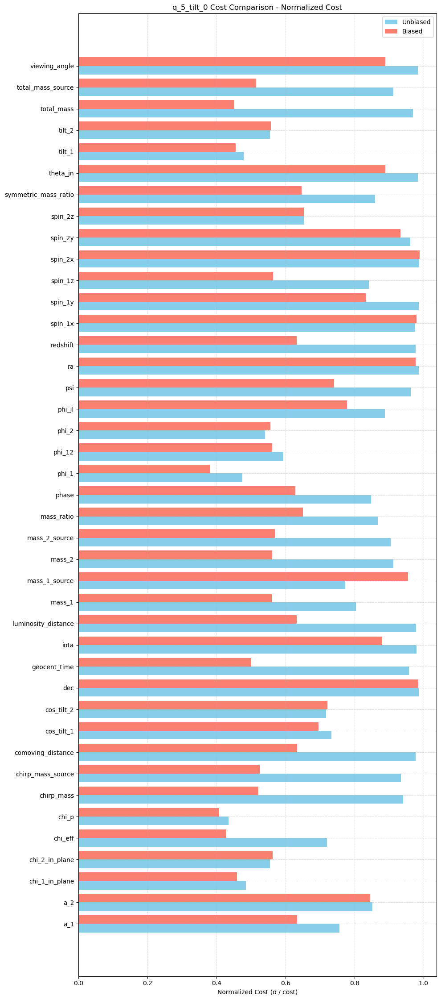

In [38]:
plot_costs(q_1_costs_tilt_0, title="q_1_tilt_0 Cost Comparison", show_cost=False)
plot_costs(q_2_costs_tilt_0, title="q_2_tilt_0 Cost Comparison", show_cost=False)
plot_costs(q_3_costs_tilt_0, title="q_3_tilt_0 Cost Comparison", show_cost=False)
plot_costs(q_4_costs_tilt_0, title="q_4_tilt_0 Cost Comparison", show_cost=False)
plot_costs(q_5_costs_tilt_0, title="q_5_tilt_0 Cost Comparison", show_cost=False)

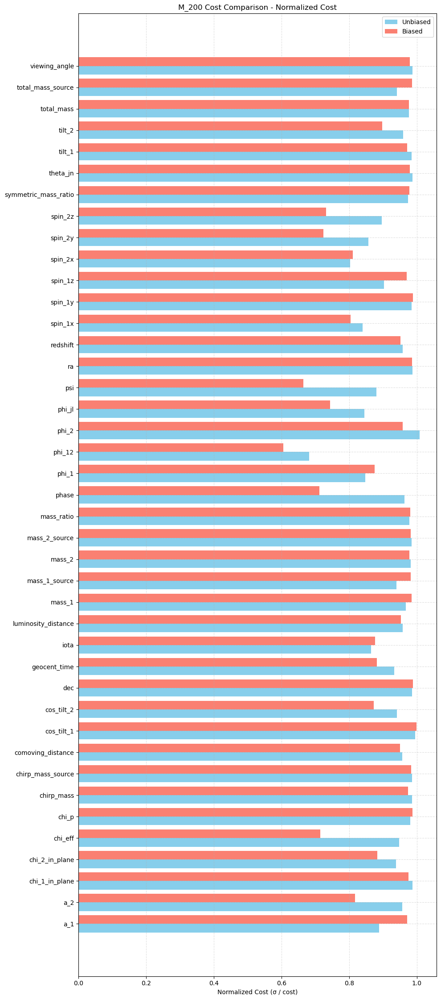

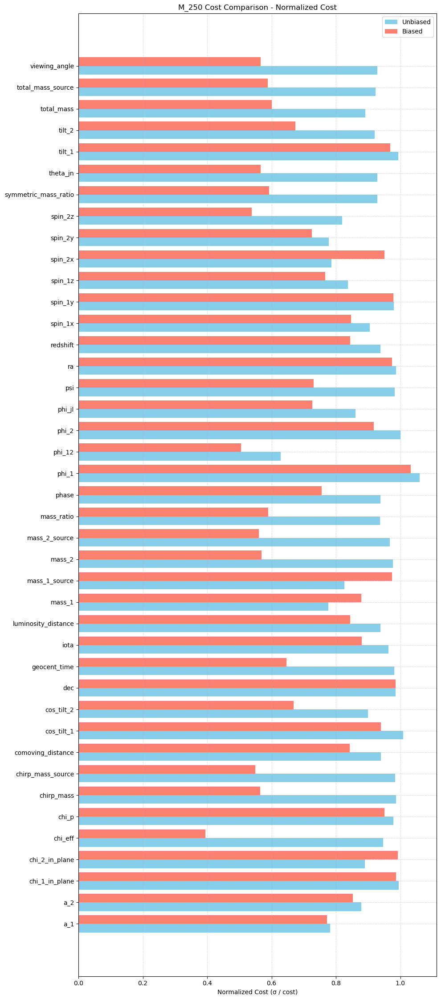

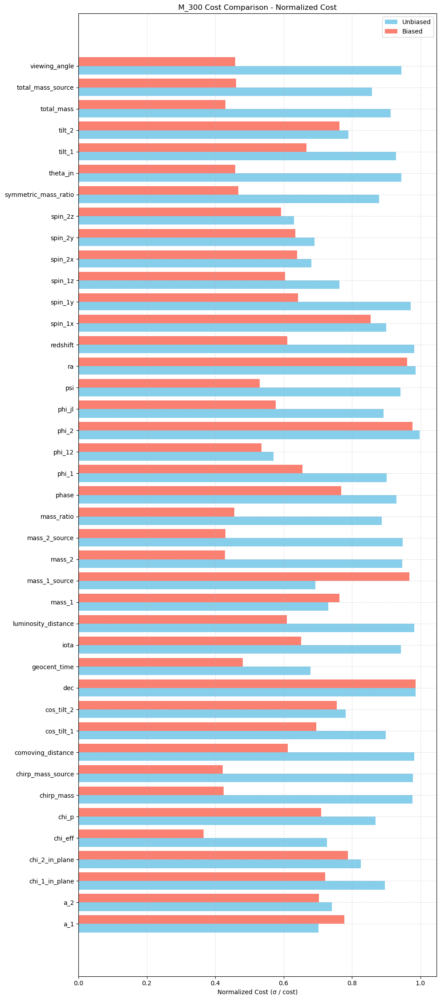

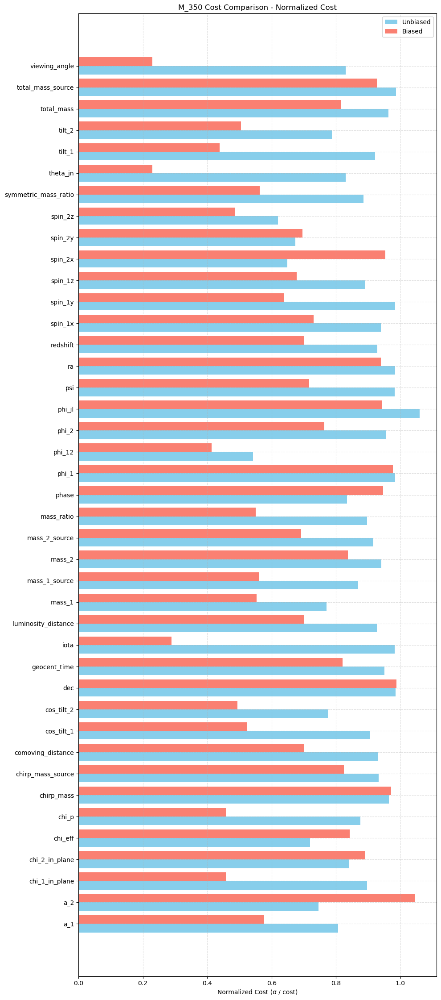

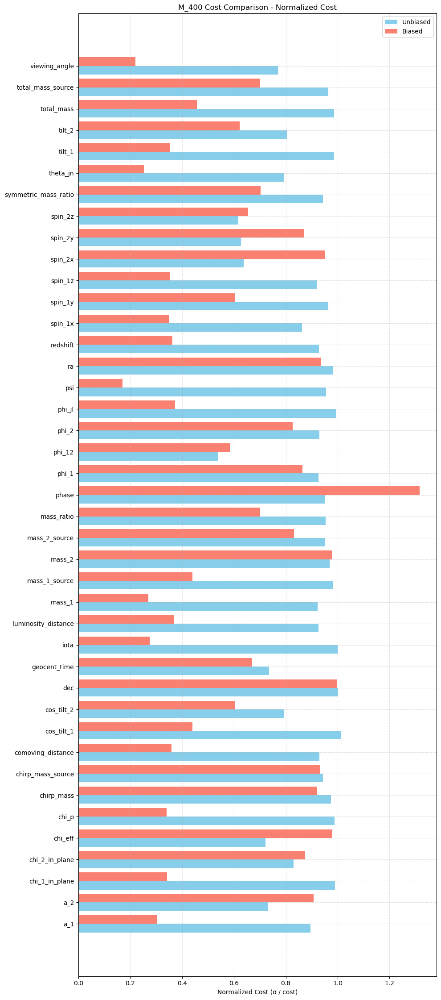

In [39]:
plot_costs(M_200_costs, title="M_200 Cost Comparison", show_cost=False)
plot_costs(M_250_costs, title="M_250 Cost Comparison", show_cost=False)
plot_costs(M_300_costs, title="M_300 Cost Comparison", show_cost=False)
plot_costs(M_350_costs, title="M_350 Cost Comparison", show_cost=False)
plot_costs(M_400_costs, title="M_400 Cost Comparison", show_cost=False)

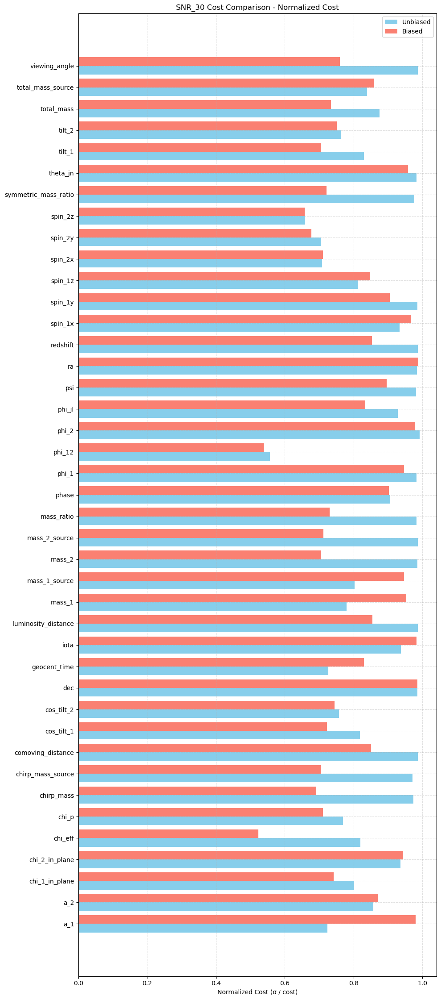

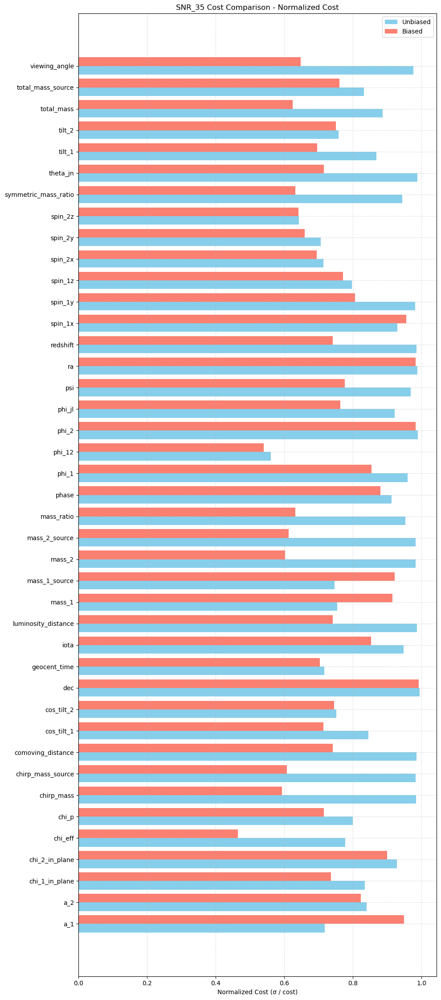

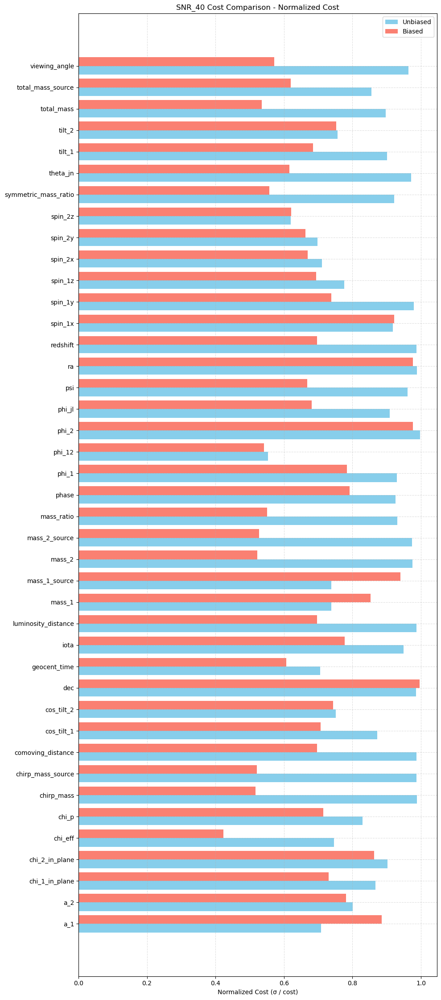

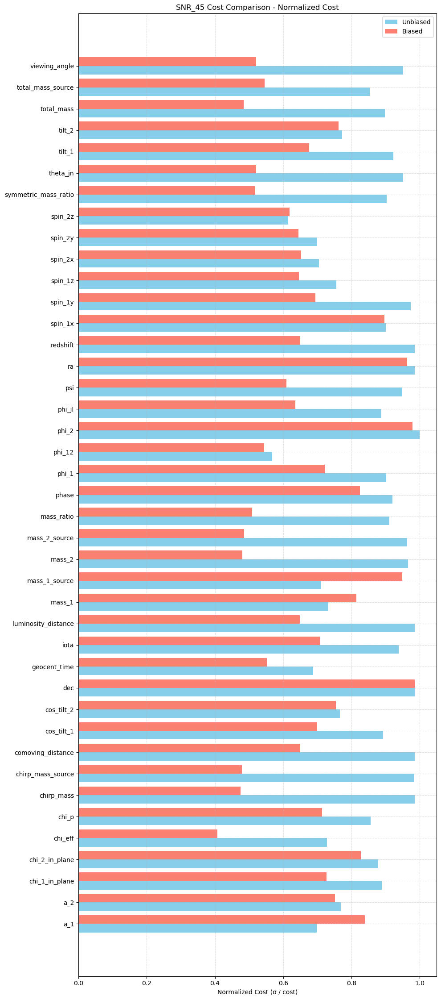

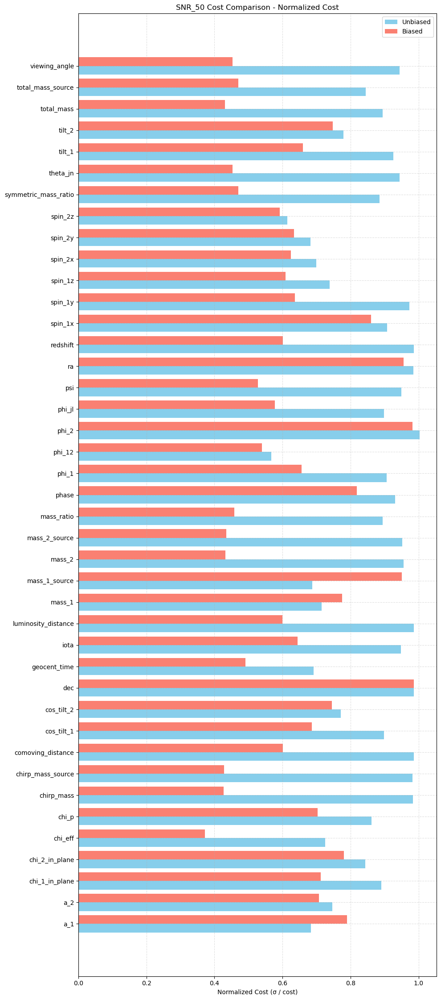

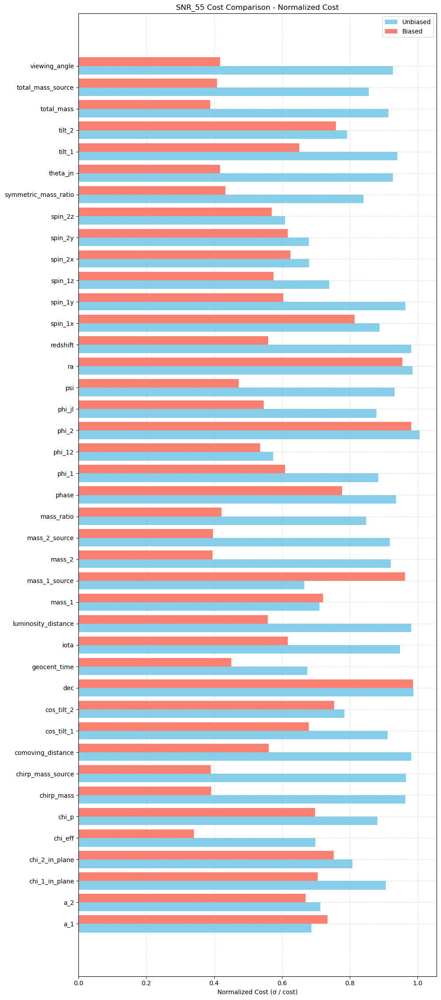

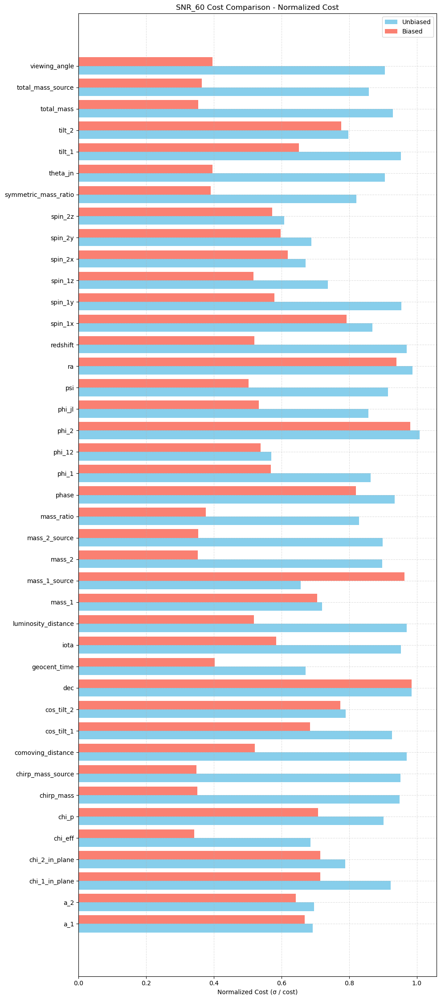

In [40]:
plot_costs(SNR_30_costs, title="SNR_30 Cost Comparison", show_cost=False)
plot_costs(SNR_35_costs, title="SNR_35 Cost Comparison", show_cost=False)
plot_costs(SNR_40_costs, title="SNR_40 Cost Comparison", show_cost=False)
plot_costs(SNR_45_costs, title="SNR_45 Cost Comparison", show_cost=False)
plot_costs(SNR_50_costs, title="SNR_50 Cost Comparison", show_cost=False)
plot_costs(SNR_55_costs, title="SNR_55 Cost Comparison", show_cost=False)
plot_costs(SNR_60_costs, title="SNR_60 Cost Comparison", show_cost=False)

## Compare Costs and Sigma

### Plotting the Difference

In [41]:
plot_cost_and_probability_comparison(q_1_costs, results_q_1, title="Cost and Probability Comparison for q=1")
plot_cost_and_probability_comparison(q_15_costs, results_q_15, title="Cost and Probability Comparison for q=1.5")
plot_cost_and_probability_comparison(q_2_costs, results_q_2, title="Cost and Probability Comparison for q=2")
plot_cost_and_probability_comparison(q_25_costs, results_q_25, title="Cost and Probability Comparison for q=2.5")
plot_cost_and_probability_comparison(q_3_costs, results_q_3, title="Cost and Probability Comparison for q=3")
plot_cost_and_probability_comparison(q_35_costs, results_q_35, title="Cost and Probability Comparison for q=3.5")
plot_cost_and_probability_comparison(q_4_costs, results_q_4, title="Cost and Probability Comparison for q=4")
plot_cost_and_probability_comparison(q_45_costs, results_q_45, title="Cost and Probability Comparison for q=4.5")
plot_cost_and_probability_comparison(q_5_costs, results_q_5, title="Cost and Probability Comparison for q=5")

NameError: name 'results_q_1' is not defined

In [42]:
plot_cost_and_probability_comparison(q_1_costs_tilt_0, results_q_1_tilt_0, title="Cost and Probability Comparison for q=1_tilt_0")
plot_cost_and_probability_comparison(q_2_costs_tilt_0, results_q_2_tilt_0, title="Cost and Probability Comparison for q=2_tilt_0")
plot_cost_and_probability_comparison(q_3_costs_tilt_0, results_q_3_tilt_0, title="Cost and Probability Comparison for q=3_tilt_0")
plot_cost_and_probability_comparison(q_4_costs_tilt_0, results_q_4_tilt_0, title="Cost and Probability Comparison for q=4_tilt_0")
plot_cost_and_probability_comparison(q_5_costs_tilt_0, results_q_5_tilt_0, title="Cost and Probability Comparison for q=5_tilt_0")

NameError: name 'results_q_1_tilt_0' is not defined

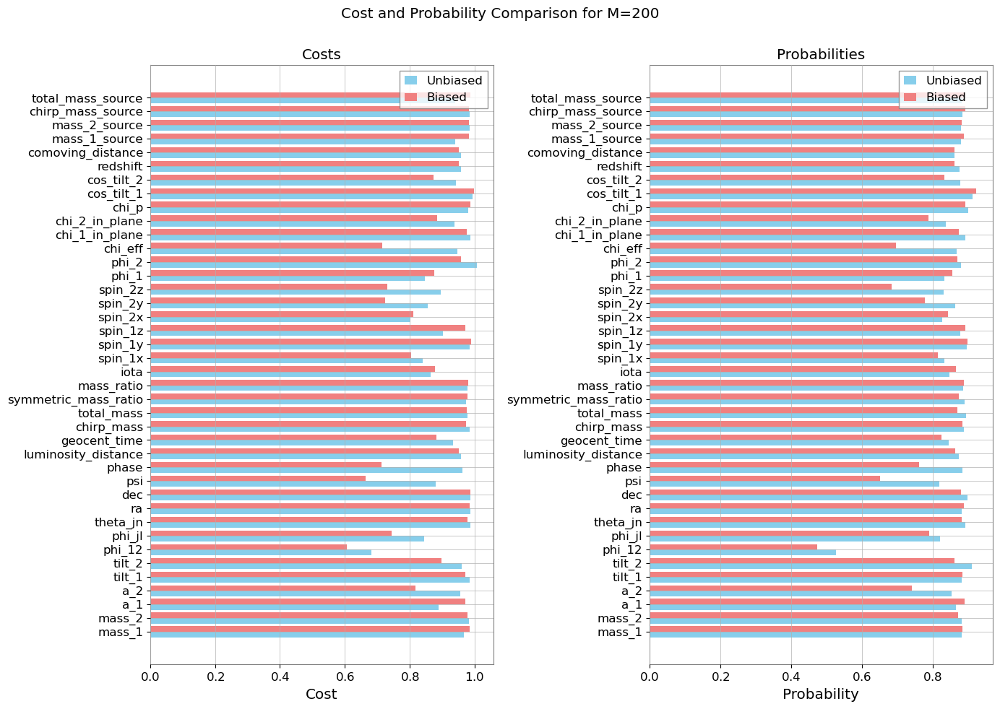

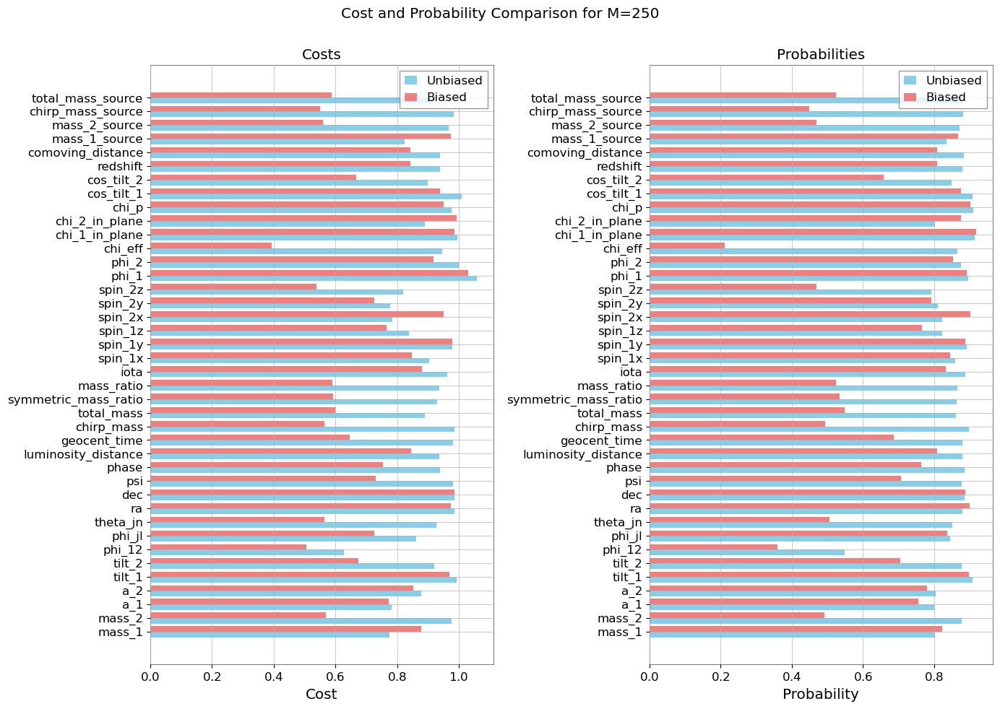

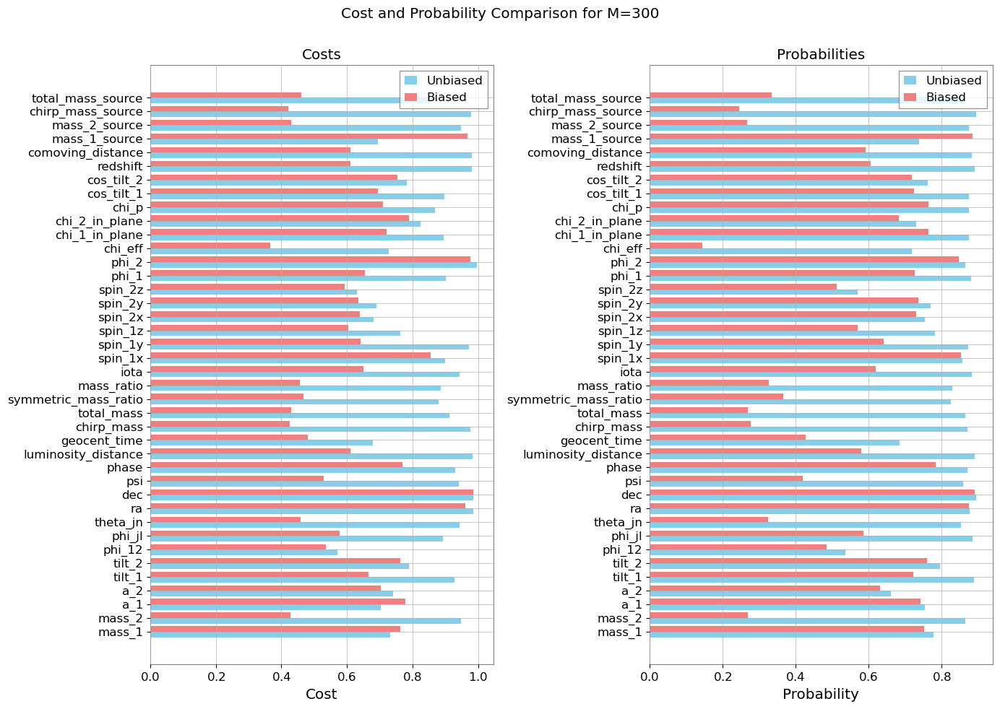

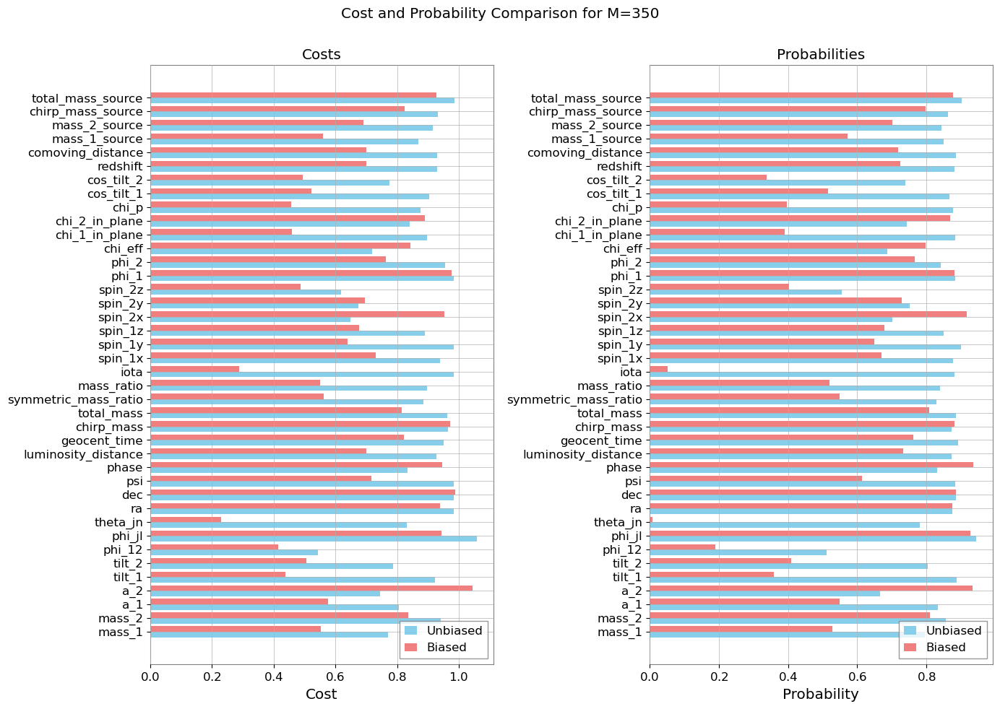

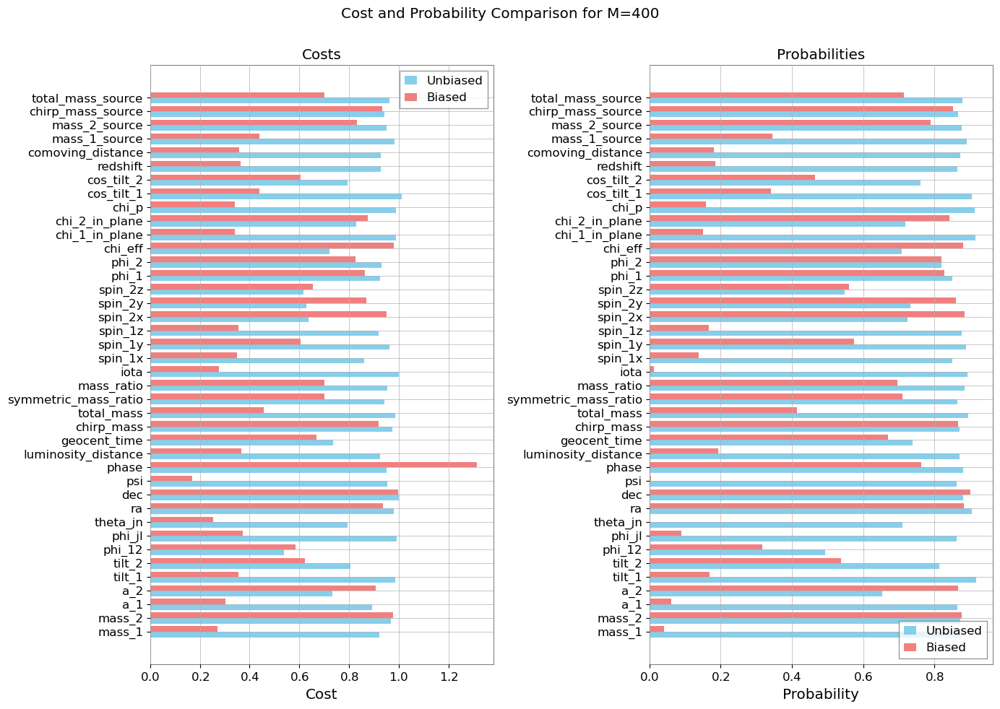

In [118]:
plot_cost_and_probability_comparison(M_200_costs, results_M_200, title="Cost and Probability Comparison for M=200")
plot_cost_and_probability_comparison(M_250_costs, results_M_250, title="Cost and Probability Comparison for M=250")
plot_cost_and_probability_comparison(M_300_costs, results_M_300, title="Cost and Probability Comparison for M=300")
plot_cost_and_probability_comparison(M_350_costs, results_M_350, title="Cost and Probability Comparison for M=350")
plot_cost_and_probability_comparison(M_400_costs, results_M_400, title="Cost and Probability Comparison for M=400")

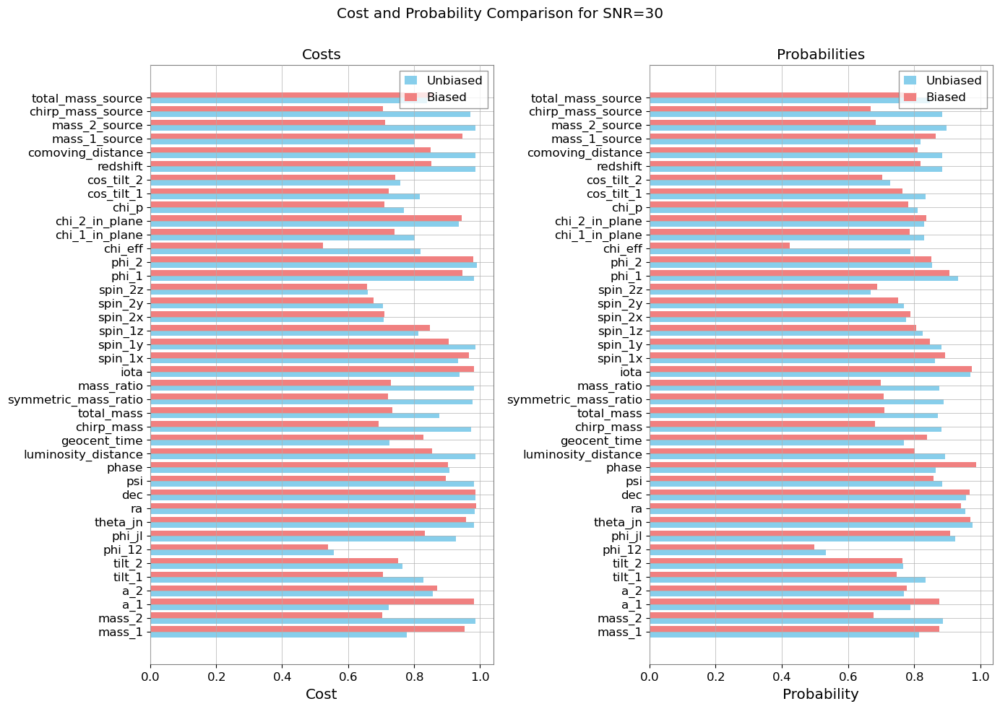

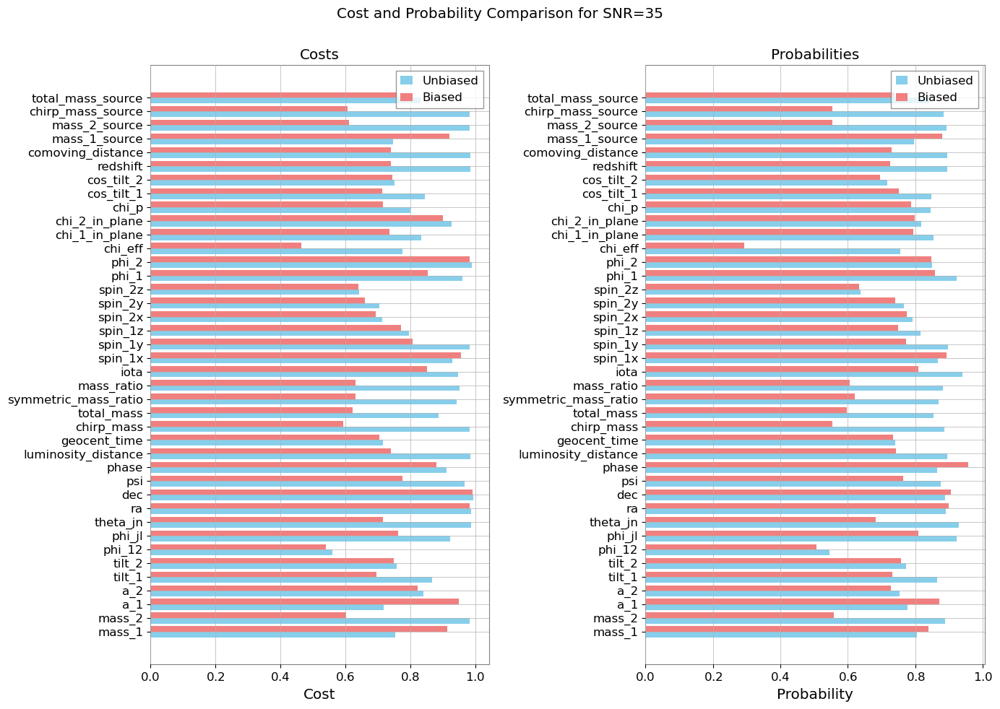

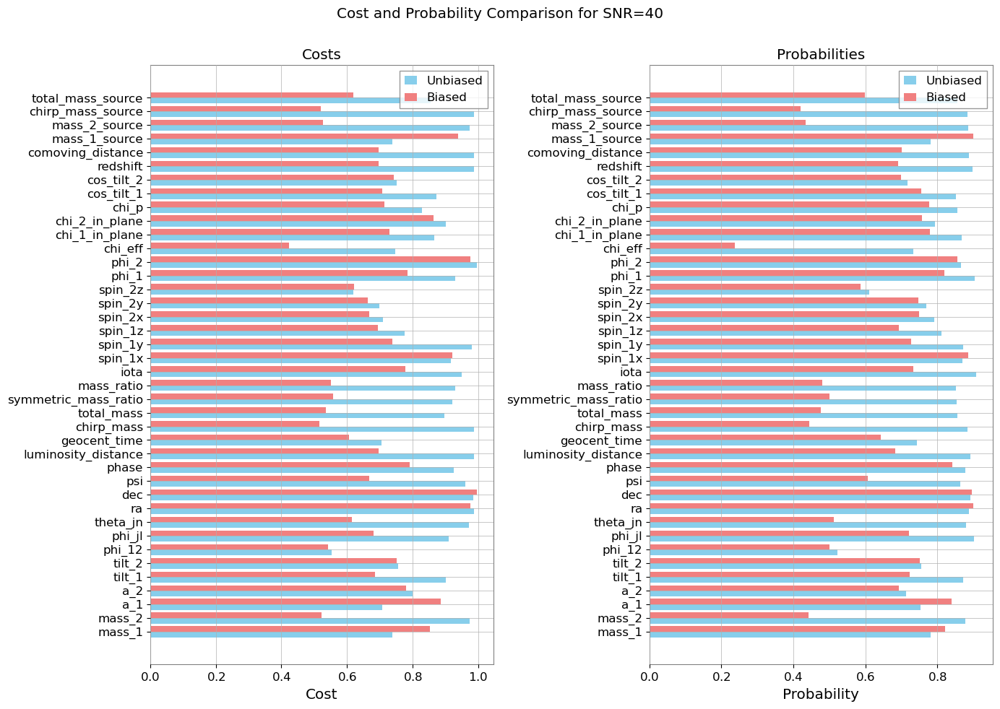

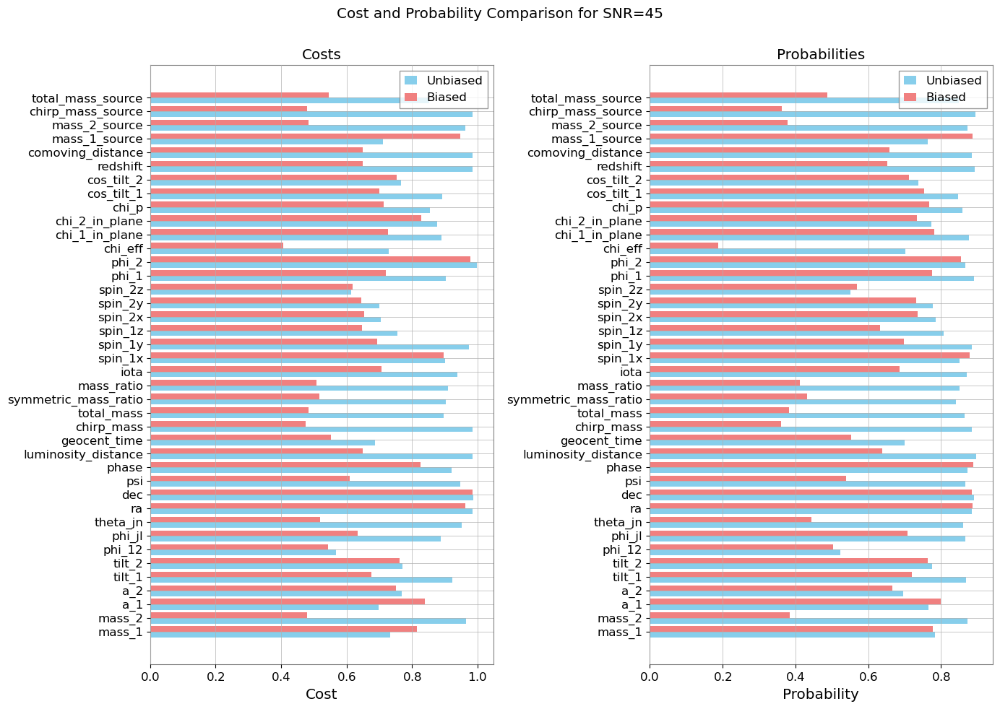

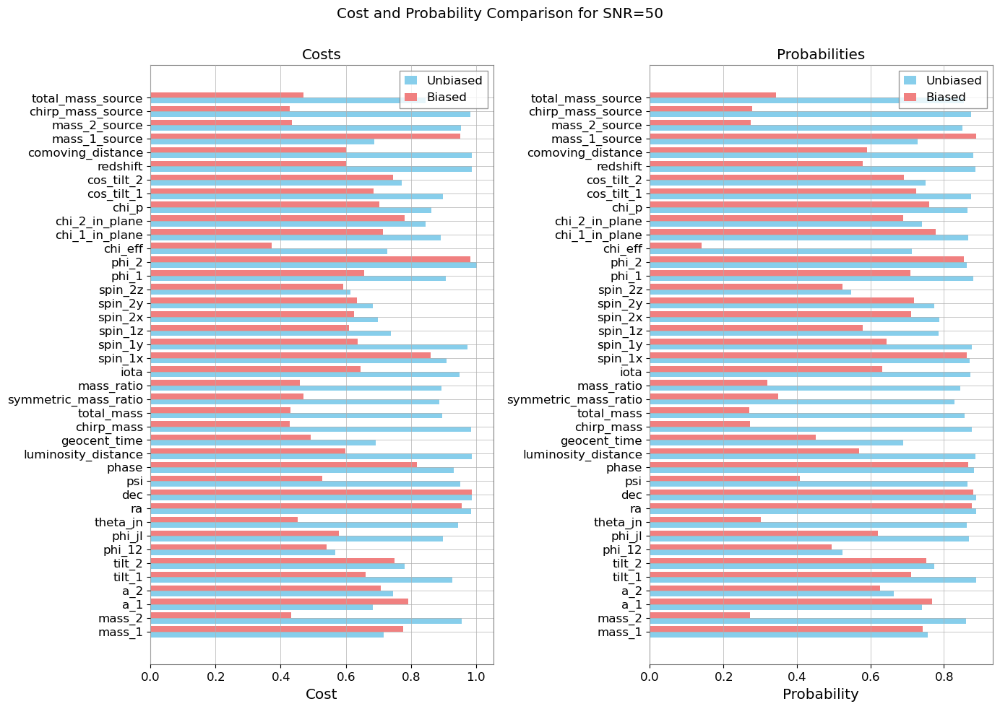

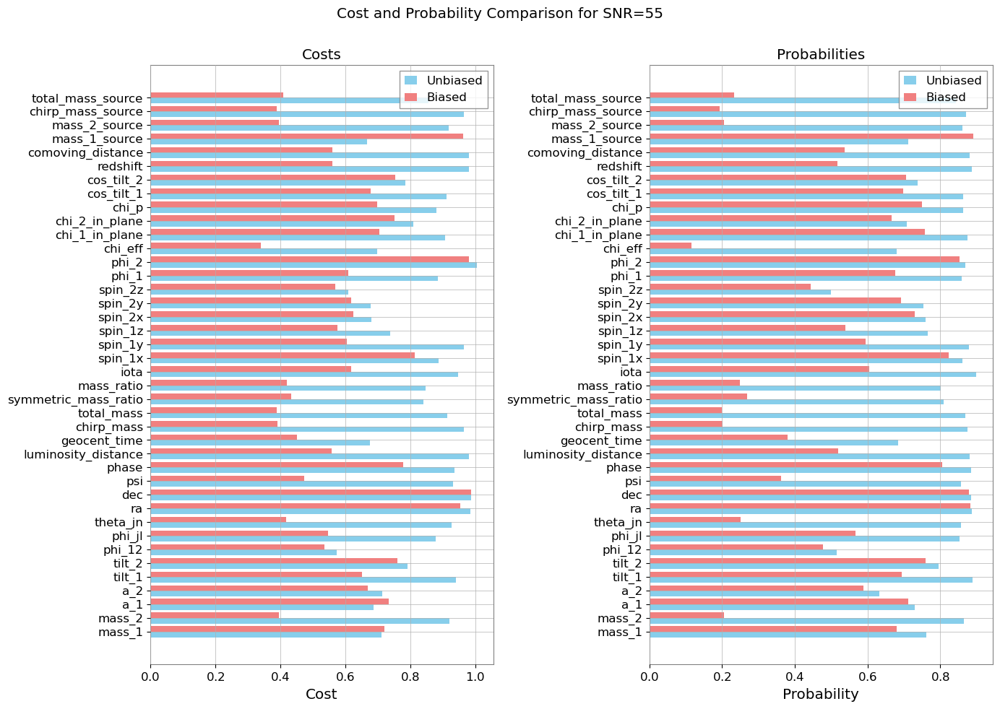

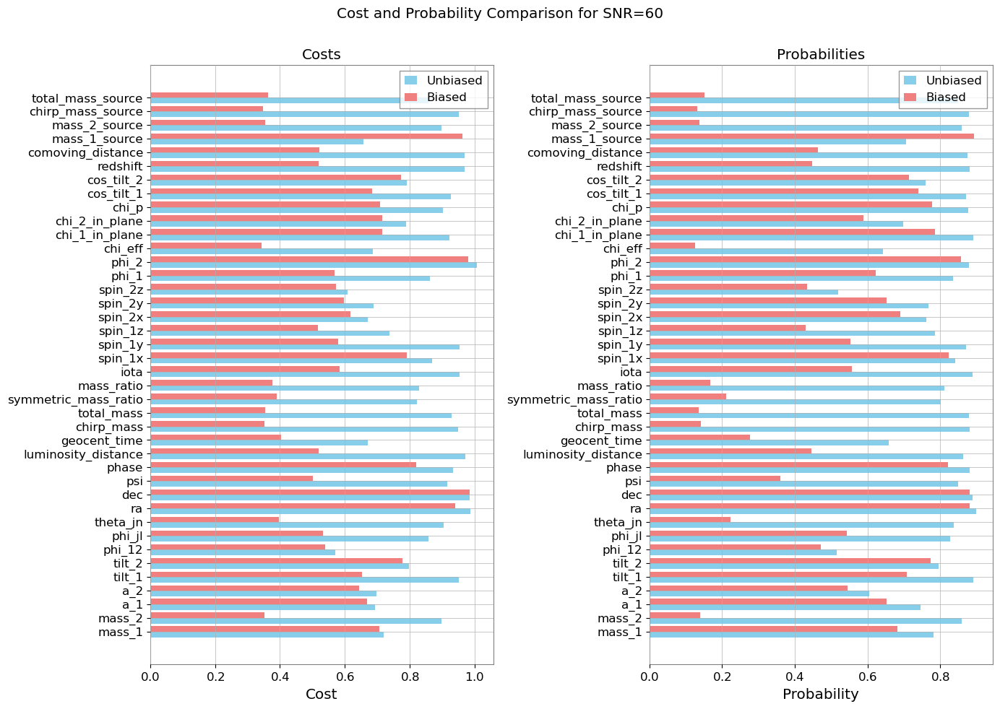

In [119]:
plot_cost_and_probability_comparison(SNR_30_costs, results_SNR_30, title="Cost and Probability Comparison for SNR=30")
plot_cost_and_probability_comparison(SNR_35_costs, results_SNR_35, title="Cost and Probability Comparison for SNR=35")
plot_cost_and_probability_comparison(SNR_40_costs, results_SNR_40, title="Cost and Probability Comparison for SNR=40")
plot_cost_and_probability_comparison(SNR_45_costs, results_SNR_45, title="Cost and Probability Comparison for SNR=45")
plot_cost_and_probability_comparison(SNR_50_costs, results_SNR_50, title="Cost and Probability Comparison for SNR=50")
plot_cost_and_probability_comparison(SNR_55_costs, results_SNR_55, title="Cost and Probability Comparison for SNR=55")
plot_cost_and_probability_comparison(SNR_60_costs, results_SNR_60, title="Cost and Probability Comparison for SNR=60")

## Bayes Factor

### Computation of Bayes Factor

In [24]:
label_list, parent_dir = ['unbiased', 'biased'], 'mass_ratio'
loc_q_1 = generate_filename(label_list, parent_dir, 'q_1')
loc_q_15 = generate_filename(label_list, parent_dir, 'q_15')
loc_q_2 = generate_filename(label_list, parent_dir, 'q_2')
loc_q_25 = generate_filename(label_list, parent_dir, 'q_25')
loc_q_3 = generate_filename(label_list, parent_dir, 'q_3')
loc_q_35 = generate_filename(label_list, parent_dir, 'q_35')
loc_q_4 = generate_filename(label_list, parent_dir, 'q_4')
loc_q_45 = generate_filename(label_list, parent_dir, 'q_45')
loc_q_5 = generate_filename(label_list, parent_dir, 'q_5')

In [26]:
q_1_log_bf, q_1_bf = bayes_factor(loc_q_1)
q_15_log_bf, q_15_bf = bayes_factor(loc_q_15)
q_2_log_bf, q_2_bf = bayes_factor(loc_q_2)
q_25_log_bf, q_25_bf = bayes_factor(loc_q_25)
q_3_log_bf, q_3_bf = bayes_factor(loc_q_3)
q_35_log_bf, q_35_bf = bayes_factor(loc_q_35)
q_4_log_bf, q_4_bf = bayes_factor(loc_q_4)
q_45_log_bf, q_45_bf = bayes_factor(loc_q_45)
q_5_log_bf, q_5_bf = bayes_factor(loc_q_5)

In [29]:
label_list, parent_dir = ['unbiased', 'biased'], 'mass_ratio'
loc_q_1_tilt_0 = generate_filename(label_list, parent_dir, 'q_1_tilt_0')
loc_q_2_tilt_0 = generate_filename(label_list, parent_dir, 'q_2_tilt_0')
loc_q_3_tilt_0 = generate_filename(label_list, parent_dir, 'q_3_tilt_0')
loc_q_4_tilt_0 = generate_filename(label_list, parent_dir, 'q_4_tilt_0')
loc_q_5_tilt_0 = generate_filename(label_list, parent_dir, 'q_5_tilt_0')

In [30]:
q_1_tilt_0_log_bf, q_1_tilt_0_bf = bayes_factor(loc_q_1_tilt_0)
q_2_tilt_0_log_bf, q_2_tilt_0_bf = bayes_factor(loc_q_2_tilt_0)
q_3_tilt_0_log_bf, q_3_tilt_0_bf = bayes_factor(loc_q_3_tilt_0)
q_4_tilt_0_log_bf, q_4_tilt_0_bf = bayes_factor(loc_q_4_tilt_0)
q_5_tilt_0_log_bf, q_5_tilt_0_bf = bayes_factor(loc_q_5_tilt_0)

In [63]:
label_list, parent_dir = ['unbiased', 'biased'], 'total_mass'
loc_M_200 = generate_filename(label_list, parent_dir, 'M_200')
loc_M_250 = generate_filename(label_list, parent_dir, 'M_250')
loc_M_300 = generate_filename(label_list, parent_dir, 'M_300')
loc_M_350 = generate_filename(label_list, parent_dir, 'M_350')
loc_M_400 = generate_filename(label_list, parent_dir, 'M_400')
loc_M_450 = generate_filename(label_list, parent_dir, 'M_450')

In [64]:
M_200_log_bf, M_200_bf = bayes_factor(loc_M_200)
M_250_log_bf, M_250_bf = bayes_factor(loc_M_250)
M_300_log_bf, M_300_bf = bayes_factor(loc_M_300)
M_350_log_bf, M_350_bf = bayes_factor(loc_M_350)
M_400_log_bf, M_400_bf = bayes_factor(loc_M_400)
M_450_log_bf, M_450_bf = bayes_factor(loc_M_450)

In [33]:
label_list, parent_dir = ['unbiased', 'biased'], 'SNR'
loc_SNR_30 = generate_filename(label_list, parent_dir, 'SNR_30')
loc_SNR_35 = generate_filename(label_list, parent_dir, 'SNR_35')
loc_SNR_40 = generate_filename(label_list, parent_dir, 'SNR_40')
loc_SNR_45 = generate_filename(label_list, parent_dir, 'SNR_45')
loc_SNR_50 = generate_filename(label_list, parent_dir, 'SNR_50')
loc_SNR_55 = generate_filename(label_list, parent_dir, 'SNR_55')
loc_SNR_60 = generate_filename(label_list, parent_dir, 'SNR_60')

In [34]:
SNR_30_log_bf, SNR_30_bf = bayes_factor(loc_SNR_30)
SNR_35_log_bf, SNR_35_bf = bayes_factor(loc_SNR_35)
SNR_40_log_bf, SNR_40_bf = bayes_factor(loc_SNR_40)
SNR_45_log_bf, SNR_45_bf = bayes_factor(loc_SNR_45)
SNR_50_log_bf, SNR_50_bf = bayes_factor(loc_SNR_50)
SNR_55_log_bf, SNR_55_bf = bayes_factor(loc_SNR_55)
SNR_60_log_bf, SNR_60_bf = bayes_factor(loc_SNR_60)

In [35]:
print_bayes_factor(q_1_log_bf, q_1_bf, 'q_1')
print_bayes_factor(q_15_log_bf, q_15_bf, 'q_15')
print_bayes_factor(q_2_log_bf, q_2_bf, 'q_2')
print_bayes_factor(q_25_log_bf, q_25_bf, 'q_25')
print_bayes_factor(q_3_log_bf, q_3_bf, 'q_3')
print_bayes_factor(q_35_log_bf, q_35_bf, 'q_35')
print_bayes_factor(q_4_log_bf, q_4_bf, 'q_4')
print_bayes_factor(q_45_log_bf, q_45_bf, 'q_45')
print_bayes_factor(q_5_log_bf, q_5_bf, 'q_5')

q_1:
Log Bayes Factor (unbiased vs biased): 41.45
Bayes Factor: 1003982084699307264.00

q_15:
Log Bayes Factor (unbiased vs biased): 32.18
Bayes Factor: 94789420268584.50

q_2:
Log Bayes Factor (unbiased vs biased): 28.73
Bayes Factor: 2997367811210.01

q_25:
Log Bayes Factor (unbiased vs biased): 28.49
Bayes Factor: 2362950519540.53

q_3:
Log Bayes Factor (unbiased vs biased): 29.55
Bayes Factor: 6787144877889.68

q_35:
Log Bayes Factor (unbiased vs biased): 32.34
Bayes Factor: 110712959711434.33

q_4:
Log Bayes Factor (unbiased vs biased): 35.87
Bayes Factor: 3784624762693110.50

q_45:
Log Bayes Factor (unbiased vs biased): 38.98
Bayes Factor: 84609154510537184.00

q_5:
Log Bayes Factor (unbiased vs biased): 42.78
Bayes Factor: 3777814830408338944.00



In [36]:
print_bayes_factor(q_1_tilt_0_log_bf, q_1_tilt_0_bf, 'q_1_tilt_0')
print_bayes_factor(q_2_tilt_0_log_bf, q_2_tilt_0_bf, 'q_2_tilt_0')
print_bayes_factor(q_3_tilt_0_log_bf, q_3_tilt_0_bf, 'q_3_tilt_0')
print_bayes_factor(q_4_tilt_0_log_bf, q_4_tilt_0_bf, 'q_4_tilt_0')
print_bayes_factor(q_5_tilt_0_log_bf, q_5_tilt_0_bf, 'q_5_tilt_0')

q_1_tilt_0:
Log Bayes Factor (unbiased vs biased): 38.31
Bayes Factor: 43386860117212336.00

q_2_tilt_0:
Log Bayes Factor (unbiased vs biased): 28.68
Bayes Factor: 2849563430299.35

q_3_tilt_0:
Log Bayes Factor (unbiased vs biased): 29.66
Bayes Factor: 7612093118484.44

q_4_tilt_0:
Log Bayes Factor (unbiased vs biased): 35.40
Bayes Factor: 2358811284737916.00

q_5_tilt_0:
Log Bayes Factor (unbiased vs biased): 40.24
Bayes Factor: 300616748926551168.00



In [37]:
print_bayes_factor(M_200_log_bf, M_200_bf, 'M_200')
print_bayes_factor(M_250_log_bf, M_250_bf, 'M_250')
print_bayes_factor(M_300_log_bf, M_300_bf, 'M_300')
print_bayes_factor(M_350_log_bf, M_350_bf, 'M_350')
print_bayes_factor(M_400_log_bf, M_400_bf, 'M_400')

M_200:
Log Bayes Factor (unbiased vs biased): 25.23
Bayes Factor: 90531360938.06

M_250:
Log Bayes Factor (unbiased vs biased): 29.42
Bayes Factor: 5997537290548.80

M_300:
Log Bayes Factor (unbiased vs biased): 35.73
Bayes Factor: 3275999986421162.50

M_350:
Log Bayes Factor (unbiased vs biased): 36.27
Bayes Factor: 5623027853922011.00

M_400:
Log Bayes Factor (unbiased vs biased): 38.96
Bayes Factor: 82830909746664848.00



In [38]:
print_bayes_factor(SNR_30_log_bf, SNR_30_bf, 'SNR_30')
print_bayes_factor(SNR_35_log_bf, SNR_35_bf, 'SNR_35')
print_bayes_factor(SNR_40_log_bf, SNR_40_bf, 'SNR_40')
print_bayes_factor(SNR_45_log_bf, SNR_45_bf, 'SNR_45')
print_bayes_factor(SNR_50_log_bf, SNR_50_bf, 'SNR_50')
print_bayes_factor(SNR_55_log_bf, SNR_55_bf, 'SNR_55')
print_bayes_factor(SNR_60_log_bf, SNR_60_bf, 'SNR_60')

SNR_30:
Log Bayes Factor (unbiased vs biased): 12.64
Bayes Factor: 309918.23

SNR_35:
Log Bayes Factor (unbiased vs biased): 17.30
Bayes Factor: 32653318.87

SNR_40:
Log Bayes Factor (unbiased vs biased): 22.84
Bayes Factor: 8287358002.28

SNR_45:
Log Bayes Factor (unbiased vs biased): 28.99
Bayes Factor: 3883342589305.20

SNR_50:
Log Bayes Factor (unbiased vs biased): 35.86
Bayes Factor: 3761608319156538.50

SNR_55:
Log Bayes Factor (unbiased vs biased): 42.64
Bayes Factor: 3287144822522852864.00

SNR_60:
Log Bayes Factor (unbiased vs biased): 51.66
Bayes Factor: 27184521057306591363072.00



### Plots Showing Bayes Factor Across Multiple Runs

In [68]:
q_log_bf = [q_1_log_bf, q_15_log_bf, q_2_log_bf, q_25_log_bf, q_3_log_bf, q_35_log_bf, q_4_log_bf, q_45_log_bf, q_5_log_bf]
q_bf = [q_1_bf, q_15_bf, q_2_bf, q_25_bf, q_3_bf, q_35_bf, q_4_bf, q_45_bf, q_5_bf]
q_names = ['q_1', 'q_15', 'q_2', 'q_25', 'q_3', 'q_35', 'q_4', 'q_45', 'q_5']

q_tilt_log_bf = [q_1_tilt_0_log_bf, q_2_tilt_0_log_bf, q_3_tilt_0_log_bf, q_4_tilt_0_log_bf, q_5_tilt_0_log_bf]
q_tilt_bf = [q_1_tilt_0_bf, q_2_tilt_0_bf, q_3_tilt_0_bf, q_4_tilt_0_bf, q_5_tilt_0_bf]
q_tilt_names = ['q_1_tilt_0', 'q_2_tilt_0', 'q_3_tilt_0', 'q_4_tilt_0', 'q_5_tilt_0']

M_log_bf = [M_200_log_bf, M_250_log_bf, M_300_log_bf, M_350_log_bf, M_400_log_bf, M_450_log_bf]
M_bf = [M_200_bf, M_250_bf, M_300_bf, M_350_bf, M_400_bf, M_450_bf]
M_names = ['M_200', 'M_250', 'M_300', 'M_350', 'M_400', 'M_450']

SNR_log_bf = [SNR_30_log_bf, SNR_35_log_bf, SNR_40_log_bf, SNR_45_log_bf, SNR_50_log_bf, SNR_55_log_bf, SNR_60_log_bf]
SNR_bf = [SNR_30_bf, SNR_35_bf, SNR_40_bf, SNR_45_bf, SNR_50_bf, SNR_55_bf, SNR_60_bf]
SNR_names = ['SNR_30', 'SNR_35', 'SNR_40', 'SNR_45', 'SNR_50', 'SNR_55', 'SNR_60']

In [71]:
def bf_plotter(bf, log_bf, run_names, save_path, show_bf=False, show_log_bf=True, title="Bayes Factor Comparison"):
    plots_to_show = sum([show_bf, show_log_bf])
    fig, axs = plt.subplots(1, plots_to_show, figsize=(7 * plots_to_show, 5))
    ax_idx = 0

    if plots_to_show == 1:
        axs = [axs]

    if show_bf:
        axs[ax_idx].plot(bf, marker='o', linestyle='-', color='blue', label='Bayes Factor')
        axs[ax_idx].set_title('Bayes Factor Comparison')
        axs[ax_idx].set_xlabel("Run")
        axs[ax_idx].set_ylabel("Bayes Factor (10^18)")
        axs[ax_idx].set_xticks(range(len(run_names)))
        axs[ax_idx].set_xticklabels(run_names)
        axs[ax_idx].legend()
        ax_idx += 1

    if show_log_bf:
        axs[ax_idx].plot(log_bf, marker='o', linestyle='-', color='red', label='Log Bayes Factor')
        axs[ax_idx].set_title('Log Bayes Factor Comparison')
        axs[ax_idx].set_xlabel("Run")
        axs[ax_idx].set_ylabel("Log Bayes Factor")
        axs[ax_idx].set_xticks(range(len(run_names)))
        axs[ax_idx].set_xticklabels(run_names)
        axs[ax_idx].legend()

    plt.tight_layout()
    #plt.suptitle(title)
    plt.subplots_adjust(top=0.9)
    plt.legend(handler_map=None)

    if show_log_bf and not show_bf:
        plt.savefig(save_path, format='pdf')

    plt.show()

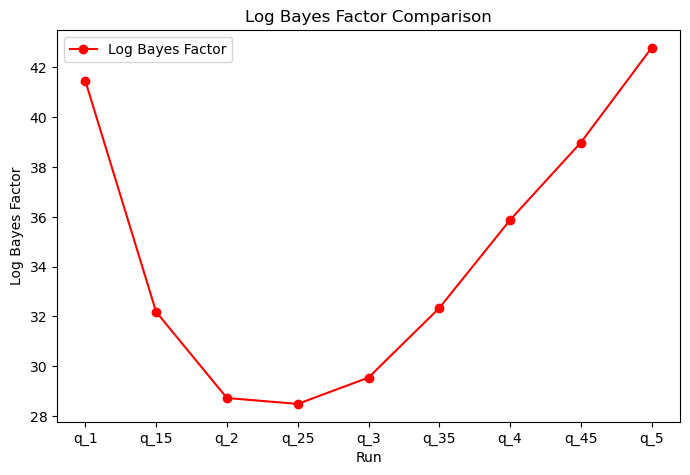

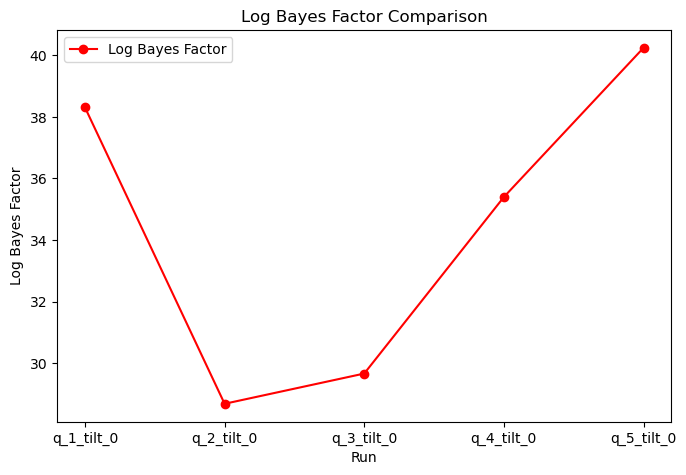

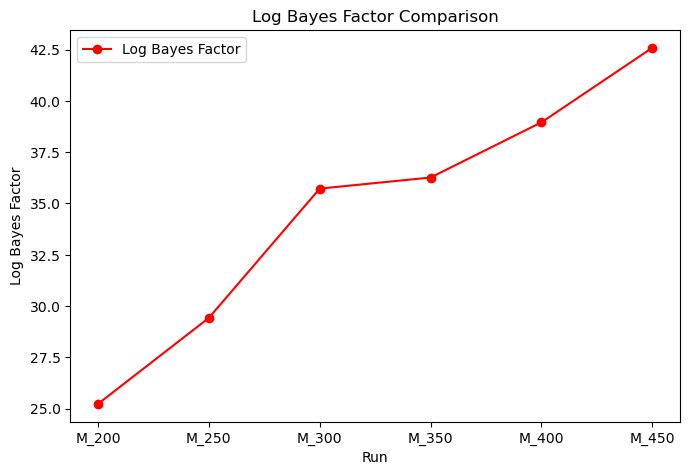

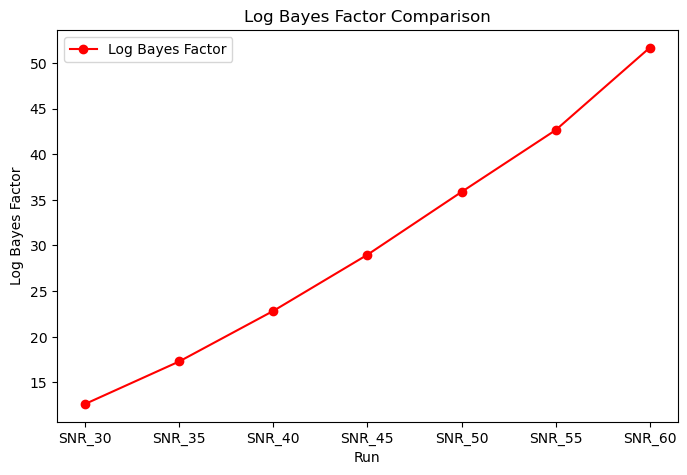

In [73]:
bf_plotter(q_bf, q_log_bf, q_names, save_path='./plots/bf_q.pdf')
bf_plotter(q_tilt_bf, q_tilt_log_bf, q_tilt_names, save_path='./plots/bf_q_tilt.pdf')
bf_plotter(M_bf, M_log_bf, M_names, save_path='./plots/bf_total_mass.pdf')
bf_plotter(SNR_bf, SNR_log_bf, SNR_names, save_path='./plots/bf_SNR.pdf')